# DriverLens: PDAC normal-to-tumor driver genes

Goal: use every GEO `GSE*_RAW.tar` in this folder to discover robust, interpretable genes that drive a transition from normal-like to tumor-like cell states.

Core ideas (method is intentionally distinct from CellNavi):
- Interpretable gene programs via NMF (non-negative matrix factorization)
- A 1D transition score in program space (projection onto source->target direction)
- Bootstrapped driver-gene stability
- Cross-cohort meta ranking for reproducibility

This notebook is designed to be runnable end-to-end and to write all outputs under `processed/`, `models/`, and `results/`.


In [1]:
from __future__ import annotations

import importlib.util
import subprocess
import gc
import sys
import re
from pathlib import Path

# Ensure the local package is importable from the repo without requiring an editable install.
def find_repo_root(start: Path) -> Path:
    start = start.resolve()
    for p in [start] + list(start.parents):
        if (p / "driverlens" / "src" / "driverlens").exists():
            return p
        if list(p.glob("GSE*_RAW.tar")):
            return p
    return start

REPO_ROOT = find_repo_root(Path.cwd())

dl_src = (REPO_ROOT / "driverlens" / "src").resolve()
if dl_src.exists():
    dl_src_str = str(dl_src)
    if dl_src_str not in sys.path:
        sys.path.insert(0, dl_src_str)

import anndata as ad
import joblib
import numpy as np
import pandas as pd

from driverlens.classifier import predict_malignant_proba, train_binary_malignant_classifier
from driverlens.drivers import rank_driver_genes_bootstrap
from driverlens.meta import aggregate_driver_rankings
from driverlens.models.nmf import train_nmf_model
from driverlens.project import ingest_all_raw_tars, scan_raw_tars
from driverlens.transition import quantile_bins, transition_projection_score

pd.set_option("display.max_rows", 60)

# Optional plotting (install if missing)
try:
    import matplotlib
except ModuleNotFoundError:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "matplotlib"])
    import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
plt.ioff()

from cycler import cycler

# Optional: Nature-style defaults via SciencePlots (pip: scienceplots)
try:
    import scienceplots  # noqa: F401

    plt.style.use(["science", "nature", "no-latex"])
except Exception:
    pass

# Publication-style visuals (consistent palette + subtle grid + clean spines)
PALETTE = ["#1F4E79", "#2A9D8F", "#C97C5D", "#264653", "#E9C46A", "#6C757D"]
PRIMARY_COLOR = PALETTE[0]
ACCENT_COLOR = PALETTE[2]
HIGHLIGHT_COLOR = PALETTE[1]

plt.rcParams.update(
    {
        "font.family": "sans-serif",
        "font.sans-serif": [
            "Arial",
            "Helvetica",
            "Source Han Sans SC",
            "Noto Sans CJK SC",
            "Microsoft YaHei",
            "SimHei",
            "DejaVu Sans",
        ],
        "axes.prop_cycle": cycler(color=PALETTE),
        "figure.facecolor": "#FFFFFF",
        "axes.facecolor": "#FFFFFF",
        "savefig.facecolor": "#FFFFFF",
        "axes.edgecolor": "#1A1A1A",
        "axes.linewidth": 0.8,
        "axes.grid": False,
        "axes.axisbelow": True,
        "axes.titleweight": "bold",
        "axes.titlecolor": "#111111",
        "axes.labelcolor": "#222222",
        "axes.titlesize": 12,
        "axes.titlelocation": "left",
        "axes.titlepad": 6,
        "axes.labelsize": 10,
        "axes.labelpad": 6,
        "grid.color": "#E5E5E5",
        "grid.linewidth": 0.6,
        "grid.alpha": 0.7,
        "lines.linewidth": 1.6,
        "lines.markersize": 4.5,
        "xtick.color": "#333333",
        "ytick.color": "#333333",
        "xtick.labelsize": 9,
        "ytick.labelsize": 9,
        "axes.spines.top": False,
        "axes.spines.right": False,
        "legend.frameon": False,
        "figure.dpi": 160,
        "savefig.dpi": 300,
        "patch.edgecolor": "#2F2F2F",
        "patch.linewidth": 0.5,
        "pdf.fonttype": 42,
        "ps.fonttype": 42,
        "savefig.transparent": False,
        "axes.unicode_minus": False,
    }
)


def add_panel_labels(axes, labels=None, *, x=0.01, y=0.99) -> None:
    """Add panel letters (A/B/...) for multi-panel figures."""
    if isinstance(axes, (np.ndarray, list, tuple)):
        axes_list = list(axes)
    else:
        axes_list = [axes]
    if labels is None:
        labels = [chr(ord("A") + i) for i in range(len(axes_list))]
    for ax, lab in zip(axes_list, labels):
        try:
            ax.text(
                x,
                y,
                str(lab),
                transform=ax.transAxes,
                ha="left",
                va="top",
                fontsize=14,
                fontweight="bold",
                color="#1F2D3A",
                bbox={"boxstyle": "round,pad=0.25", "facecolor": "#FFFFFF", "edgecolor": "none", "alpha": 0.85},
                zorder=10,
            )
        except Exception:
            continue


def ensure_gene_name_index(adata: ad.AnnData) -> ad.AnnData:
    """Ensure adata.var_names are gene symbols for cross-dataset scoring."""
    if adata.var_names.name == "gene_name":
        return adata
    if "gene_name" not in adata.var.columns:
        return adata
    from driverlens.io import _collapse_duplicate_vars

    var = adata.var.copy()
    if "gene_id" not in var.columns:
        var["gene_id"] = adata.var_names.astype(str)
    mtx = adata.X.T.tocsr()
    mtx2, var2 = _collapse_duplicate_vars(mtx, var, key_col="gene_name")
    out = ad.AnnData(X=mtx2.T.tocsr(), obs=adata.obs.copy(), var=var2)
    if out.var.index.name == "gene_name" and "gene_name" in out.var.columns:
        out.var = out.var.drop(columns=["gene_name"])
    out.uns = dict(adata.uns)
    return out


In [2]:
import os
# Project configuration
ROOT = REPO_ROOT
PROCESSED_DIR = ROOT / "processed"
ANNOTATIONS_DIR = ROOT / "raw"
MODELS_DIR = ROOT / "models"
RESULTS_DIR = ROOT / "results"

VAR_INDEX = "gene_name"  # recommended for cross-dataset work
SEED = 0

RETRAIN_CLASSIFIER = False
RETRAIN_NMF = False
RECOMPUTE_SCORED = False
REBUILD_ATLAS = False

# Simplification toggles (default: atlas-wide analysis only)
RUN_PER_GSE_DRIVER_ANALYSIS = False  # deprecated: per-GSE driver ranking
RUN_REFERENCE_COHORT_TRANSITION = False  # optional: reference-cohort slicing demo
RUN_SPATIAL_ANALYSIS = False  # optional: spatial demo
SHOW_GSE_BREAKDOWN_PLOTS = False  # optional: show GSE-level summaries

GSE_MAX_CELLS = 5000

# NMF
N_COMPONENTS = 64
N_HVG = 3000

# Classifiers (LogReg): larger C => weaker regularization
MALIGNANT_CLASSIFIER_C = 5.0
STATE_CLASSIFIER_C = 5.0
NMF_MAX_ITER = 800
ATLAS_NMF_MAX_CELLS = 50000  # downsample for global NMF fit

# Driver ranking
TOP_GENES = 80
BOOTSTRAP_N = 60

# Define pseudo-states from malignant probability when cell-type labels are absent.
LOW_Q = 0.2
HIGH_Q = 0.8

# Atlas integration (all datasets)
ATLAS_PATH = PROCESSED_DIR / "atlas_all.h5ad"
ATLAS_SCORED_PATH = PROCESSED_DIR / "atlas_all_scored.h5ad"
ATLAS_JOIN = "outer"  # outer keeps union of genes; inner keeps intersection
ATLAS_MAX_CELLS_PER_SAMPLE = 1000  # downsample per sample to keep atlas tractable

# Slicing resolution
TRANSITION_N_BINS = 50
SPATIAL_N_SLICES = 20

# Mutation/perturbation panel (edit as needed)
MUTATION_GENES = ["KRAS", "TP53", "SMAD4", "CDKN2A"]


# Figures
FIG_DIR = RESULTS_DIR / "figures"
FIG_DIR.mkdir(parents=True, exist_ok=True)


def _display_image(path: Path) -> None:
    try:
        from IPython.display import Image, display

        display(Image(filename=str(path)))
    except Exception:
        print("Saved:", path)


def _display_caption(text: str) -> None:
    if not text:
        return
    try:
        from IPython.display import Markdown, display

        display(
            Markdown(
                "<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F;"
                " padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>"
                f"{text}"
                "</div>"
            )
        )
    except Exception:
        print(text)


CAPTION_MAP = {
    "scan_raw_tars_table": "扫描到的 GEO 原始 tar 概览，用于核对数据集是否齐全以及样本规模。",
    "scan_raw_tars_n_samples": "不同 GSE 的样本数量对比，便于评估数据规模与潜在偏倚。",
    "scan_raw_tars_formats_stacked": "不同输入格式（10x_h5/10x_mtx/wide_matrix 等）在各 GSE 中的组成，用于评估数据来源与格式差异。",
    "paper_workflow_overview": "全流程总览（graphical abstract）：从 GEO 原始 tar 统一 ingest、构建 atlas/迁移轴、driver 基因筛选到突变/扰动模拟的端到端分析路径。",
    "registry_head": "样本注册表前几行，用于确认 ingest 是否成功并记录 h5ad 路径。",
    "registry_status_counts": "ingest 状态统计，快速定位失败/跳过的样本。",
    "registry_samples_per_gse": "各 GSE 可用样本数分布，识别样本极少或异常的数据集。",
    "atlas_shape": "atlas 的总细胞数与基因数，用于确认拼接规模是否合理。",
    "atlas_cells_per_gse_top30": "atlas 中各 GSE 的细胞贡献排名，避免被单一数据集主导。",
    "classifier_top_positive_coefs": "恶性分类器的正向系数基因，值越大越倾向恶性表型。",
    "classifier_top_positive_coefs_table": "与上图对应的基因列表与系数，便于进一步筛选候选 driver。",
    "classifier_top_coefs_signed": "分类器最重要的正/负向系数对比：正向更偏恶性，负向更偏正常（可解释的线性贡献）。",
    "classifier_top_coefs_table": "分类器 top 系数基因列表（含正负号），便于在论文中列为 marker/driver 候选。",
    "classifier_quality_roc_oof": "交叉验证（out-of-fold）诊断图：ROC/PR/校准曲线/预测分布，用于评估区分能力、阈值与概率校准质量。",
    "classifier_oof_confusion_matrix": "基于 out-of-fold 最优阈值（thr*）的混淆矩阵（含行内比例），用于直观展示误分类型与误差结构。",
    "navigator_head": "导航索引表头部，包含每个样本的恶性概率统计，作为下游筛选依据。",
    "navigator_malignant_proba_mean_hist": "样本级恶性概率均值分布，用于检查是否存在明显分层。",
    "navigator_malignant_proba_mean_by_gse_top15": "GSE 级恶性均值对比，观察不同队列的整体偏移。",
    "atlas_malignant_proba_hist": "atlas 中细胞恶性概率分布，用于检验 pseudo-state 切分合理性。",
    "atlas_malignant_proba_thresholds": "恶性概率分布并标出 LOW_Q/HIGH_Q 阈值，用于解释 pseudo-state 的切分依据与边界。",
    "atlas_malignant_proba_violin": "不同 pseudo-state 的恶性概率分布（小提琴图），用于直观验证三类状态的分离程度。",
    "atlas_dl_state_global_counts": "pseudo-state（Normal/Intermediate/Tumor）细胞数统计，避免严重不平衡。",
    "atlas_program_pca_embedding": "在 NMF program 活性空间做 PCA 降维（以 transition_score / pseudo-state / malignant_proba 着色），用于展示连续迁移轨迹在低维空间中的几何结构与分离度。",
    "atlas_nmf_program_delta_top12": "NormalLike→TumorLike 过程中变化幅度最大的 NMF programs（TumorLike- NormalLike）的 Δ 活性柱状图：用于解释‘哪些程序’在驱动迁移。",
    "atlas_nmf_program_delta_top12_table": "与 program Δ 活性对应的 component top genes 表：用于将程序变化映射到可解释的基因模块并支撑论文叙述。",
    "atlas_state_fraction_by_gse_top20": "各 GSE 中三类 pseudo-state 的比例（top20 GSE），用于检查队列间状态组成差异与批次偏倚。",
    "atlas_state_fraction_heatmap_by_gse_top20": "GSE×pseudo-state 的比例热图（top20 GSE），用于快速定位状态比例异常的数据集。",
    "meta_drivers_top30_mean_rank": "跨数据集 meta-driver 排名（mean_rank 越小越好），优先关注高一致性基因。",
    "meta_drivers_top30_summary": "meta-driver 综合图：mean_rank 与 support 同时展示，优先关注 support 高且 mean_rank 小的基因。",
    "meta_drivers_head40": "meta-driver 前 40 行表格，便于快速查看候选基因与支持度。",
    "drivers_heatmap_meta30_by_gse": "meta top30 基因在各 GSE 中的 driver 分数热图，用于观察跨队列一致性与差异。",
    "drivers_corr_meta30_by_gse": "基于 meta-top 基因在各队列的 driver 分数，计算队列间 Spearman 相关性并做层次聚类排序：用于量化跨队列可重复性与相似性结构。",
    "atlas_transition_slicing": "atlas 的 transition score 切片均值及区间（p10–p90），展示从 NormalLike 到 TumorLike 的连续趋势与不确定度。",
    "atlas_transition_vs_malignant_hexbin": "transition_score 与 malignant_proba 的关系图（密度六边形）：用于验证迁移轴与恶性表型的一致性。",
    "atlas_transition_score_by_state": "不同 pseudo-state 的 transition score 分布对比，用于验证迁移轴与状态切分一致。",
    "GSE242230_transition_slicing": "参考队列的 transition score 切片均值及区间（p10–p90），用于对照整体趋势。",
    "GSE111672_spatial_malignant_score": "空间恶性概率地图 + 方向/径向趋势，展示组织空间异质性与梯度变化。",
    "GSE111672_spatial_top_gene_maps": "GSE111672 空间 top driver 候选基因的表达热图（按表达分位数平滑）并叠加恶性区域等值线：用于直观展示候选基因在组织空间中的富集位置与恶性区域关系。",
    "mutation_effect_KO_by_state_head30": "基因 KO 在不同 pseudo-state 中的影响摘要，delta_logit 表示方向与强度。",
    "mutation_effect_KO_by_transition_bin_head30": "按 transition bin 汇总 KO 效应，用于观察沿迁移轴的变化。",
    "mutation_KO_delta_logit_grid": "多个基因的 KO 对 malignant logit 的影响（均值±区间）在迁移轴上的对比。",
    "mutation_KO_delta_proba_grid": "多个基因的 KO 对 malignant proba 的影响（均值±区间）在迁移轴上的对比。",
    "mutation_KO_delta_logit_heatmap_by_bin": "基因×迁移分箱的 KO delta_logit 热图：红色更促恶性，蓝色更抑恶性。",
    "mutation_KO_delta_proba_heatmap_by_bin": "基因×迁移分箱的 KO delta_proba 热图：用于直观比较不同迁移阶段的效应差异。",
    "mutation_KO_delta_logit_heatmap_by_state": "基因×pseudo-state 的 KO delta_logit 热图，用于比较不同状态下的敏感性差异。",
}


def caption_for(name: str) -> str:
    if not name:
        return ""

    def _extra_hint(n: str) -> str:
        n = str(n)
        if "head" in n or "_table" in n or n.endswith("_table"):
            return "读表要点：优先关注排序列（如 score/composite_score/p_adj）与稳健性指标（support/topk_freq/置信区间等）；如需全量字段与进一步筛选请使用 results/ 目录中的 TSV。"
        if "network" in n:
            return "读图要点：节点大小通常表示中心性（越大越‘枢纽’），颜色表示社区/模块；静态图只标注少量关键节点以避免重叠，其余节点可在交互图缩放并悬停查看。"
        if "gprofiler" in n or "enrich" in n or "enrichment" in n:
            return "读图要点：优先看 FDR(p_adj) 与 intersection_size；跨基因集合重复出现（term support 高）的主题更稳健，更适合写作论证。"
        if "classifier" in n:
            return "读图要点：ROC/PR 衡量区分度，校准曲线看概率可信度；系数图用于解释哪些基因更‘推动’恶性/正常方向。"
        if "transition" in n or "slice" in n or "slices" in n:
            return "读图要点：关注趋势是否单调/分层清晰，并对照 n_cells 评估稳定性（小样本 bin 容易波动）。"
        if "mutation" in n or "perturb" in n:
            return "读图要点：优先看 delta_logit（避免 proba 饱和）；结合 baseline_* 判断不同状态/阶段的敏感性差异。"
        if "registry" in n or "scan_raw_tars" in n:
            return "读图要点：先确认样本数与格式分布是否符合预期，再定位缺失/异常队列。"
        return "读图要点：关注组间差异、趋势与稳健性；必要时回到 results/ 目录中的 TSV 做更细致筛选。"

    if name in CAPTION_MAP:
        base = CAPTION_MAP[name]
    else:
        base = ""
        m = re.match(r"drivers_(.+)_top20_(?:bar|summary)$", name)
        if m:
            gse_id = m.group(1)
            base = f"{gse_id} 数据集中 NormalLike→TumorLike 的 top20 driver 综合展示：score_mean±std 与 topk_freq 共同反映贡献与稳健性。"
        m = re.match(r"drivers_(.+)_top20$", name) if not base else None
        if m:
            gse_id = m.group(1)
            base = f"{gse_id} 数据集中 NormalLike→TumorLike 的 top20 driver 基因表，便于查阅与导出。"
        m = re.match(r"GSE111672_spatial_(.+)_drivers_top20_(?:bar|summary)$", name) if not base else None
        if m:
            axis = m.group(1)
            axis_label = {"xslice": "x 方向切片", "yslice": "y 方向切片", "radial": "径向切片"}.get(axis, axis)
            base = f"GSE111672 空间切片（{axis_label}）的 top20 driver 综合展示：score_mean±std 与 topk_freq 共同反映空间梯度上的关键变化与稳健性。"
        m = re.match(r"GSE111672_spatial_(.+)_drivers_top20$", name) if not base else None
        if m:
            axis = m.group(1)
            axis_label = {"xslice": "x 方向切片", "yslice": "y 方向切片", "radial": "径向切片"}.get(axis, axis)
            base = f"GSE111672 空间切片（{axis_label}）的 top20 driver 基因表，便于追踪空间相关基因。"
        m = re.match(r"mutation_KO_effect_(.+)_by_bin", name) if not base else None
        if m:
            gene = m.group(1)
            base = f"以 {gene} 为例的 KO 效应曲线，展示恶性概率沿迁移轴的变化趋势。"
        m = re.match(r"mutation_KO_delta_logit_(.+)_by_bin", name) if not base else None
        if m:
            gene = m.group(1)
            base = f"{gene} KO 对 malignant logit 的影响沿迁移轴变化，logit 更敏感于非饱和区间。"
        m = re.match(r"mutation_KO_delta_proba_(.+)_by_bin", name) if not base else None
        if m:
            gene = m.group(1)
            base = f"{gene} KO 对 malignant proba 的影响沿迁移轴变化，在极端区间可能出现饱和。"
        m = re.match(r"mutation_effect_(.+)_KO_delta_logit_(?:bar|heatmap)$", name) if not base else None
        if m:
            state = m.group(1)
            state_disp = state.replace("_", " ")
            base = f"{state_disp} 状态模型下的 KO 效应汇总（delta_logit），可筛选影响最大的候选基因并比较不同群体差异。"
        m = re.match(r"mutation_effect_(.+)_head30", name) if not base else None
        if m:
            label = m.group(1).replace("_", " ")
            base = f"{label} 的扰动效应表（前 30 行），用于快速查看主效应基因。"
        if not base:
            base = "该图展示了本步骤的主要输出，可用于检查结果合理性并支撑后续写作。"

    extra = _extra_hint(name)
    if extra:
        return f"{base}\n\n{extra}" if base else extra
    return base


SAVE_FIG_FORMATS = ("png", "pdf")  # paper-friendly: png for preview, pdf for submission


def savefig(fig, name: str, *, dpi: int = 300, caption: str | None = None) -> Path:
    import warnings

    # Some composite figures (colorbars/gridspec/suptitle) are not fully compatible with tight_layout.
    if not bool(getattr(fig, "_skip_tight_layout", False)):
        with warnings.catch_warnings():
            warnings.filterwarnings(
                "ignore",
                message="This figure includes Axes that are not compatible with tight_layout",
            )
            try:
                fig.tight_layout()
            except Exception:
                pass

    path_png = FIG_DIR / f"{name}.png"
    fig.savefig(path_png, dpi=dpi, bbox_inches="tight", pad_inches=0.08)
    if "pdf" in SAVE_FIG_FORMATS:
        path_pdf = FIG_DIR / f"{name}.pdf"
        fig.savefig(path_pdf, bbox_inches="tight", pad_inches=0.08)

    plt.close(fig)
    _display_image(path_png)
    _display_caption(caption if caption is not None else caption_for(name))
    return path_png


def save_table(
    df: pd.DataFrame,
    name: str,
    *,
    max_rows: int = 25,
    max_cols: int = 12,
    max_str_len: int = 24,
    float_fmt: str = "{:.4g}",
    caption: str | None = None,
) -> Path:
    """Save a table to TSV and print a text preview (no image tables)."""

    out_dir = RESULTS_DIR / "tables"
    out_dir.mkdir(parents=True, exist_ok=True)
    out_path = out_dir / f"{name}.tsv"
    try:
        df.to_csv(out_path, sep="\t", index=False)
    except Exception:
        # best-effort fallback
        df.to_csv(out_path, sep="\t", index=True)

    sub = df.copy()
    if max_cols is not None:
        sub = sub.iloc[:, : int(max_cols)]
    if max_rows is not None:
        sub = sub.head(int(max_rows))

    # Normalize path-like columns to basenames and format numbers to keep preview compact.
    path_cols = {"h5ad", "input_h5ad", "raw_tar", "model"}
    for col in sub.columns:
        col_lower = str(col).lower()
        is_path = col_lower in path_cols or col_lower.endswith(("_path", "_file", "_tar", "_h5ad"))
        if is_path:
            sub[col] = sub[col].map(lambda x: Path(str(x)).name if pd.notna(x) else "")
            continue
        if pd.api.types.is_numeric_dtype(sub[col]):
            sub[col] = sub[col].map(lambda x: "" if pd.isna(x) else float_fmt.format(float(x)))
        else:
            sub[col] = sub[col].map(lambda x: "" if pd.isna(x) else str(x))

    def _trim_text(val: str) -> str:
        if max_str_len is None:
            return val
        if len(val) <= max_str_len:
            return val
        if max_str_len <= 3:
            return val[:max_str_len]
        return val[: max_str_len - 3] + "..."

    sub = sub.apply(lambda col: col.map(_trim_text))

    caption_base = caption if caption is not None else caption_for(name)
    r_txt = f"前 {int(max_rows)} 行" if max_rows is not None else "全部行"
    c_txt = f"前 {int(max_cols)} 列" if max_cols is not None else "全部列"
    preview_note = (
        f"表格预览：仅展示 {r_txt} × {c_txt}（为便于展示，数值已格式化、长文本已截断）。\n"
        f"完整表格已保存：{out_path.as_posix()}"
    )
    caption_eff = f"{caption_base}\n\n{preview_note}" if caption_base else preview_note

    _display_caption(caption_eff)

    with pd.option_context(
        "display.max_rows",
        int(max_rows) if max_rows is not None else 60,
        "display.max_columns",
        int(max_cols) if max_cols is not None else 20,
        "display.width",
        120,
        "display.max_colwidth",
        int(max_str_len) if max_str_len is not None else 80,
    ):
        try:
            print(sub.to_string(index=False))
        except Exception:
            print(sub)

    return out_path

## 1) Discover and ingest all datasets

DriverLens reads each `GSE*_RAW.tar` and ingests per-sample matrices into `processed/{GSE}/{sample}.h5ad`.
If a dataset provides cell-level annotation files on GEO, they are downloaded to `raw/{GSE}/` and joined into `obs`.


<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>扫描到的 GEO 原始 tar 概览，用于核对数据集是否齐全以及样本规模。

读表要点：优先关注排序列（如 score/composite_score/p_adj）与稳健性指标（support/topk_freq/置信区间等）；如需全量字段与进一步筛选请使用 results/ 目录中的 TSV。

表格预览：仅展示 前 30 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/scan_raw_tars_table.tsv</div>

   gse_id           raw_tar      format n_samples
GSE111672 GSE111672_RAW.tar wide_matrix        25
GSE165399 GSE165399_RAW.tar wide_matrix         3
GSE179705 GSE179705_RAW.tar     10x_mtx         5
GSE197177 GSE197177_RAW.tar     10x_mtx         8
GSE212461 GSE212461_RAW.tar     10x_mtx         5
GSE212482 GSE212482_RAW.tar     10x_mtx         5
GSE212966 GSE212966_RAW.tar     10x_mtx        12
GSE217845 GSE217845_RAW.tar     10x_mtx        16
GSE222011 GSE222011_RAW.tar      10x_h5         5
GSE235449 GSE235449_RAW.tar     10x_mtx         1
GSE241233 GSE241233_RAW.tar wide_matrix         7
GSE242230 GSE242230_RAW.tar     10x_mtx        25
GSE248800 GSE248800_RAW.tar      10x_h5        17
GSE283206 GSE283206_RAW.tar     10x_mtx        12
GSE300304 GSE300304_RAW.tar      10x_h5        10


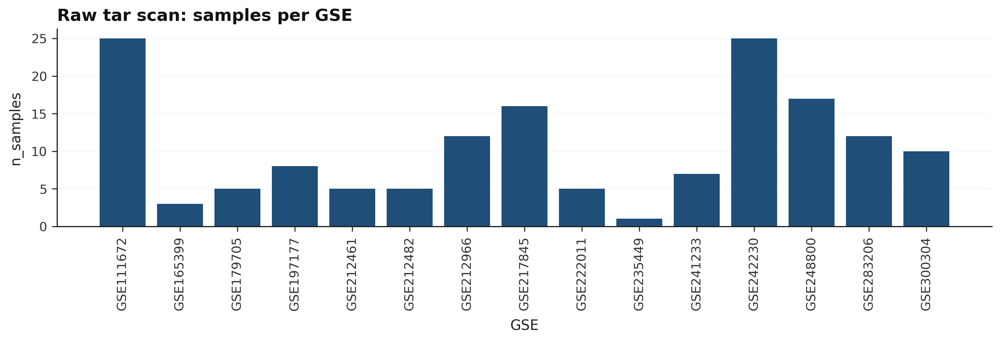

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>不同 GSE 的样本数量对比，便于评估数据规模与潜在偏倚。

读图要点：先确认样本数与格式分布是否符合预期，再定位缺失/异常队列。</div>

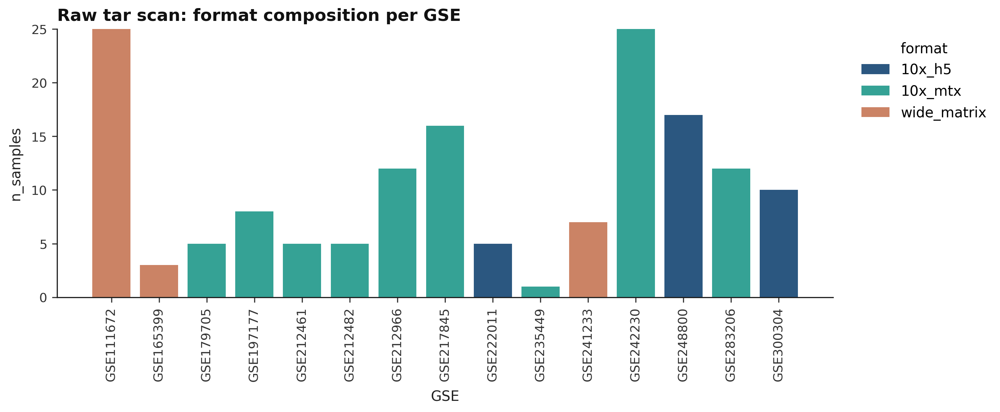

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>不同输入格式（10x_h5/10x_mtx/wide_matrix 等）在各 GSE 中的组成，用于评估数据来源与格式差异。

读图要点：先确认样本数与格式分布是否符合预期，再定位缺失/异常队列。</div>

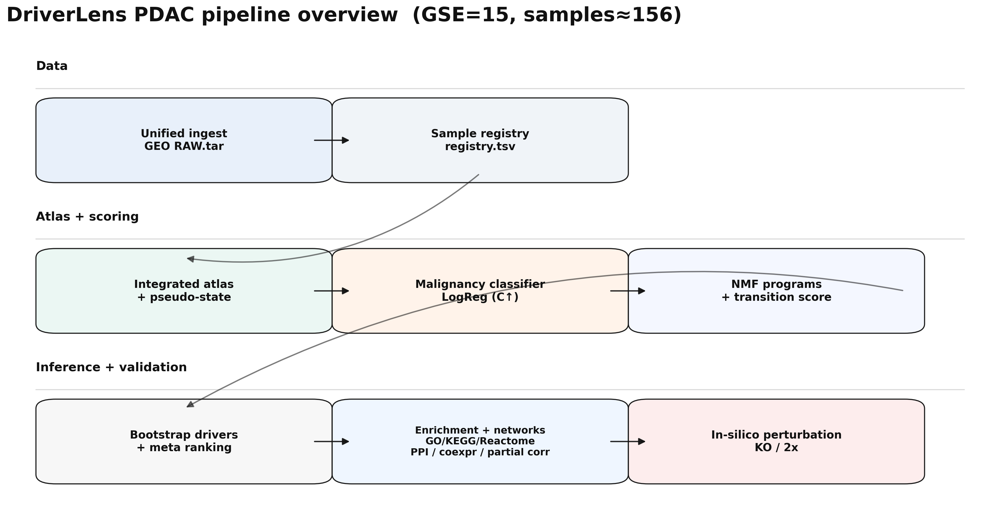

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>全流程总览（graphical abstract）：从 GEO 原始 tar 统一 ingest、构建 atlas/迁移轴、driver 基因筛选到突变/扰动模拟的端到端分析路径。

读图要点：关注组间差异、趋势与稳健性；必要时回到 results/ 目录中的 TSV 做更细致筛选。</div>

In [3]:
scan = scan_raw_tars(ROOT)

# Plots: raw tar scan
save_table(scan, "scan_raw_tars_table", max_rows=30)

fig, ax = plt.subplots(figsize=(10, 3.5))
ax.bar(scan["gse_id"].astype(str), scan["n_samples"].astype(int))
ax.set_xlabel("GSE")
ax.set_ylabel("n_samples")
ax.set_title("Raw tar scan: samples per GSE")
ax.tick_params(axis="x", rotation=90)
ax.grid(True, axis="y", alpha=0.3)
savefig(fig, "scan_raw_tars_n_samples")

# Plot: stacked composition by format
if (not scan.empty) and ("format" in scan.columns):
    fmt = (
        scan.pivot_table(index="gse_id", columns="format", values="n_samples", aggfunc="sum", fill_value=0)
        .sort_index()
    )
    fig, ax = plt.subplots(figsize=(10, 4.2))
    bottom = np.zeros(len(fmt), dtype=float)
    for col in fmt.columns:
        vals = fmt[col].to_numpy(dtype=float)
        ax.bar(fmt.index.astype(str), vals, bottom=bottom, label=str(col), alpha=0.95)
        bottom += vals
    ax.set_title("Raw tar scan: format composition per GSE")
    ax.set_xlabel("GSE")
    ax.set_ylabel("n_samples")
    ax.tick_params(axis="x", rotation=90)
    ax.legend(title="format", bbox_to_anchor=(1.02, 1), loc="upper left", ncol=1)
    savefig(fig, "scan_raw_tars_formats_stacked")

# Paper-style overview diagram (graphical abstract)
try:
    from matplotlib.patches import FancyArrowPatch, FancyBboxPatch

    n_gse = int(scan.shape[0])
    n_samples_total = int(scan['n_samples'].sum()) if ('n_samples' in scan.columns and not scan.empty) else 0
    title = f'DriverLens PDAC pipeline overview  (GSE={n_gse}, samples≈{n_samples_total})'

    # Multi-layer graphical abstract (avoid single-row crowding)
    fig, ax = plt.subplots(figsize=(12.8, 6.6))
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.axis('off')

    def _box(x, y, w, h, text, fc, *, fontsize=10, weight='bold'):
        patch = FancyBboxPatch(
            (x, y),
            w,
            h,
            boxstyle='round,pad=0.02,rounding_size=0.02',
            transform=ax.transAxes,
            facecolor=fc,
            edgecolor='#111111',
            linewidth=1.0,
            alpha=0.95,
        )
        ax.add_patch(patch)
        ax.text(
            x + w / 2,
            y + h / 2,
            text,
            transform=ax.transAxes,
            ha='center',
            va='center',
            fontsize=fontsize,
            fontweight=weight,
            color='#111111',
        )
        return (x, y, w, h)

    def _arrow(p1, p2, *, ms=13, lw=1.2, alpha=0.9, cs='arc3,rad=0.0'):
        arr = FancyArrowPatch(
            p1,
            p2,
            transform=ax.transAxes,
            arrowstyle='-|>',
            mutation_scale=ms,
            linewidth=lw,
            color='#111111',
            alpha=alpha,
            connectionstyle=cs,
        )
        ax.add_patch(arr)

    def _connect(b_from, b_to, *, mode='h', rad=0.0, alpha=0.9):
        x, y, w, h = b_from
        x2, y2, w2, h2 = b_to
        cs = f'arc3,rad={float(rad):.3f}'
        if mode == 'h':
            _arrow((x + w, y + h / 2), (x2, y2 + h2 / 2), cs=cs, alpha=alpha)
        elif mode == 'v':
            _arrow((x + w / 2, y), (x2 + w2 / 2, y2 + h2), cs=cs, alpha=alpha)
        elif mode == 'diag':
            _arrow((x + w, y + h / 2), (x2 + w2 / 2, y2 + h2), cs=cs, alpha=alpha)

    # Layer headers (for a clearer story in the graphical abstract)
    ax.text(0.03, 0.92, 'Data', transform=ax.transAxes, fontsize=11, fontweight='bold', color='#111111')
    ax.text(0.03, 0.60, 'Atlas + scoring', transform=ax.transAxes, fontsize=11, fontweight='bold', color='#111111')
    ax.text(0.03, 0.28, 'Inference + validation', transform=ax.transAxes, fontsize=11, fontweight='bold', color='#111111')
    ax.plot([0.03, 0.97], [0.88, 0.88], transform=ax.transAxes, color='#111111', alpha=0.15, linewidth=1.0)
    ax.plot([0.03, 0.97], [0.56, 0.56], transform=ax.transAxes, color='#111111', alpha=0.15, linewidth=1.0)
    ax.plot([0.03, 0.97], [0.24, 0.24], transform=ax.transAxes, color='#111111', alpha=0.15, linewidth=1.0)

    # Row 1: data ingest
    y1 = 0.70
    w = 0.26
    h = 0.14
    gap = 0.04
    b_raw = _box(0.05, y1, w, h, 'Unified ingest\nGEO RAW.tar', '#E7F0FA')
    b_reg = _box(0.05 + (w + gap), y1, w, h, 'Sample registry\nregistry.tsv', '#F0F4F8')
    _connect(b_raw, b_reg, mode='h', rad=0.0, alpha=0.9)

    # Row 2: atlas + scoring
    y2 = 0.38
    b_atlas = _box(0.05, y2, w, h, 'Integrated atlas\n+ pseudo-state', '#EAF7F3')
    b_clf = _box(0.05 + (w + gap), y2, w, h, 'Malignancy classifier\nLogReg (C↑)', '#FFF3E9')
    b_nmf = _box(0.05 + 2 * (w + gap), y2, w, h, 'NMF programs\n+ transition score', '#F4F7FF')
    _connect(b_reg, b_atlas, mode='v', rad=-0.22, alpha=0.55)
    _connect(b_atlas, b_clf, mode='h', rad=0.0, alpha=0.9)
    _connect(b_clf, b_nmf, mode='h', rad=0.0, alpha=0.9)

    # Row 3: inference/validation
    y3 = 0.06
    b_drv = _box(0.05, y3, w, h, 'Bootstrap drivers\n+ meta ranking', '#F7F7F7')
    b_net = _box(
        0.05 + (w + gap),
        y3,
        w,
        h,
        'Enrichment + networks\nGO/KEGG/Reactome\nPPI / coexpr / partial corr',
        '#EFF6FF',
        fontsize=9,
    )
    b_sim = _box(0.05 + 2 * (w + gap), y3, w, h, 'In-silico perturbation\nKO / 2x', '#FDECEC')
    _connect(b_nmf, b_drv, mode='diag', rad=0.18, alpha=0.55)
    _connect(b_drv, b_net, mode='h', rad=0.0, alpha=0.9)
    _connect(b_net, b_sim, mode='h', rad=0.0, alpha=0.9)

    ax.set_title(title, fontsize=18, fontweight='bold', loc='left', pad=10)

    savefig(fig, 'paper_workflow_overview')
except Exception as exc:
    print('Skip workflow overview plot (', exc, ')')


<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>样本注册表前几行，用于确认 ingest 是否成功并记录 h5ad 路径。

读表要点：优先关注排序列（如 score/composite_score/p_adj）与稳健性指标（support/topk_freq/置信区间等）；如需全量字段与进一步筛选请使用 results/ 目录中的 TSV。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/registry_head.tsv</div>

   gse_id      format           raw_tar         sample_id                   h5ad  status n_obs    n_vars annotations
GSE111672 wide_matrix GSE111672_RAW.tar        GSM3036909        GSM3036909.h5ad  exists                            
GSE111672 wide_matrix GSE111672_RAW.tar        GSM3036910        GSM3036910.h5ad  exists                            
GSE111672 wide_matrix GSE111672_RAW.tar        GSM3036911        GSM3036911.h5ad  exists                            
GSE111672 wide_matrix GSE111672_RAW.tar        PDAC-A-ST1        PDAC-A-ST1.h5ad  exists                            
GSE111672 wide_matrix GSE111672_RAW.tar    PDAC-A-indrop3    PDAC-A-indrop3.h5ad  exists                            
GSE111672 wide_matrix GSE111672_RAW.tar    PDAC-A-indrop4    PDAC-A-indrop4.h5ad  exists                            
GSE111672 wide_matrix GSE111672_RAW.tar    PDAC-A-indrop5    PDAC-A-indrop5.h5ad  exists                            
GSE111672 wide_matrix GSE111672_RAW.tar    PDAC-A-indrop6    PDA

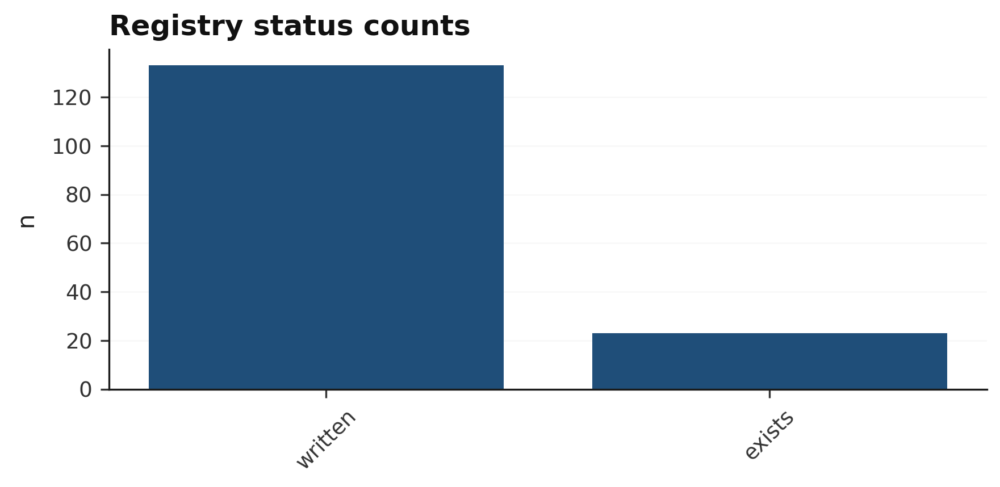

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>ingest 状态统计，快速定位失败/跳过的样本。

读图要点：先确认样本数与格式分布是否符合预期，再定位缺失/异常队列。</div>

In [4]:
PROCESSED_DIR.mkdir(parents=True, exist_ok=True)
RESULTS_DIR.mkdir(parents=True, exist_ok=True)

registry_path = PROCESSED_DIR / "registry.tsv"
if registry_path.exists():
    registry = pd.read_csv(registry_path, sep="\t")
else:
    registry = ingest_all_raw_tars(
        root=ROOT,
        processed_dir=PROCESSED_DIR,
        annotations_dir=ANNOTATIONS_DIR,
        var_index=VAR_INDEX,
        overwrite=False,
    )
    registry.to_csv(registry_path, sep="\t", index=False)

# Registry summary
save_table(registry.head(30), "registry_head")

if "status" in registry.columns:
    fig, ax = plt.subplots(figsize=(6, 3))
    vc = registry["status"].fillna("NA").value_counts()
    ax.bar(vc.index.astype(str), vc.to_numpy())
    ax.set_title("Registry status counts")
    ax.set_ylabel("n")
    ax.tick_params(axis="x", rotation=45)
    ax.grid(True, axis="y", alpha=0.3)
    savefig(fig, "registry_status_counts")

if SHOW_GSE_BREAKDOWN_PLOTS:
    fig, ax = plt.subplots(figsize=(10, 3.5))
    vc = registry.groupby("gse_id").size().sort_values(ascending=False)
    ax.bar(vc.index.astype(str), vc.to_numpy())
    ax.set_title("Registry: samples per GSE")
    ax.set_ylabel("n_samples")
    ax.tick_params(axis="x", rotation=90)
    ax.grid(True, axis="y", alpha=0.3)
    savefig(fig, "registry_samples_per_gse")


## 1b) Build a unified atlas (all datasets)

This step concatenates all ingested per-sample h5ad files into one atlas for global prediction.
If this is too large for memory, set `ATLAS_MAX_CELLS_PER_SAMPLE` to a number.


In [5]:
from driverlens.project import build_atlas_h5ad

if REBUILD_ATLAS or not ATLAS_PATH.exists():
    info = build_atlas_h5ad(
        registry=registry,
        out_h5ad=ATLAS_PATH,
        max_cells_per_sample=ATLAS_MAX_CELLS_PER_SAMPLE,
        seed=SEED,
        join=ATLAS_JOIN,
    )
    print(info)

atlas = ad.read_h5ad(ATLAS_PATH)
atlas

# Atlas composition
save_table(pd.DataFrame({"n_obs": [atlas.n_obs], "n_vars": [atlas.n_vars]}), "atlas_shape")

if SHOW_GSE_BREAKDOWN_PLOTS and "gse_id" in atlas.obs.columns:
    vc = atlas.obs["gse_id"].astype(str).value_counts().head(30)
    fig, ax = plt.subplots(figsize=(10, 4))
    ax.bar(vc.index.astype(str), vc.to_numpy())
    ax.set_title("Atlas: top GSE by cell count")
    ax.set_ylabel("n_cells")
    ax.tick_params(axis="x", rotation=90)
    ax.grid(True, axis="y", alpha=0.3)
    savefig(fig, "atlas_cells_per_gse_top30")


<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>atlas 的总细胞数与基因数，用于确认拼接规模是否合理。

读图要点：关注组间差异、趋势与稳健性；必要时回到 results/ 目录中的 TSV 做更细致筛选。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/atlas_shape.tsv</div>

    n_obs    n_vars
1.354e+05 2.737e+05


## 2) Train a malignant classifier (reference cohort)

We train an interpretable (L2) logistic regression classifier on a reference dataset that has tumor labels.
This yields a reproducible malignant probability for datasets without detailed annotations.


Loaded classifier: malignant_classifier_gse242230.joblib AUC (CV mean): 0.9991375726635866 C= 5.0


<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>分类器 top 系数基因列表（含正负号），便于在论文中列为 marker/driver 候选。

读表要点：优先关注排序列（如 score/composite_score/p_adj）与稳健性指标（support/topk_freq/置信区间等）；如需全量字段与进一步筛选请使用 results/ 目录中的 TSV。

表格预览：仅展示 前 40 行 × 前 2 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/classifier_top_coefs_table.tsv</div>

    gene    coef
   DEFB1 -0.6355
   FXYD2 -0.6166
  CLDN10 -0.5664
    CD74 -0.5245
     CLU -0.5018
   ANXA4 -0.5007
    SPP1 -0.4643
SERPING1 -0.4415
  SLC4A4 -0.4391
      C3 -0.4322
     UBD -0.4235
SERPINA1 -0.4205
    TGM2 -0.3666
  ISYNA1 -0.3626
   H3F3B -0.3477
   MUC5B -0.3408
     FOS -0.3241
   TACC1 -0.3109
  ATP1A1  -0.302
 HLA-DRA -0.2939
    AGRN -0.2934
   CCND1 -0.2818
  IFITM3 -0.2793
 ZFP36L1 -0.2748
    PPCS -0.2747
   CIRBP -0.2727
  ARGLU1  0.2707
  RNASE1  0.2719
    PERP   0.273
    ASPH  0.2736
  LGALS3  0.2759
  PABPC1  0.2824
  S100A6  0.2995
   LAMB3  0.3011
   CRIP1  0.3124
  CLDN18  0.3311
  TMSB10   0.338
     VIM  0.3392
     LYZ  0.4086
   S100P  0.5085


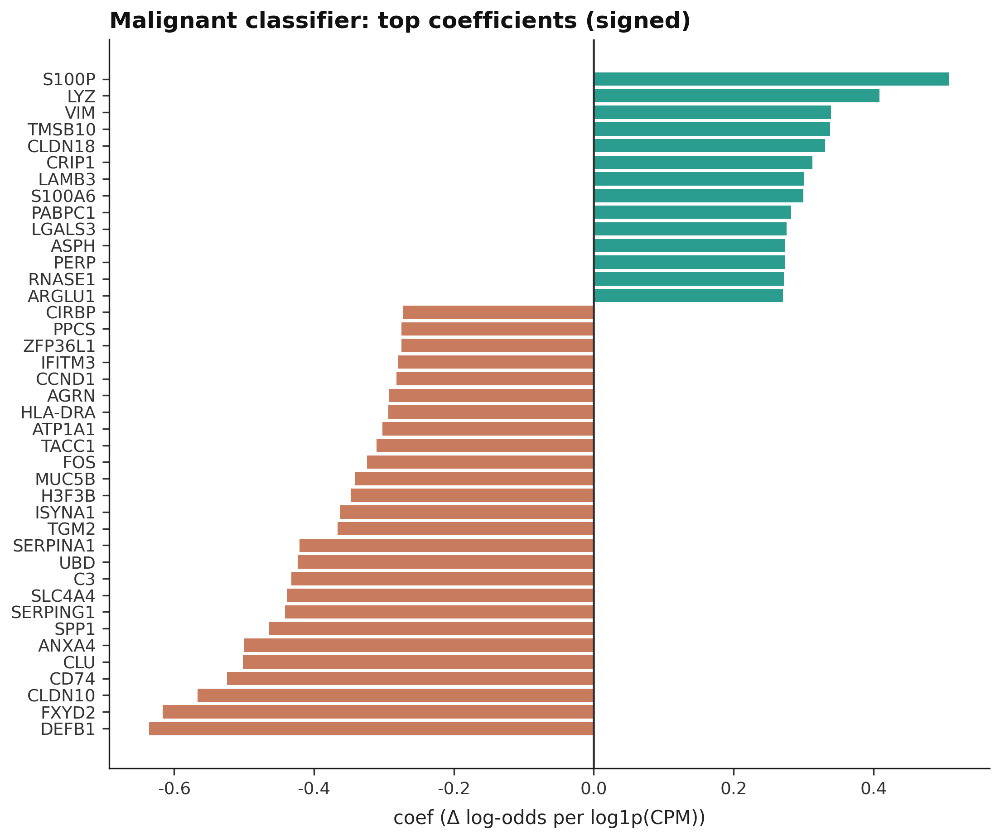

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>分类器最重要的正/负向系数对比：正向更偏恶性，负向更偏正常（可解释的线性贡献）。

读图要点：ROC/PR 衡量区分度，校准曲线看概率可信度；系数图用于解释哪些基因更‘推动’恶性/正常方向。</div>

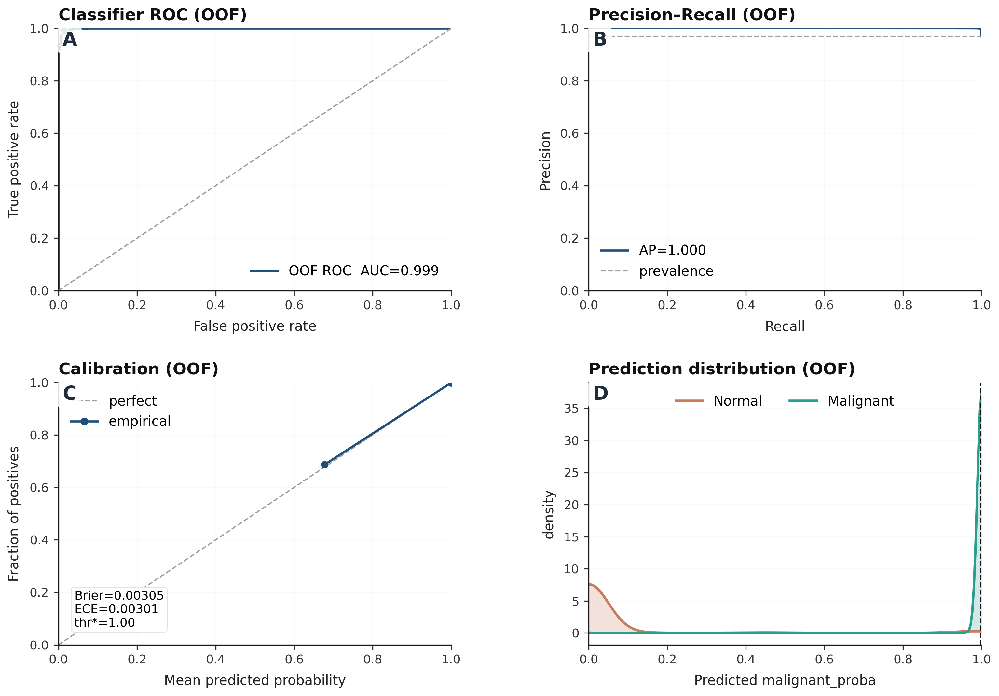

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>交叉验证（out-of-fold）诊断图：ROC/PR/校准曲线/预测分布，用于评估区分能力、阈值与概率校准质量。

读图要点：ROC/PR 衡量区分度，校准曲线看概率可信度；系数图用于解释哪些基因更‘推动’恶性/正常方向。</div>

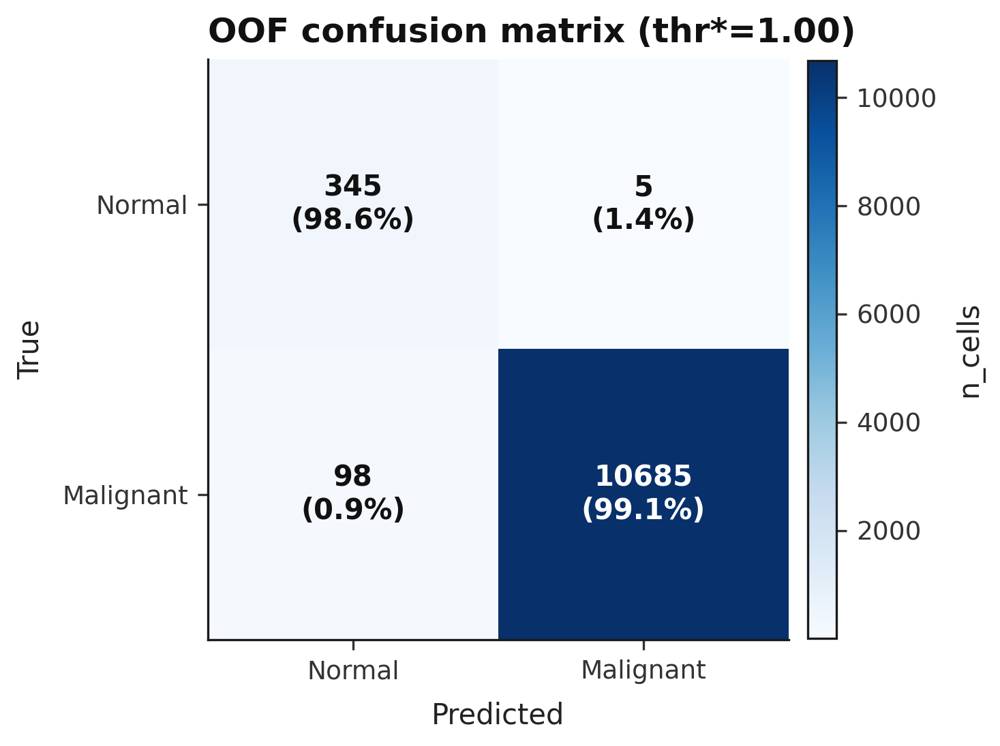

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>基于 out-of-fold 最优阈值（thr*）的混淆矩阵（含行内比例），用于直观展示误分类型与误差结构。

读图要点：ROC/PR 衡量区分度，校准曲线看概率可信度；系数图用于解释哪些基因更‘推动’恶性/正常方向。</div>

In [6]:
sample_paths = sorted(
    p for p in (PROCESSED_DIR / "GSE242230").glob("*.h5ad") if "concat" not in p.name
)
if sample_paths:
    # Preferred: train on the gene_name-indexed cohort produced by ingest-all.
    adata_ref = ad.concat([ad.read_h5ad(p) for p in sample_paths], join="outer", merge="same")
    adata_ref.obs_names_make_unique()
else:
    # Fallback: use a prebuilt reference file, but reindex to gene symbols for cross-dataset scoring.
    ref_path = ROOT / "processed" / "GSE242230_all_filtered.h5ad"
    if not ref_path.exists():
        raise FileNotFoundError(
            "Could not find processed/GSE242230/*.h5ad or processed/GSE242230_all_filtered.h5ad. Run ingestion first."
        )
    adata_ref = ad.read_h5ad(ref_path)
    if adata_ref.var_names.name != "gene_name":
        from driverlens.io import _collapse_duplicate_vars

        var = adata_ref.var.copy()
        if "gene_id" not in var.columns:
            var["gene_id"] = adata_ref.var_names.astype(str)
        mtx = adata_ref.X.T.tocsr()  # genes x cells
        mtx2, var2 = _collapse_duplicate_vars(mtx, var, key_col="gene_name")
        adata_ref = ad.AnnData(X=mtx2.T.tocsr(), obs=adata_ref.obs.copy(), var=var2)

adata_ref = ensure_gene_name_index(adata_ref)

group_col = "cell_type_specific" if "cell_type_specific" in adata_ref.obs.columns else "cell_type"

normal_values = ["Normal Epithelial"]
malignant_values = ["Malignant - Classical", "Malignant - Basal"]

MODELS_DIR.mkdir(parents=True, exist_ok=True)
clf_path = MODELS_DIR / "malignant_classifier_gse242230.joblib"

clf_pack = None
need_train = RETRAIN_CLASSIFIER or not clf_path.exists()
if not need_train:
    clf_pack = joblib.load(clf_path)
    if clf_pack.get("c") != MALIGNANT_CLASSIFIER_C or clf_pack.get("n_hvg") != N_HVG:
        need_train = True

if need_train:
    clf_res = train_binary_malignant_classifier(
        adata=adata_ref,
        group_col=group_col,
        normal_values=normal_values,
        malignant_values=malignant_values,
        n_hvg=N_HVG,
        seed=SEED,
        c=MALIGNANT_CLASSIFIER_C,
        n_splits=5,
        class_weight="balanced",
        force_include_genes=MUTATION_GENES,
    )

    joblib.dump(
        {
            "model": clf_res.model,
            "feature_names": clf_res.feature_names,
            "auc_cv_mean": clf_res.auc_cv_mean,
            "group_col": group_col,
            "normal_values": normal_values,
            "malignant_values": malignant_values,
            "seed": SEED,
            "c": MALIGNANT_CLASSIFIER_C,
            "n_hvg": N_HVG,
        },
        clf_path,
    )

    clf_model = clf_res.model
    clf_features = clf_res.feature_names
    clf_auc = clf_res.auc_cv_mean
    print("AUC (CV mean):", clf_auc, "C=", MALIGNANT_CLASSIFIER_C)
else:
    clf_model = clf_pack["model"]
    clf_features = clf_pack["feature_names"]
    clf_auc = clf_pack.get("auc_cv_mean")
    print("Loaded classifier:", clf_path.name, "AUC (CV mean):", clf_auc, "C=", clf_pack.get("c"))

# Interpretability: top coefficients (signed)
coef = clf_model.coef_.ravel()
feat = np.asarray(clf_features, dtype=object)
top = np.argsort(np.abs(coef))[::-1][:40]
coef_df = pd.DataFrame({"gene": feat[top], "coef": coef[top]}).sort_values("coef")

save_table(coef_df, "classifier_top_coefs_table", max_rows=40, max_cols=2)

fig, ax = plt.subplots(figsize=(7.5, 6.3))
sub = coef_df.copy()
colors = [HIGHLIGHT_COLOR if v > 0 else ACCENT_COLOR for v in sub["coef"].astype(float)]
ax.barh(sub["gene"].astype(str), sub["coef"].astype(float), color=colors)
ax.axvline(0.0, color="#2F2F2F", linewidth=1.1)
ax.set_xlabel("coef (Δ log-odds per log1p(CPM))")
ax.set_title("Malignant classifier: top coefficients (signed)")
savefig(fig, "classifier_top_coefs_signed")

# Classifier quality (out-of-fold): ROC / PR / calibration / distribution
try:
    from driverlens.preprocess import log1p_cpm
    from scipy.stats import gaussian_kde
    from sklearn.base import clone
    from sklearn.calibration import calibration_curve
    from sklearn.metrics import (
        auc,
        average_precision_score,
        confusion_matrix,
        precision_recall_curve,
        roc_curve,
    )
    from sklearn.model_selection import StratifiedKFold

    groups = adata_ref.obs[group_col].astype("string")
    is_neg = groups.isin(normal_values).to_numpy(dtype=bool, na_value=False)
    is_pos = groups.isin(malignant_values).to_numpy(dtype=bool, na_value=False)
    mask = is_neg | is_pos
    y = is_pos[mask].astype(int)

    cols = [adata_ref.var_names.get_loc(g) for g in clf_features]
    X = log1p_cpm(adata_ref.X)[mask][:, cols].tocsr()

    n_pos = int(y.sum())
    n_neg = int(len(y) - n_pos)
    n_splits_eff = int(min(5, n_pos, n_neg))
    cv = StratifiedKFold(n_splits=n_splits_eff, shuffle=True, random_state=SEED)

    proba_oof = np.full_like(y, np.nan, dtype=float)
    for tr, te in cv.split(np.zeros_like(y), y):
        m = clone(clf_model)
        m.fit(X[tr], y[tr])
        proba_oof[te] = m.predict_proba(X[te])[:, 1]

    fpr, tpr, thr = roc_curve(y, proba_oof)
    auc_oof = float(auc(fpr, tpr))
    prec, rec, _ = precision_recall_curve(y, proba_oof)
    ap = float(average_precision_score(y, proba_oof))

    frac_pos, mean_pred = calibration_curve(y, proba_oof, n_bins=10, strategy='quantile')
    brier = float(np.mean((proba_oof - y) ** 2))

    youden = tpr - fpr
    best_i = int(np.nanargmax(youden)) if youden.size else 0
    thr_best = float(thr[best_i]) if thr.size else 0.5

    # Expected calibration error (ECE)
    bins = np.linspace(0.0, 1.0, 11)
    bin_ids = np.digitize(proba_oof, bins) - 1
    ece = 0.0
    for b in range(len(bins) - 1):
        m = bin_ids == b
        if not bool(np.any(m)):
            continue
        w = float(np.mean(m))
        ece += w * float(np.abs(np.mean(proba_oof[m]) - np.mean(y[m])))

    fig = plt.figure(figsize=(12.2, 8.2))
    gs = fig.add_gridspec(2, 2, wspace=0.35, hspace=0.35)
    ax_roc = fig.add_subplot(gs[0, 0])
    ax_pr = fig.add_subplot(gs[0, 1])
    ax_cal = fig.add_subplot(gs[1, 0])
    ax_dist = fig.add_subplot(gs[1, 1])
    add_panel_labels([ax_roc, ax_pr, ax_cal, ax_dist])

    # A) ROC
    ax_roc.plot(fpr, tpr, color=PRIMARY_COLOR, label=f'OOF ROC  AUC={auc_oof:.3f}')
    ax_roc.plot([0, 1], [0, 1], linestyle='--', color='#9AA0A6', linewidth=1.0)
    ax_roc.scatter([fpr[best_i]], [tpr[best_i]], s=28, color=HIGHLIGHT_COLOR, edgecolor='white', linewidth=0.6, zorder=5)
    ax_roc.set_xlabel('False positive rate')
    ax_roc.set_ylabel('True positive rate')
    ax_roc.set_title('Classifier ROC (OOF)')
    ax_roc.set_xlim(0, 1)
    ax_roc.set_ylim(0, 1)
    ax_roc.grid(True, alpha=0.25)
    ax_roc.legend(loc='lower right')

    # B) Precision–Recall
    ax_pr.plot(rec, prec, color=PRIMARY_COLOR, label=f'AP={ap:.3f}')
    ax_pr.axhline(float(np.mean(y)), color='#9AA0A6', linestyle='--', linewidth=1.0, label='prevalence')
    ax_pr.set_xlabel('Recall')
    ax_pr.set_ylabel('Precision')
    ax_pr.set_title('Precision–Recall (OOF)')
    ax_pr.set_xlim(0, 1)
    ax_pr.set_ylim(0, 1)
    ax_pr.grid(True, alpha=0.25)
    ax_pr.legend(loc='lower left')

    # C) Calibration
    ax_cal.plot([0, 1], [0, 1], linestyle='--', color='#9AA0A6', linewidth=1.0, label='perfect')
    ax_cal.plot(mean_pred, frac_pos, marker='o', color=PRIMARY_COLOR, linewidth=1.6, label='empirical')
    ax_cal.set_xlabel('Mean predicted probability')
    ax_cal.set_ylabel('Fraction of positives')
    ax_cal.set_title('Calibration (OOF)')
    ax_cal.set_xlim(0, 1)
    ax_cal.set_ylim(0, 1)
    ax_cal.grid(True, alpha=0.25)
    ax_cal.text(
        0.04,
        0.06,
        f'Brier={brier:.3g}\nECE={ece:.3g}\nthr*={thr_best:.2f}',
        transform=ax_cal.transAxes,
        ha='left',
        va='bottom',
        fontsize=9,
        bbox={'boxstyle': 'round,pad=0.25', 'facecolor': '#FFFFFF', 'edgecolor': '#E0E0E0', 'alpha': 0.95},
    )
    ax_cal.legend(loc='upper left')

    # D) Score distribution (KDE)
    def _kde(ax, vals, *, color, label):
        vals = np.asarray(vals, dtype=float)
        vals = vals[np.isfinite(vals)]
        if vals.size < 8:
            ax.hist(vals, bins=30, density=True, alpha=0.25, color=color, edgecolor='none', label=label)
            return
        xs = np.linspace(0.0, 1.0, 256)
        kde = gaussian_kde(vals, bw_method=0.25)
        ys = kde(xs)
        ax.fill_between(xs, 0.0, ys, color=color, alpha=0.22, linewidth=0)
        ax.plot(xs, ys, color=color, linewidth=1.8, label=label)

    _kde(ax_dist, proba_oof[y == 0], color=ACCENT_COLOR, label='Normal')
    _kde(ax_dist, proba_oof[y == 1], color=HIGHLIGHT_COLOR, label='Malignant')
    ax_dist.axvline(thr_best, color='#111111', linestyle='--', linewidth=1.0)
    ax_dist.set_xlabel('Predicted malignant_proba')
    ax_dist.set_ylabel('density')
    ax_dist.set_title('Prediction distribution (OOF)')
    ax_dist.set_xlim(0, 1)
    ax_dist.grid(True, axis='y', alpha=0.25)
    ax_dist.legend(loc='upper center', ncol=2)

    savefig(fig, 'classifier_quality_roc_oof')

    # Extra: confusion matrix at thr*
    y_hat = (proba_oof >= thr_best).astype(int)
    cm = confusion_matrix(y, y_hat, labels=[0, 1])
    fig, ax = plt.subplots(figsize=(4.8, 4.2))
    im = ax.imshow(cm, cmap='Blues')
    ax.set_xticks([0, 1])
    ax.set_yticks([0, 1])
    ax.set_xticklabels(['Normal', 'Malignant'])
    ax.set_yticklabels(['Normal', 'Malignant'])
    ax.set_xlabel('Predicted')
    ax.set_ylabel('True')
    ax.set_title(f'OOF confusion matrix (thr*={thr_best:.2f})')
    for i in range(2):
        row_sum = float(cm[i].sum()) if float(cm[i].sum()) > 0 else 1.0
        for j in range(2):
            v = int(cm[i, j])
            frac = v / row_sum
            ax.text(
                j,
                i,
                f'{v}\n({frac:.1%})',
                ha='center',
                va='center',
                fontsize=10,
                fontweight='bold',
                color='white' if v >= cm.max() * 0.5 else '#111111',
            )
    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.03)
    cbar.set_label('n_cells')
    savefig(fig, 'classifier_oof_confusion_matrix')
except Exception as exc:
    print("Skip classifier quality plots (", exc, ")")


## 3) Cohort navigation index (all datasets)

We compute malignant probability for each ingested sample and write a compact navigation table.
This table is used to drive downstream per-cohort driver discovery.


<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>导航索引表头部，包含每个样本的恶性概率统计，作为下游筛选依据。

读表要点：优先关注排序列（如 score/composite_score/p_adj）与稳健性指标（support/topk_freq/置信区间等）；如需全量字段与进一步筛选请使用 results/ 目录中的 TSV。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/navigator_head.tsv</div>

   gse_id         sample_id                   h5ad n_obs    n_vars is_spatial malignant_proba_mean malignant_proba_q10 malignant_proba_q50 malignant_proba_q90
GSE111672        GSM3036909        GSM3036909.h5ad  1000 2.737e+05          0               0.7953             0.01132              0.9946                   1
GSE111672        GSM3036910        GSM3036910.h5ad  1000 2.737e+05          0               0.7891            0.003246              0.9961                   1
GSE111672        GSM3036911        GSM3036911.h5ad  1000 2.737e+05          0               0.5002              0.5002              0.5002              0.5002
GSE111672        PDAC-A-ST1        PDAC-A-ST1.h5ad   428 2.737e+05          1               0.3165           8.062e-08            0.007793              0.9996
GSE111672    PDAC-A-indrop3    PDAC-A-indrop3.h5ad  1000 2.737e+05          0                0.799            0.006219              0.9969                   1
GSE111672    PDAC-A-indrop4    PDAC-A-indrop4.

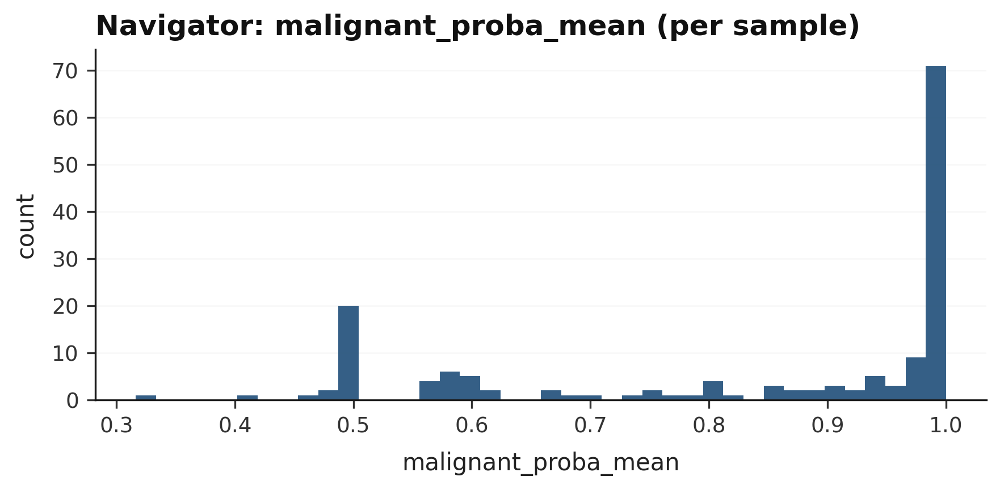

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>样本级恶性概率均值分布，用于检查是否存在明显分层。

读图要点：关注组间差异、趋势与稳健性；必要时回到 results/ 目录中的 TSV 做更细致筛选。</div>

In [7]:
# Build a navigator index from the integrated atlas (no per-dataset re-analysis)
clf_pack = joblib.load(clf_path)
clf_model = clf_pack["model"]
clf_features = clf_pack["feature_names"]

# Ensure the scored atlas exists (malignant_proba + dl_state_global)
if RECOMPUTE_SCORED or not ATLAS_SCORED_PATH.exists():
    atlas_tmp = ad.read_h5ad(ATLAS_PATH)
    atlas_tmp.obs["malignant_proba"] = predict_malignant_proba(
        adata=atlas_tmp,
        model=clf_model,
        feature_names=clf_features,
        allow_missing=True,
    )

    lo = float(atlas_tmp.obs["malignant_proba"].quantile(LOW_Q))
    hi = float(atlas_tmp.obs["malignant_proba"].quantile(HIGH_Q))
    atlas_tmp.obs["dl_state_global"] = np.where(
        atlas_tmp.obs["malignant_proba"].to_numpy() <= lo,
        "NormalLike",
        np.where(atlas_tmp.obs["malignant_proba"].to_numpy() >= hi, "TumorLike", "Intermediate"),
    )
    atlas_tmp.write_h5ad(ATLAS_SCORED_PATH)

atlas_sc = ad.read_h5ad(ATLAS_SCORED_PATH, backed="r")
obs = atlas_sc.obs.copy()

# Sample-level summary (from atlas, not from per-sample re-scoring)
gb = obs.groupby(["gse_id", "sample_id"], observed=True)
nav = gb["malignant_proba"].agg(
    malignant_proba_mean="mean",
    malignant_proba_q10=lambda x: float(x.quantile(0.1)),
    malignant_proba_q50=lambda x: float(x.quantile(0.5)),
    malignant_proba_q90=lambda x: float(x.quantile(0.9)),
)
nav["n_obs"] = gb.size().astype(int)
nav["n_vars"] = int(atlas_sc.n_vars)
if "is_spatial" in obs.columns:
    nav["is_spatial"] = gb["is_spatial"].any().astype(bool)
else:
    nav["is_spatial"] = False

nav = nav.reset_index()

# Add h5ad path from registry when available (for traceability)
if "h5ad" in registry.columns:
    h5 = (
        registry.dropna(subset=["h5ad"])
        .drop_duplicates(subset=["gse_id", "sample_id"], keep="first")[["gse_id", "sample_id", "h5ad"]]
        .copy()
    )
    nav = nav.merge(h5, on=["gse_id", "sample_id"], how="left")

nav_cols = [
    "gse_id",
    "sample_id",
    "h5ad",
    "n_obs",
    "n_vars",
    "is_spatial",
    "malignant_proba_mean",
    "malignant_proba_q10",
    "malignant_proba_q50",
    "malignant_proba_q90",
]
nav = nav.reindex(columns=[c for c in nav_cols if c in nav.columns]).sort_values(["gse_id", "sample_id"]).reset_index(drop=True)

nav_path = RESULTS_DIR / "navigator_index.tsv"
nav.to_csv(nav_path, sep="	", index=False)

save_table(nav.head(30), "navigator_head")

# Plot: malignant_proba_mean distribution
if not nav.empty:
    fig, ax = plt.subplots(figsize=(6, 3))
    ax.hist(nav["malignant_proba_mean"].to_numpy(), bins=40, color=PRIMARY_COLOR, alpha=0.9)
    ax.set_title("Navigator: malignant_proba_mean (per sample)")
    ax.set_xlabel("malignant_proba_mean")
    ax.set_ylabel("count")
    ax.grid(True, axis="y", alpha=0.3)
    savefig(fig, "navigator_malignant_proba_mean_hist")

    if SHOW_GSE_BREAKDOWN_PLOTS:
        gse_mean = nav.groupby("gse_id")["malignant_proba_mean"].mean().sort_values(ascending=False)
        top_gse = gse_mean.head(15).index
        sub = nav.loc[nav["gse_id"].isin(top_gse)].copy()
        fig, ax = plt.subplots(figsize=(10, 4))
        sub.boxplot(
            column="malignant_proba_mean",
            by="gse_id",
            ax=ax,
            grid=False,
            patch_artist=True,
            boxprops={"facecolor": "#E9C46A", "edgecolor": "#2F2F2F", "linewidth": 0.8},
            medianprops={"color": PRIMARY_COLOR, "linewidth": 1.2},
            whiskerprops={"color": "#2F2F2F", "linewidth": 0.8},
            capprops={"color": "#2F2F2F", "linewidth": 0.8},
        )
        ax.set_title("Navigator: malignant_proba_mean by GSE (top 15)")
        ax.set_xlabel("gse_id")
        ax.set_ylabel("malignant_proba_mean")
        plt.suptitle("")
        ax.tick_params(axis="x", rotation=90)
        ax.grid(True, axis="y", alpha=0.3)
        savefig(fig, "navigator_malignant_proba_mean_by_gse_top15")


## 3b) Score the integrated atlas

Compute malignant probability on the integrated atlas and define a global NormalLike->TumorLike state for downstream slicing and perturbation analysis.


dl_state_global
Intermediate    78038
NormalLike      30290
TumorLike       27082


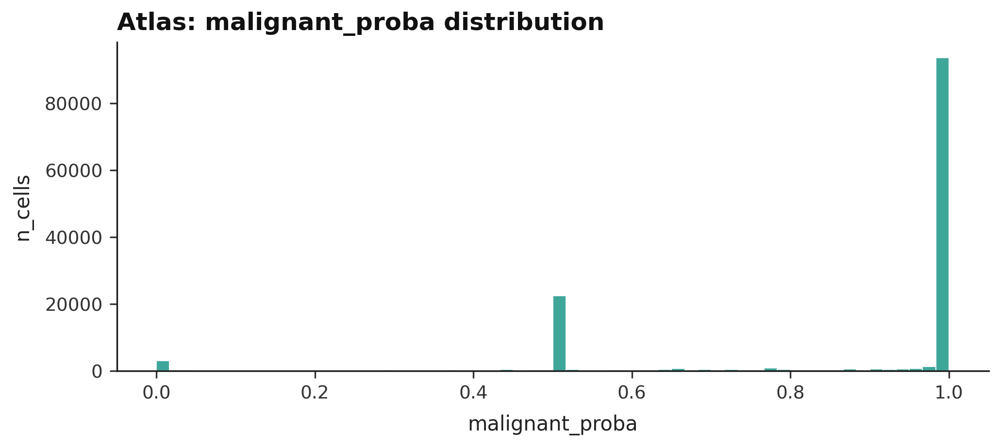

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>atlas 中细胞恶性概率分布，用于检验 pseudo-state 切分合理性。

读图要点：关注组间差异、趋势与稳健性；必要时回到 results/ 目录中的 TSV 做更细致筛选。</div>

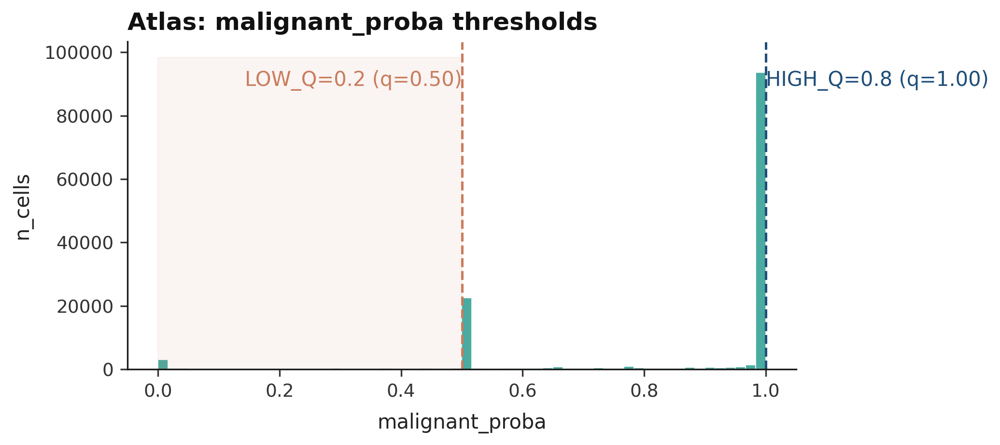

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>恶性概率分布并标出 LOW_Q/HIGH_Q 阈值，用于解释 pseudo-state 的切分依据与边界。

读图要点：关注组间差异、趋势与稳健性；必要时回到 results/ 目录中的 TSV 做更细致筛选。</div>

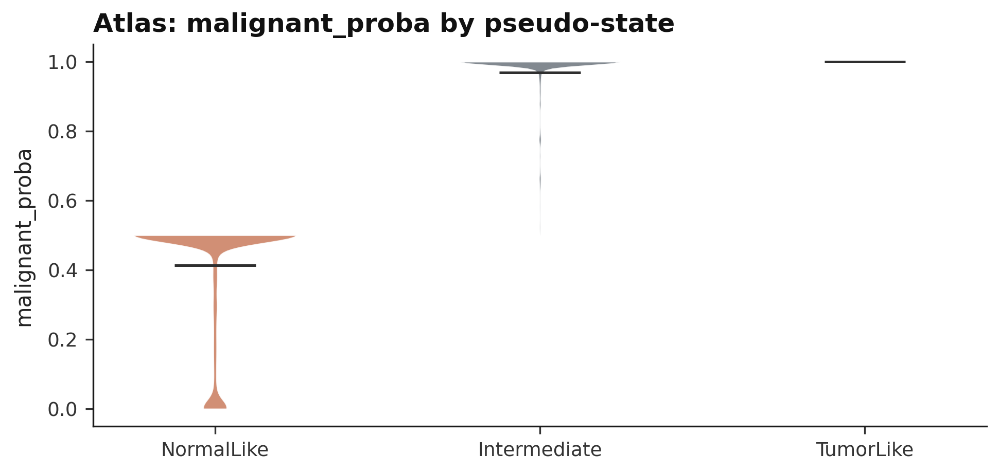

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>不同 pseudo-state 的恶性概率分布（小提琴图），用于直观验证三类状态的分离程度。

读图要点：关注组间差异、趋势与稳健性；必要时回到 results/ 目录中的 TSV 做更细致筛选。</div>

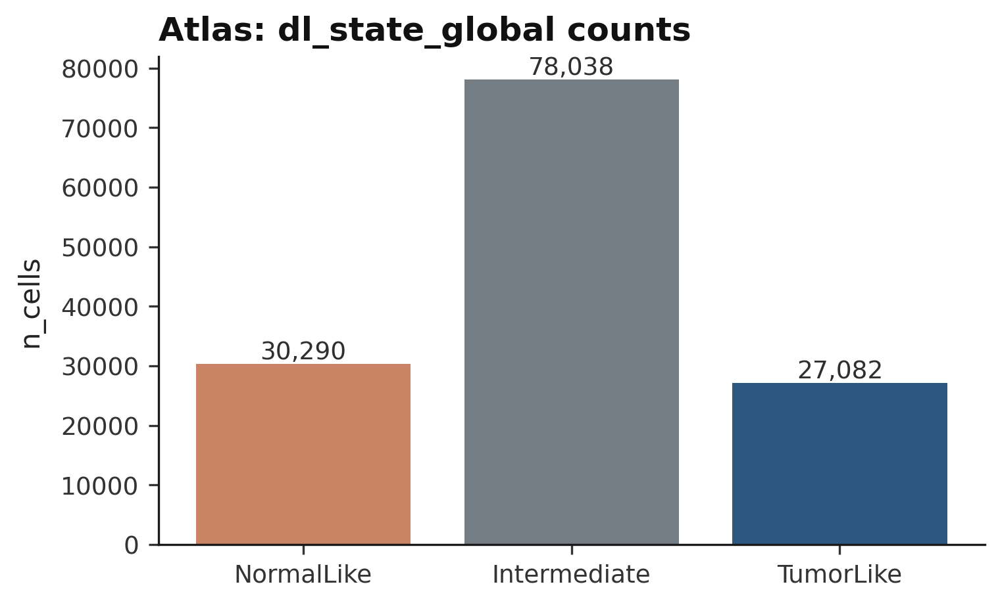

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>pseudo-state（Normal/Intermediate/Tumor）细胞数统计，避免严重不平衡。

读图要点：关注组间差异、趋势与稳健性；必要时回到 results/ 目录中的 TSV 做更细致筛选。</div>

In [8]:
# Load (or build) the scored atlas
if RECOMPUTE_SCORED or not ATLAS_SCORED_PATH.exists():
    atlas = ad.read_h5ad(ATLAS_PATH)
    atlas.obs["malignant_proba"] = predict_malignant_proba(
        adata=atlas,
        model=clf_model,
        feature_names=clf_features,
        allow_missing=True,
    )

    lo = float(atlas.obs["malignant_proba"].quantile(LOW_Q))
    hi = float(atlas.obs["malignant_proba"].quantile(HIGH_Q))
    atlas.obs["dl_state_global"] = np.where(
        atlas.obs["malignant_proba"].to_numpy() <= lo,
        "NormalLike",
        np.where(atlas.obs["malignant_proba"].to_numpy() >= hi, "TumorLike", "Intermediate"),
    )
    atlas.write_h5ad(ATLAS_SCORED_PATH)
else:
    atlas = ad.read_h5ad(ATLAS_SCORED_PATH)

print(atlas.obs["dl_state_global"].value_counts().to_string())

# Atlas malignant probability distribution
fig, ax = plt.subplots(figsize=(7, 3.2))
vals = atlas.obs["malignant_proba"].to_numpy(dtype=float)
ax.hist(vals, bins=60, color=HIGHLIGHT_COLOR, alpha=0.9, edgecolor="white")
ax.set_title("Atlas: malignant_proba distribution")
ax.set_xlabel("malignant_proba")
ax.set_ylabel("n_cells")
savefig(fig, "atlas_malignant_proba_hist")

# Threshold view (pseudo-state definition)
lo = float(atlas.obs["malignant_proba"].quantile(LOW_Q))
hi = float(atlas.obs["malignant_proba"].quantile(HIGH_Q))

fig, ax = plt.subplots(figsize=(7, 3.2))
ax.hist(vals, bins=60, color=HIGHLIGHT_COLOR, alpha=0.85, edgecolor="white")
ax.axvline(lo, color=ACCENT_COLOR, linestyle="--", linewidth=1.2)
ax.axvline(hi, color=PRIMARY_COLOR, linestyle="--", linewidth=1.2)
ymax = ax.get_ylim()[1]
ax.fill_between([0, lo], [0, 0], [ymax, ymax], color=ACCENT_COLOR, alpha=0.08)
ax.fill_between([hi, 1], [0, 0], [ymax, ymax], color=PRIMARY_COLOR, alpha=0.08)
ax.text(lo, ymax * 0.96, f"LOW_Q={LOW_Q} (q={lo:.2f})", ha="right", va="top", color=ACCENT_COLOR)
ax.text(hi, ymax * 0.96, f"HIGH_Q={HIGH_Q} (q={hi:.2f})", ha="left", va="top", color=PRIMARY_COLOR)
ax.set_title("Atlas: malignant_proba thresholds")
ax.set_xlabel("malignant_proba")
ax.set_ylabel("n_cells")
savefig(fig, "atlas_malignant_proba_thresholds")

# Violin plot by pseudo-state
order = ["NormalLike", "Intermediate", "TumorLike"]
data = [atlas.obs.loc[atlas.obs["dl_state_global"] == s, "malignant_proba"].to_numpy(dtype=float) for s in order]
fig, ax = plt.subplots(figsize=(6.6, 3.2))
vp = ax.violinplot(data, showmeans=True, showextrema=False)
state_colors = [ACCENT_COLOR, "#6C757D", PRIMARY_COLOR]
for body, c in zip(vp["bodies"], state_colors):
    body.set_facecolor(c)
    body.set_edgecolor("white")
    body.set_alpha(0.85)
vp["cmeans"].set_color("#2F2F2F")
vp["cmeans"].set_linewidth(1.2)
ax.set_xticks(range(1, len(order) + 1))
ax.set_xticklabels(order)
ax.set_ylabel("malignant_proba")
ax.set_title("Atlas: malignant_proba by pseudo-state")
savefig(fig, "atlas_malignant_proba_violin")

fig, ax = plt.subplots(figsize=(5.2, 3.2))
vc = atlas.obs["dl_state_global"].astype(str).value_counts()
vc = vc.reindex(order)
bars = ax.bar(vc.index.astype(str), vc.to_numpy(), color=state_colors, alpha=0.95)
ax.set_title("Atlas: dl_state_global counts")
ax.set_ylabel("n_cells")
for b in bars:
    ax.text(
        b.get_x() + b.get_width() / 2,
        b.get_height(),
        f"{int(b.get_height()):,}",
        ha="center",
        va="bottom",
        fontsize=9,
        color="#2F2F2F",
    )
savefig(fig, "atlas_dl_state_global_counts")

# Optional: GSE-level pseudo-state composition
if SHOW_GSE_BREAKDOWN_PLOTS and "gse_id" in atlas.obs.columns:
    comp = (
        atlas.obs.groupby(["gse_id", "dl_state_global"]).size().unstack(fill_value=0).reindex(columns=order, fill_value=0)
    )
    top_gse = comp.sum(axis=1).sort_values(ascending=False).head(20).index
    frac = comp.loc[top_gse].div(comp.loc[top_gse].sum(axis=1), axis=0)

    fig, ax = plt.subplots(figsize=(11.2, 4.2))
    bottom = np.zeros(len(frac), dtype=float)
    for state, c in zip(order, state_colors):
        v = frac[state].to_numpy(dtype=float)
        ax.bar(
            frac.index.astype(str),
            v,
            bottom=bottom,
            color=c,
            alpha=0.95,
            edgecolor="white",
            linewidth=0.4,
            label=state,
        )
        bottom += v
    ax.set_ylim(0, 1.0)
    ax.set_ylabel("fraction")
    ax.set_title("Atlas: pseudo-state composition (top 20 GSEs)")
    ax.tick_params(axis="x", rotation=45)
    ax.legend(title="state", bbox_to_anchor=(1.02, 1), loc="upper left")
    savefig(fig, "atlas_state_fraction_by_gse_top20")

    fig, ax = plt.subplots(figsize=(6.8, 1.8 + 0.32 * len(frac)))
    im = ax.imshow(frac[order].to_numpy(dtype=float), aspect="auto", cmap="Blues", vmin=0, vmax=1)
    ax.set_yticks(np.arange(frac.shape[0]))
    ax.set_yticklabels(frac.index.astype(str))
    ax.set_xticks(np.arange(len(order)))
    ax.set_xticklabels(order)
    ax.set_title("Atlas: pseudo-state fractions by GSE")
    cbar = fig.colorbar(im, ax=ax, shrink=0.75, pad=0.02)
    cbar.set_label("fraction")
    savefig(fig, "atlas_state_fraction_heatmap_by_gse_top20")


## 4) Driver discovery (atlas-wide)

This step prioritizes candidate driver genes by contrasting **NormalLike vs TumorLike** cells in the **integrated atlas** (one unified analysis across all datasets).


In [9]:
# Ensure atlas NMF model exists (needed for atlas-wide driver ranking)
atlas_model = MODELS_DIR / "atlas_nmf.joblib"
if RETRAIN_NMF or not atlas_model.exists():
    train_nmf_model(
        input_h5ad=ATLAS_SCORED_PATH,
        out_model=atlas_model,
        n_components=N_COMPONENTS,
        n_hvg=N_HVG,
        seed=SEED,
        max_iter=NMF_MAX_ITER,
        max_cells=ATLAS_NMF_MAX_CELLS,
    )

# Atlas-wide driver ranking (NormalLike -> TumorLike)
drivers_path = RESULTS_DIR / "meta_drivers_NormalLike_to_TumorLike.tsv"
need_recompute = bool(RECOMPUTE_SCORED or RETRAIN_NMF or (not drivers_path.exists()))

if not need_recompute:
    drivers = pd.read_csv(drivers_path, sep="	")
    required = {"gene_name", "score_mean", "score_std", "topk_freq", "top_component"}
    if not required.issubset(set(drivers.columns)):
        need_recompute = True

if need_recompute:
    drivers = rank_driver_genes_bootstrap(
        input_h5ad=ATLAS_SCORED_PATH,
        model_path=atlas_model,
        group_col="dl_state_global",
        source="NormalLike",
        target="TumorLike",
        top=TOP_GENES,
        n_boot=BOOTSTRAP_N,
        seed=SEED,
    )
    drivers.to_csv(drivers_path, sep="	", index=False)

# Text preview (full table on disk)
cols = [c for c in ["gene_name", "score_mean", "score_std", "topk_freq", "top_component"] if c in drivers.columns]
save_table(
    drivers[cols].head(30),
    "meta_drivers_head30",
    max_rows=30,
    max_cols=8,
    max_str_len=60,
    caption="全队列（atlas）driver 基因优先级：以 NMF program 迁移方向为骨架，结合 bootstrap 稳健性（topk_freq/score_std）给出候选排序。",
)


<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>全队列（atlas）driver 基因优先级：以 NMF program 迁移方向为骨架，结合 bootstrap 稳健性（topk_freq/score_std）给出候选排序。

表格预览：仅展示 前 30 行 × 前 8 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/meta_drivers_head30.tsv</div>

gene_name score_mean score_std topk_freq top_component
   MALAT1      4.826   0.01292         1            48
   MT-CO1      4.152    0.0112         1             2
    RPLP1      4.011  0.005652         1             0
   MT-CO2      3.993   0.01091         1             2
      B2M      3.986  0.008852         1            18
    RPL10      3.906  0.005829         1             0
   EEF1A1      3.901  0.006909         1             0
    RPS27      3.873  0.006141         1             0
    RPL41      3.834   0.00656         1             0
    RPL13      3.804  0.005581         1            52
    RPS12      3.801  0.005484         1             0
   TMSB4X      3.754  0.007293         1            29
    RPL28       3.75  0.004628         1             0
   TMSB10      3.696  0.005261         1             0
    RPL39      3.671  0.004339         1             0
   MT-CO3      3.618   0.01195         1             2
    RPL30      3.611  0.004912         1             0
     TPT1 

PosixPath('/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/meta_drivers_head30.tsv')

## 5) Driver ranking summary (atlas-wide)

Summarize the atlas-wide driver list (bootstrap stability + effect size) for reporting and downstream enrichment/network analysis.


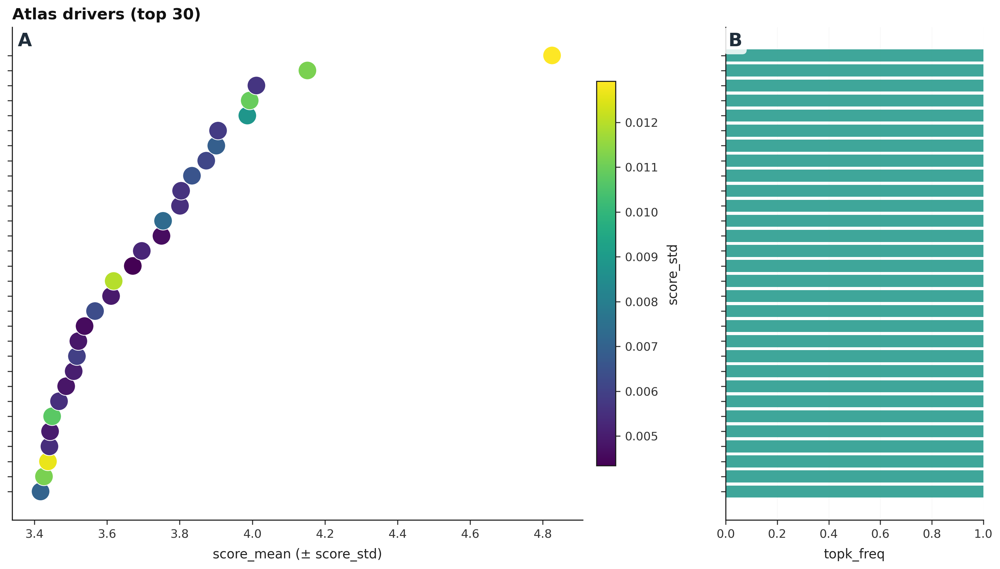

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>meta-driver 综合图：mean_rank 与 support 同时展示，优先关注 support 高且 mean_rank 小的基因。

读图要点：关注组间差异、趋势与稳健性；必要时回到 results/ 目录中的 TSV 做更细致筛选。</div>

In [10]:
drivers_path = RESULTS_DIR / "meta_drivers_NormalLike_to_TumorLike.tsv"
if not drivers_path.exists():
    raise FileNotFoundError("Missing results/meta_drivers_NormalLike_to_TumorLike.tsv. Run section 4 first.")

drivers = pd.read_csv(drivers_path, sep="	")

# Plot: top drivers (atlas-wide)
try:
    top_df = drivers.head(30).copy()
    sub = top_df.sort_values("score_mean", ascending=True).reset_index(drop=True)

    y = np.arange(len(sub), dtype=float)
    score = sub["score_mean"].astype(float).to_numpy()
    std = sub["score_std"].astype(float).to_numpy() if "score_std" in sub.columns else np.zeros_like(score)
    freq = sub["topk_freq"].astype(float).to_numpy() if "topk_freq" in sub.columns else np.ones_like(score)

    fig, (ax1, ax2) = plt.subplots(
        1,
        2,
        figsize=(10.8, 6.2),
        gridspec_kw={"width_ratios": [3.2, 1.2]},
        sharey=True,
    )
    add_panel_labels([ax1, ax2])

    ax1.hlines(y, score - std, score + std, color="#2F2F2F", linewidth=1.0, alpha=0.55)
    sc = ax1.scatter(
        score,
        y,
        s=40 + 160 * freq,
        c=std,
        cmap="viridis",
        edgecolor="white",
        linewidth=0.6,
        zorder=3,
    )
    ax1.set_yticks(y)
    ax1.set_yticklabels(sub["gene_name"].astype(str))
    ax1.set_xlabel("score_mean (± score_std)")
    ax1.set_title("Atlas drivers (top 30)")
    cbar = fig.colorbar(sc, ax=ax1, shrink=0.78, pad=0.02)
    cbar.set_label("score_std")

    ax2.barh(y, freq, color=HIGHLIGHT_COLOR, alpha=0.9)
    ax2.set_xlabel("topk_freq")
    ax2.set_xlim(0.0, 1.0)
    ax2.grid(True, axis="x", alpha=0.25)
    ax2.set_yticks(y)
    ax2.set_yticklabels([])

    savefig(fig, "meta_drivers_top30_summary")
except Exception as exc:
    print("Skip atlas driver summary plot (", exc, ")")


## 6) Transition slicing (atlas)

Build a continuous **transition axis** in the atlas NMF program space, slice cells into quantile bins, and validate its consistency with malignant probability.


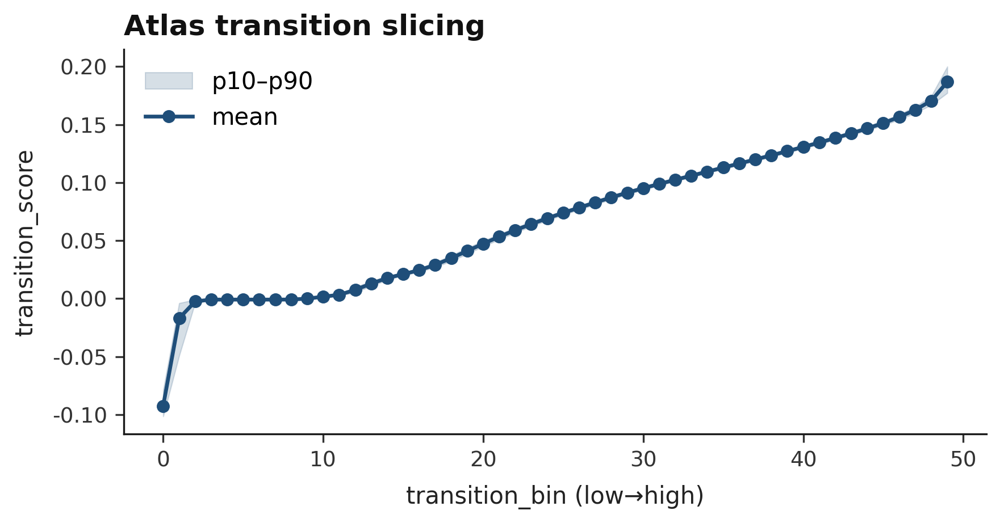

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>atlas 的 transition score 切片均值及区间（p10–p90），展示从 NormalLike 到 TumorLike 的连续趋势与不确定度。

读图要点：关注趋势是否单调/分层清晰，并对照 n_cells 评估稳定性（小样本 bin 容易波动）。</div>

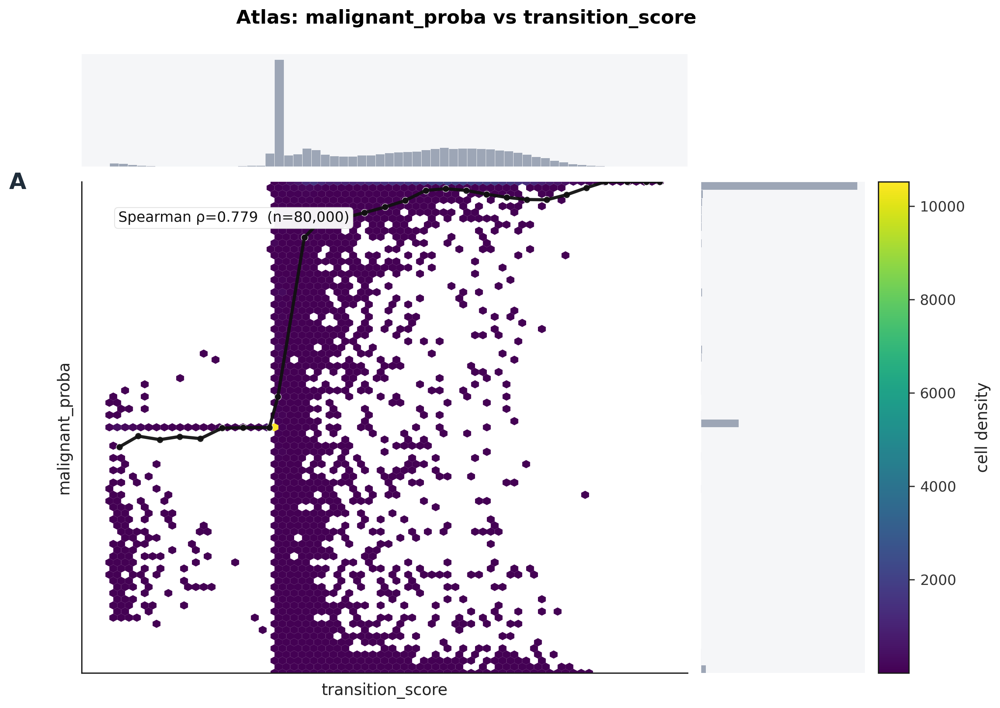

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>transition_score 与 malignant_proba 的关系图（密度六边形）：用于验证迁移轴与恶性表型的一致性。

读图要点：关注趋势是否单调/分层清晰，并对照 n_cells 评估稳定性（小样本 bin 容易波动）。</div>

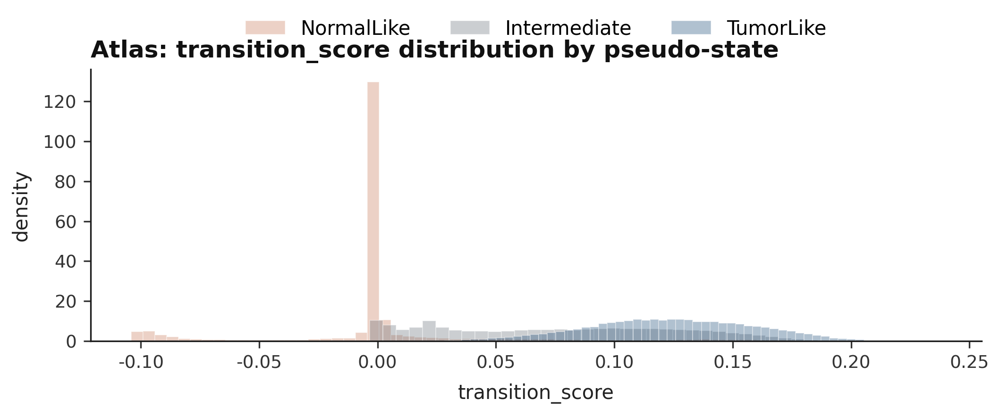

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>不同 pseudo-state 的 transition score 分布对比，用于验证迁移轴与状态切分一致。

读图要点：关注趋势是否单调/分层清晰，并对照 n_cells 评估稳定性（小样本 bin 容易波动）。</div>

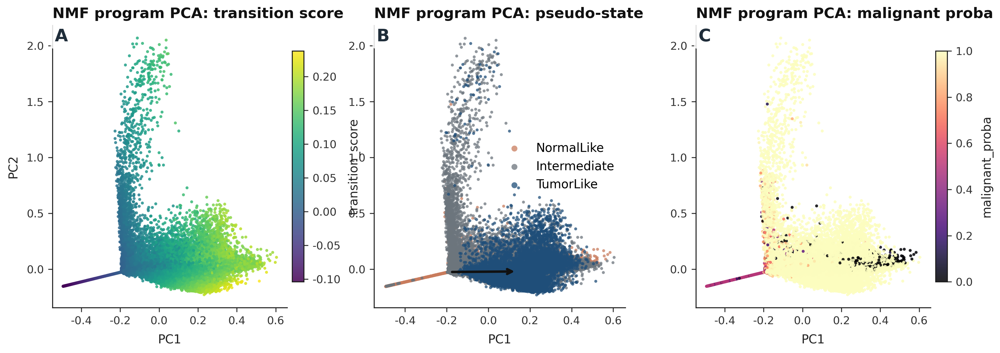

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>在 NMF program 活性空间做 PCA 降维（以 transition_score / pseudo-state / malignant_proba 着色），用于展示连续迁移轨迹在低维空间中的几何结构与分离度。

读图要点：关注组间差异、趋势与稳健性；必要时回到 results/ 目录中的 TSV 做更细致筛选。</div>

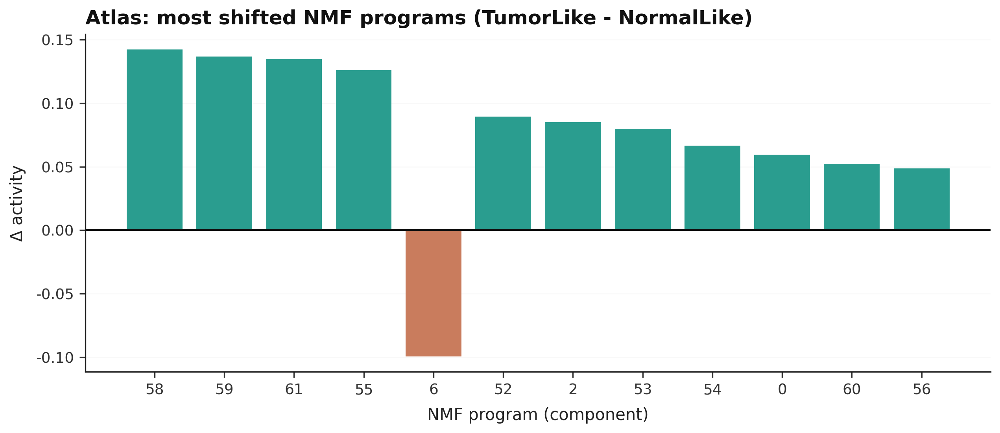

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>NormalLike→TumorLike 过程中变化幅度最大的 NMF programs（TumorLike- NormalLike）的 Δ 活性柱状图：用于解释‘哪些程序’在驱动迁移。

读图要点：关注组间差异、趋势与稳健性；必要时回到 results/ 目录中的 TSV 做更细致筛选。</div>

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>与 program Δ 活性对应的 component top genes 表：用于将程序变化映射到可解释的基因模块并支撑论文叙述。

读表要点：优先关注排序列（如 score/composite_score/p_adj）与稳健性指标（support/topk_freq/置信区间等）；如需全量字段与进一步筛选请使用 results/ 目录中的 TSV。

表格预览：仅展示 前 20 行 × 前 3 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/atlas_nmf_program_delta_top12_table.tsv</div>

component delta_activity                                                                        top_genes
       58         0.1425                                                RPS26,MYL6,RPS8,RPL41,RPL36,RPS28
       59         0.1368                                                    S100A4,IL32,CD52,LTB,VIM,IL7R
       61         0.1346                                           ATP5F1E,NDUFA4,UBL5,SERF2,SRP14,COX7A2
       55         0.1259                                              RPS13,NACA,RPL39,RPL34,RPL30,RPS15A
        6       -0.09937 MouseHashTag4--M1-42_30-F11-TSB,mt-Atp6,mt-Co3,MouseHashTag6--M1-42_30-F11-TS...
       52        0.08955                                                RPL3,RPS2,RACK1,RPLP0,RPS9,RPL10A
        2        0.08528                                       MT-CO3,MT-ND4,MT-ATP6,MT-CO2,MT-CYB,MT-ND2
       53        0.08003                                           RPS29,RPL27A,RPL38,RPL37A,RPS11,RPL13A
       54        0.06664                      

In [11]:
atlas_model = MODELS_DIR / "atlas_nmf.joblib"
if RETRAIN_NMF or not atlas_model.exists():
    train_nmf_model(
        input_h5ad=ATLAS_SCORED_PATH,
        out_model=atlas_model,
        n_components=N_COMPONENTS,
        n_hvg=N_HVG,
        seed=SEED,
        max_iter=NMF_MAX_ITER,
        max_cells=ATLAS_NMF_MAX_CELLS,
    )

atlas_score = transition_projection_score(
    input_h5ad=ATLAS_SCORED_PATH,
    model_path=atlas_model,
    group_col="dl_state_global",
    source="NormalLike",
    target="TumorLike",
)
atlas_bins = quantile_bins(atlas_score, n_bins=TRANSITION_N_BINS)

atlas_slice_df = pd.DataFrame({"transition_score": atlas_score, "bin": atlas_bins})
atlas_slice_tbl = (
    atlas_slice_df.groupby("bin", as_index=False)
    .agg(n_cells=("transition_score", "size"), score_mean=("transition_score", "mean"))
)
atlas_slice_band = (
    atlas_slice_df.groupby("bin", as_index=False)
    .agg(
        score_p10=("transition_score", lambda x: float(pd.Series(x).quantile(0.1))),
        score_p90=("transition_score", lambda x: float(pd.Series(x).quantile(0.9))),
    )
)
atlas_slice_plot = atlas_slice_tbl.merge(atlas_slice_band, on="bin", how="left")
atlas_slice_path = RESULTS_DIR / "atlas_transition_slices.tsv"
atlas_slice_tbl.to_csv(atlas_slice_path, sep="\t", index=False)

fig, ax = plt.subplots(figsize=(6.0, 3.2))
ax.fill_between(
    atlas_slice_plot["bin"].astype(float),
    atlas_slice_plot["score_p10"].astype(float),
    atlas_slice_plot["score_p90"].astype(float),
    color=PRIMARY_COLOR,
    alpha=0.18,
    label="p10–p90",
)
ax.plot(
    atlas_slice_plot["bin"].astype(float),
    atlas_slice_plot["score_mean"].astype(float),
    marker="o",
    color=PRIMARY_COLOR,
    label="mean",
)
ax.set_xlabel("transition_bin (low→high)")
ax.set_ylabel("transition_score")
ax.set_title("Atlas transition slicing")
ax.legend(loc="upper left")
savefig(fig, "atlas_transition_slicing")

# Relationship: malignant_proba vs transition_score
try:
    atlas_sc = ad.read_h5ad(ATLAS_SCORED_PATH)
    df_rel = pd.DataFrame(
        {
            "transition_score": atlas_score,
            "malignant_proba": atlas_sc.obs["malignant_proba"].reindex(atlas_score.index),
        }
    ).dropna()
    if df_rel.shape[0] > 80000:
        df_rel = df_rel.sample(80000, random_state=SEED)
    from scipy.stats import spearmanr

    # Joint-style panel (main hexbin + marginals)
    fig = plt.figure(figsize=(8.4, 6.6))
    gs = fig.add_gridspec(
        2,
        3,
        width_ratios=[7.0, 1.9, 0.35],
        height_ratios=[1.6, 7.0],
        wspace=0.05,
        hspace=0.05,
    )
    ax_main = fig.add_subplot(gs[1, 0])
    ax_right = fig.add_subplot(gs[1, 1], sharey=ax_main)
    ax_cbar = fig.add_subplot(gs[1, 2])
    ax_top = fig.add_subplot(gs[0, 0], sharex=ax_main)
    ax_corner = fig.add_subplot(gs[0, 1])
    ax_corner.axis('off')
    add_panel_labels([ax_main], labels=['A'], x=-0.12, y=1.02)

    x = df_rel['transition_score'].astype(float).to_numpy()
    y = df_rel['malignant_proba'].astype(float).to_numpy()
    rho, _ = spearmanr(x, y)

    hb = ax_main.hexbin(x, y, gridsize=70, cmap='viridis', mincnt=1, linewidths=0.0)
    cbar = fig.colorbar(hb, cax=ax_cbar)
    cbar.set_label('cell density')

    bins = np.linspace(np.nanmin(x), np.nanmax(x), 28)
    b = np.digitize(x, bins) - 1
    trend = (
        pd.DataFrame({'x': x, 'y': y, 'b': b})
        .groupby('b', as_index=False)
        .agg(x=('x', 'mean'), y=('y', 'mean'))
        .dropna()
    )
    ax_main.plot(trend['x'], trend['y'], color='#111111', linewidth=2.0, alpha=0.95)
    ax_main.scatter(trend['x'], trend['y'], color='#111111', s=18, alpha=0.95, edgecolor='white', linewidth=0.3)

    ax_main.set_xlabel('transition_score')
    ax_main.set_ylabel('malignant_proba')
    fig.suptitle('Atlas: malignant_proba vs transition_score', fontsize=12, fontweight='bold', y=0.98)
    fig._skip_tight_layout = True
    fig.subplots_adjust(top=0.92, left=0.10, right=0.96, bottom=0.10)
    ax_main.set_ylim(0, 1)
    ax_main.grid(True, alpha=0.18)
    ax_main.text(
        0.06,
        0.94,
        f'Spearman ρ={float(rho):.3f}  (n={df_rel.shape[0]:,})',
        transform=ax_main.transAxes,
        ha='left',
        va='top',
        fontsize=9,
        color='#111111',
        bbox={'boxstyle': 'round,pad=0.25', 'facecolor': '#FFFFFF', 'edgecolor': '#E0E0E0', 'alpha': 0.95},
    )

    ax_top.set_facecolor('#F5F6F8')
    c_top, _, _ = ax_top.hist(x, bins=60, color='#98A2B3', alpha=0.95, edgecolor='white', linewidth=0.2)
    if len(c_top):
        ax_top.set_ylim(0, float(np.nanmax(c_top)) * 1.05)
    ax_top.set_xticks([])
    ax_top.set_yticks([])
    for spn in ('left', 'right', 'top', 'bottom'):
        ax_top.spines[spn].set_visible(False)

    ax_right.set_facecolor('#F5F6F8')
    c_right, _, _ = ax_right.hist(y, bins=60, orientation='horizontal', color='#98A2B3', alpha=0.95, edgecolor='white', linewidth=0.2)
    if len(c_right):
        ax_right.set_xlim(0, float(np.nanmax(c_right)) * 1.05)
    ax_right.set_xticks([])
    ax_right.set_yticks([])
    for spn in ('left', 'right', 'top', 'bottom'):
        ax_right.spines[spn].set_visible(False)

    # Keep a clean shared border between panels
    plt.setp(ax_right.get_yticklabels(), visible=False)

    savefig(fig, 'atlas_transition_vs_malignant_hexbin')
except Exception as exc:
    print("Skip transition vs malignant plot (", exc, ")")

# Distribution by pseudo-state
try:
    atlas_for_plot = atlas
    if "dl_state_global" not in atlas_for_plot.obs.columns:
        atlas_for_plot = ad.read_h5ad(ATLAS_SCORED_PATH)
except NameError:
    atlas_for_plot = ad.read_h5ad(ATLAS_SCORED_PATH)

states = atlas_for_plot.obs["dl_state_global"].astype(str)
score_aligned = atlas_score.reindex(states.index).to_numpy(dtype=float)

fig, ax = plt.subplots(figsize=(7.2, 3.2))
state_order = ["NormalLike", "Intermediate", "TumorLike"]
state_colors = [ACCENT_COLOR, "#6C757D", PRIMARY_COLOR]
for s, c in zip(state_order, state_colors):
    v = score_aligned[states.to_numpy() == s]
    if v.size == 0:
        continue
    ax.hist(v, bins=60, density=True, alpha=0.35, color=c, edgecolor="white", label=s)
ax.set_xlabel("transition_score")
ax.set_ylabel("density")
ax.set_title("Atlas: transition_score distribution by pseudo-state")
ax.legend(loc="upper center", ncol=3, bbox_to_anchor=(0.5, 1.25))
savefig(fig, "atlas_transition_score_by_state")

# Program-space embedding (PCA on NMF activities)
try:
    from driverlens.preprocess import log1p_cpm
    from sklearn.decomposition import PCA

    pack = joblib.load(atlas_model)
    nmf = pack['nmf']
    hvg = pack['hvg_var_names']

    adata_p = atlas_for_plot[:, hvg].copy()
    if adata_p.n_obs > 60000:
        rng = np.random.default_rng(SEED)
        keep = rng.choice(adata_p.n_obs, size=60000, replace=False)
        keep.sort()
        adata_p = adata_p[keep].copy()

    x = log1p_cpm(adata_p.X)
    w = nmf.transform(x)
    pcs = PCA(n_components=2, random_state=SEED).fit_transform(w)

    df_emb = pd.DataFrame({'PC1': pcs[:, 0], 'PC2': pcs[:, 1]}, index=adata_p.obs_names)
    df_emb['dl_state_global'] = adata_p.obs['dl_state_global'].astype(str).to_numpy()
    if 'malignant_proba' in adata_p.obs.columns:
        df_emb['malignant_proba'] = adata_p.obs['malignant_proba'].astype(float).to_numpy()
    df_emb['transition_score'] = atlas_score.reindex(df_emb.index).astype(float).to_numpy()

    fig, axes = plt.subplots(1, 3, figsize=(13.2, 4.2), gridspec_kw={'wspace': 0.28})
    add_panel_labels(axes)

    ax = axes[0]
    sc = ax.scatter(
        df_emb['PC1'],
        df_emb['PC2'],
        c=df_emb['transition_score'],
        s=6,
        alpha=0.85,
        cmap='viridis',
        linewidth=0,
        rasterized=True,
    )
    ax.set_title('NMF program PCA: transition score')
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    cbar = fig.colorbar(sc, ax=ax, fraction=0.046, pad=0.02)
    cbar.set_label('transition_score')

    ax = axes[1]
    state_order = ['NormalLike', 'Intermediate', 'TumorLike']
    state_colors = {'NormalLike': ACCENT_COLOR, 'Intermediate': '#6C757D', 'TumorLike': PRIMARY_COLOR}
    for st in state_order:
        m = df_emb['dl_state_global'] == st
        if not bool(np.any(m)):
            continue
        ax.scatter(
            df_emb.loc[m, 'PC1'],
            df_emb.loc[m, 'PC2'],
            s=6,
            alpha=0.75,
            color=state_colors[st],
            linewidth=0,
            rasterized=True,
            label=st,
        )
    if bool(np.any(df_emb['dl_state_global'] == 'NormalLike')) and bool(np.any(df_emb['dl_state_global'] == 'TumorLike')):
        c0 = df_emb.loc[df_emb['dl_state_global'] == 'NormalLike', ['PC1', 'PC2']].mean().to_numpy()
        c1 = df_emb.loc[df_emb['dl_state_global'] == 'TumorLike', ['PC1', 'PC2']].mean().to_numpy()
        ax.annotate('', xy=c1, xytext=c0, arrowprops={'arrowstyle': '->', 'lw': 2.0, 'color': '#111111'})
    ax.set_title('NMF program PCA: pseudo-state')
    ax.set_xlabel('PC1')
    ax.set_ylabel('')
    ax.legend(loc='best', markerscale=2.0, frameon=False)

    ax = axes[2]
    if 'malignant_proba' in df_emb.columns:
        sc2 = ax.scatter(
            df_emb['PC1'],
            df_emb['PC2'],
            c=df_emb['malignant_proba'],
            s=6,
            alpha=0.85,
            cmap='magma',
            linewidth=0,
            rasterized=True,
        )
        cbar2 = fig.colorbar(sc2, ax=ax, fraction=0.046, pad=0.02)
        cbar2.set_label('malignant_proba')
    else:
        ax.scatter(df_emb['PC1'], df_emb['PC2'], s=6, alpha=0.7, color='#6C757D', linewidth=0, rasterized=True)
    ax.set_title('NMF program PCA: malignant proba')
    ax.set_xlabel('PC1')
    ax.set_ylabel('')

    savefig(fig, 'atlas_program_pca_embedding')

    # Program deltas: TumorLike - NormalLike in NMF activity space
    st = df_emb['dl_state_global']
    if bool(np.any(st == 'NormalLike')) and bool(np.any(st == 'TumorLike')):
        w_df = pd.DataFrame(w, index=df_emb.index)
        delta = w_df.loc[st == 'TumorLike'].mean(axis=0) - w_df.loc[st == 'NormalLike'].mean(axis=0)
        topk = np.argsort(-np.abs(delta.to_numpy()))[:12]

        fig, ax = plt.subplots(figsize=(8.6, 3.8))
        vals = delta.to_numpy()[topk]
        colors = [HIGHLIGHT_COLOR if v > 0 else ACCENT_COLOR for v in vals]
        ax.bar(np.arange(len(topk)), vals, color=colors)
        ax.axhline(0.0, color='#111111', linewidth=1.0)
        ax.set_xticks(np.arange(len(topk)))
        ax.set_xticklabels([str(i) for i in topk])
        ax.set_xlabel('NMF program (component)')
        ax.set_ylabel('Δ activity')
        ax.set_title('Atlas: most shifted NMF programs (TumorLike - NormalLike)')
        ax.grid(True, axis='y', alpha=0.25)
        savefig(fig, 'atlas_nmf_program_delta_top12')

        rows = []
        h = nmf.components_
        for comp_id in topk:
            gene_idx = np.argsort(-h[int(comp_id)])[:6]
            rows.append(
                {
                    'component': int(comp_id),
                    'delta_activity': float(delta.iloc[int(comp_id)]),
                    'top_genes': ','.join([str(hvg[int(j)]) for j in gene_idx]),
                }
            )
        save_table(
            pd.DataFrame(rows),
            'atlas_nmf_program_delta_top12_table',
            max_rows=20,
            max_cols=3,
            max_str_len=80,
        )
except Exception as exc:
    print('Skip atlas program PCA / delta plots (', exc, ')')


In [12]:
if RUN_REFERENCE_COHORT_TRANSITION:
    gse242230_model = MODELS_DIR / "GSE242230_nmf.joblib"
    if RETRAIN_NMF or not gse242230_model.exists():
        # Use the cohort-level concatenated file built above.
        train_nmf_model(
            input_h5ad=PROCESSED_DIR / "GSE242230" / "GSE242230_concat_scored.h5ad",
            out_model=gse242230_model,
            n_components=N_COMPONENTS,
            n_hvg=N_HVG,
            seed=SEED,
            max_iter=NMF_MAX_ITER,
        )
    
    gse242230_scored = PROCESSED_DIR / "GSE242230" / "GSE242230_concat_scored.h5ad"
    if not gse242230_scored.exists():
        raise FileNotFoundError(
            "Missing processed/GSE242230/GSE242230_concat_scored.h5ad. Run the cohort driver step first."
        )
    
    score = transition_projection_score(
        input_h5ad=gse242230_scored,
        model_path=gse242230_model,
        group_col="cell_type_specific",
        source="Normal Epithelial",
        target="Malignant - Basal",
    )
    
    bins = quantile_bins(score, n_bins=TRANSITION_N_BINS)
    slice_df = pd.DataFrame({"transition_score": score, "bin": bins})
    slice_tbl = (
        slice_df.groupby("bin", as_index=False)
        .agg(n_cells=("transition_score", "size"), score_mean=("transition_score", "mean"))
    )
    slice_band = (
        slice_df.groupby("bin", as_index=False)
        .agg(
            score_p10=("transition_score", lambda x: float(pd.Series(x).quantile(0.1))),
            score_p90=("transition_score", lambda x: float(pd.Series(x).quantile(0.9))),
        )
    )
    slice_plot = slice_tbl.merge(slice_band, on="bin", how="left")
    save_table(slice_tbl, "GSE242230_transition_slices_preview", max_rows=20, max_cols=3)
    
    gse242230_slice_path = RESULTS_DIR / "GSE242230_transition_slices.tsv"
    slice_tbl.to_csv(gse242230_slice_path, sep="\t", index=False)
    
    fig, ax = plt.subplots(figsize=(6.0, 3.2))
    ax.fill_between(
        slice_plot["bin"].astype(float),
        slice_plot["score_p10"].astype(float),
        slice_plot["score_p90"].astype(float),
        color=PRIMARY_COLOR,
        alpha=0.18,
        label="p10–p90",
    )
    ax.plot(
        slice_plot["bin"].astype(float),
        slice_plot["score_mean"].astype(float),
        marker="o",
        color=PRIMARY_COLOR,
        label="mean",
    )
    ax.set_xlabel("transition_bin (low→high)")
    ax.set_ylabel("transition_score")
    ax.set_title("GSE242230 transition slicing")
    ax.legend(loc="upper left")
    savefig(fig, "GSE242230_transition_slicing")
else:
    print("Skip reference-cohort transition demo (RUN_REFERENCE_COHORT_TRANSITION=False).")


Skip reference-cohort transition demo (RUN_REFERENCE_COHORT_TRANSITION=False).


## 7) Spatial example (optional)

This section is optional and disabled by default. The default workflow treats all datasets as a single cohort-level atlas.


In [13]:
if RUN_SPATIAL_ANALYSIS:
    spatial_path = ROOT / "processed" / "GSE111672_PDAC-A-ST1.h5ad"
    if not spatial_path.exists():
        # If you ingested via ingest-all, it will be under processed/GSE111672/.
        cand = sorted((PROCESSED_DIR / "GSE111672").glob("*.h5ad"))
        if not cand:
            raise FileNotFoundError("Could not find a GSE111672 spatial h5ad to demonstrate.")
        spatial_path = cand[0]
    
    adata_sp = ad.read_h5ad(spatial_path)
    adata_sp = ensure_gene_name_index(adata_sp)
    if "x" not in adata_sp.obs.columns or "y" not in adata_sp.obs.columns:
        raise ValueError("Selected sample is not spatial (missing obs['x'] / obs['y']).")
    
    proba_sp = predict_malignant_proba(adata=adata_sp, model=clf_model, feature_names=clf_features, allow_missing=True)
    adata_sp.obs["malignant_proba"] = proba_sp
    
    # Spatial dashboard will be plotted after slice definitions.
    
    # Spatial slices by x-coordinate quantiles
    adata_sp.obs["x_slice"] = pd.qcut(adata_sp.obs["x"].astype(float), q=SPATIAL_N_SLICES, labels=False, duplicates="drop").astype("Int64")
    adata_sp.obs["x_slice_str"] = adata_sp.obs["x_slice"].astype(str)
    
    # Spatial slices by y-coordinate quantiles
    adata_sp.obs["y_slice"] = pd.qcut(adata_sp.obs["y"].astype(float), q=SPATIAL_N_SLICES, labels=False, duplicates="drop").astype("Int64")
    adata_sp.obs["y_slice_str"] = adata_sp.obs["y_slice"].astype(str)
    
    # Radial slices around the tumor-like centroid (high malignant_proba)
    tumor_mask = adata_sp.obs["malignant_proba"] >= float(adata_sp.obs["malignant_proba"].quantile(0.8))
    if bool(tumor_mask.any()):
        cx = float(adata_sp.obs.loc[tumor_mask, "x"].mean())
        cy = float(adata_sp.obs.loc[tumor_mask, "y"].mean())
    else:
        cx = float(adata_sp.obs["x"].mean())
        cy = float(adata_sp.obs["y"].mean())
    
    adata_sp.obs["r"] = np.sqrt((adata_sp.obs["x"] - cx) ** 2 + (adata_sp.obs["y"] - cy) ** 2)
    radial_q = int(min(10, SPATIAL_N_SLICES))
    adata_sp.obs["r_slice"] = pd.qcut(adata_sp.obs["r"], q=radial_q, labels=False, duplicates="drop").astype("Int64")
    adata_sp.obs["r_slice_str"] = adata_sp.obs["r_slice"].astype(str)
    
    # Publication-style spatial dashboard: smoothed malignant map + slice trends
    from scipy.ndimage import gaussian_filter
    
    df_obs = adata_sp.obs[["x", "y", "malignant_proba", "x_slice", "y_slice", "r_slice"]].copy()
    df_obs["x"] = df_obs["x"].astype(float)
    df_obs["y"] = df_obs["y"].astype(float)
    df_obs["malignant_proba"] = df_obs["malignant_proba"].astype(float)
    df_obs["x_slice"] = df_obs["x_slice"].astype(int)
    df_obs["y_slice"] = df_obs["y_slice"].astype(int)
    df_obs["r_slice"] = df_obs["r_slice"].astype(int)
    
    xv = df_obs["x"].to_numpy()
    yv = df_obs["y"].to_numpy()
    vv = df_obs["malignant_proba"].to_numpy()
    
    nx = 180
    ny = 180
    sum_grid, xedges, yedges = np.histogram2d(xv, yv, bins=[nx, ny], weights=vv)
    cnt_grid, _, _ = np.histogram2d(xv, yv, bins=[nx, ny])
    mean_grid = sum_grid / np.maximum(cnt_grid, 1.0)
    mean_grid = gaussian_filter(mean_grid, sigma=2.0)
    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
    
    def _slice_stats(col: str) -> pd.DataFrame:
        out = (
            df_obs.groupby(col)["malignant_proba"]
            .agg(
                mean="mean",
                p10=lambda x: float(pd.Series(x).quantile(0.1)),
                p90=lambda x: float(pd.Series(x).quantile(0.9)),
                n="size",
            )
            .reset_index()
            .sort_values(col)
        )
        return out
    
    xstat = _slice_stats("x_slice")
    ystat = _slice_stats("y_slice")
    rstat = _slice_stats("r_slice")
    
    fig = plt.figure(figsize=(12.8, 7.6))
    gs = fig.add_gridspec(
        3,
        3,
        width_ratios=[1.8, 1.8, 1.2],
        height_ratios=[1.0, 1.0, 1.0],
        wspace=0.35,
        hspace=0.35,
    )
    ax_map = fig.add_subplot(gs[:, :2])
    ax_x = fig.add_subplot(gs[0, 2])
    ax_y = fig.add_subplot(gs[1, 2])
    ax_r = fig.add_subplot(gs[2, 2])
    add_panel_labels([ax_map, ax_x, ax_y, ax_r], labels=["A", "B", "C", "D"])
    
    cmap = plt.cm.magma.copy()
    cmap.set_bad("#FFFFFF")
    masked = np.ma.masked_where(cnt_grid == 0, mean_grid)
    im = ax_map.imshow(masked.T, origin="lower", extent=extent, cmap=cmap, vmin=0, vmax=1, alpha=0.95)
    ax_map.scatter(
        df_obs["x"],
        df_obs["y"],
        s=18,
        c=df_obs["malignant_proba"],
        cmap="magma",
        vmin=0,
        vmax=1,
        edgecolor="white",
        linewidth=0.25,
        alpha=0.85,
    )
    ax_map.set_aspect("equal")
    ax_map.set_xlabel("x")
    ax_map.set_ylabel("y")
    ax_map.set_title(f"GSE111672 spatial malignant score ({spatial_path.name})")
    cbar = fig.colorbar(im, ax=ax_map, fraction=0.045, pad=0.02)
    cbar.set_label("malignant_proba (smoothed)")
    
    def _plot_trend(ax, stat: pd.DataFrame, col: str, title: str) -> None:
        x = stat[col].astype(float).to_numpy()
        ax.fill_between(x, stat["p10"].astype(float), stat["p90"].astype(float), color=PRIMARY_COLOR, alpha=0.18)
        ax.plot(x, stat["mean"].astype(float), marker="o", color=PRIMARY_COLOR)
        ax.set_title(title)
        ax.set_xlabel(col)
        ax.set_ylabel("mean malignant_proba")
        ax.set_ylim(0, 1)
    
    _plot_trend(ax_x, xstat, "x_slice", "x-slice trend")
    _plot_trend(ax_y, ystat, "y_slice", "y-slice trend")
    _plot_trend(ax_r, rstat, "r_slice", "radial trend")
    
    savefig(fig, "GSE111672_spatial_malignant_score")
    
    sp_dir = PROCESSED_DIR / "GSE111672"
    sp_dir.mkdir(parents=True, exist_ok=True)
    sp_scored = sp_dir / "GSE111672_spatial_scored.h5ad"
    adata_sp.write_h5ad(sp_scored)
    
    sp_model = MODELS_DIR / "GSE111672_nmf.joblib"
    if RETRAIN_NMF or not sp_model.exists():
        train_nmf_model(
            input_h5ad=sp_scored,
            out_model=sp_model,
            n_components=48,
            n_hvg=N_HVG,
            seed=SEED,
            max_iter=NMF_MAX_ITER,
        )
    
    x_min = str(int(adata_sp.obs["x_slice"].min()))
    x_max = str(int(adata_sp.obs["x_slice"].max()))
    y_min = str(int(adata_sp.obs["y_slice"].min()))
    y_max = str(int(adata_sp.obs["y_slice"].max()))
    r_min = str(int(adata_sp.obs["r_slice"].min()))
    r_max = str(int(adata_sp.obs["r_slice"].max()))
    
    x_drivers = rank_driver_genes_bootstrap(
        input_h5ad=sp_scored,
        model_path=sp_model,
        group_col="x_slice_str",
        source=x_min,
        target=x_max,
        top=50,
        n_boot=50,
        seed=SEED,
    )
    x_out = RESULTS_DIR / "GSE111672_spatial_xslice_drivers.tsv"
    x_drivers.to_csv(x_out, sep="\t", index=False)
    
    y_drivers = rank_driver_genes_bootstrap(
        input_h5ad=sp_scored,
        model_path=sp_model,
        group_col="y_slice_str",
        source=y_min,
        target=y_max,
        top=50,
        n_boot=50,
        seed=SEED,
    )
    y_out = RESULTS_DIR / "GSE111672_spatial_yslice_drivers.tsv"
    y_drivers.to_csv(y_out, sep="\t", index=False)
    
    r_drivers = rank_driver_genes_bootstrap(
        input_h5ad=sp_scored,
        model_path=sp_model,
        group_col="r_slice_str",
        source=r_min,
        target=r_max,
        top=50,
        n_boot=50,
        seed=SEED,
    )
    r_out = RESULTS_DIR / "GSE111672_spatial_radial_drivers.tsv"
    r_drivers.to_csv(r_out, sep="\t", index=False)
    
    print("Wrote:", x_out)
    print("Wrote:", y_out)
    print("Wrote:", r_out)
    
    
    # Plots: spatial driver top genes
    for name, df_drv in [
        ("xslice", x_drivers),
        ("yslice", y_drivers),
        ("radial", r_drivers),
    ]:
        top_df = df_drv.head(20).copy()
        save_table(top_df[["gene_name", "score_mean", "topk_freq", "top_component"]], f"GSE111672_spatial_{name}_drivers_top20")
        sub = top_df.sort_values("score_mean", ascending=True).reset_index(drop=True)
        y = np.arange(len(sub), dtype=float)
        score = sub["score_mean"].astype(float).to_numpy()
        std = sub["score_std"].astype(float).to_numpy() if "score_std" in sub.columns else np.zeros_like(score)
        freq = sub["topk_freq"].astype(float).to_numpy() if "topk_freq" in sub.columns else np.ones_like(score)
    
        fig, (ax1, ax2) = plt.subplots(
            1,
            2,
            figsize=(10.8, 5.8),
            gridspec_kw={"width_ratios": [3.2, 1.2]},
            sharey=True,
        )
        add_panel_labels([ax1, ax2])
        ax1.hlines(y, score - std, score + std, color="#2F2F2F", linewidth=1.0, alpha=0.55)
        sc = ax1.scatter(
            score,
            y,
            s=40 + 160 * freq,
            c=std,
            cmap="viridis",
            edgecolor="white",
            linewidth=0.6,
            zorder=3,
        )
        ax1.set_yticks(y)
        ax1.set_yticklabels(sub["gene_name"].astype(str))
        ax1.set_xlabel("score_mean (± score_std)")
        ax1.set_title(f"GSE111672 spatial {name}: drivers (top 20)")
        cbar = fig.colorbar(sc, ax=ax1, shrink=0.78, pad=0.02)
        cbar.set_label("score_std")
    
        ax2.barh(y, freq, color=HIGHLIGHT_COLOR, alpha=0.9)
        ax2.set_xlabel("topk_freq")
        ax2.set_xlim(0.0, 1.0)
        ax2.grid(True, axis="x", alpha=0.25)
        ax2.set_yticks(y)
        ax2.set_yticklabels([])
    
        savefig(fig, f"GSE111672_spatial_{name}_drivers_top20_summary")
    
    # Extra: spatial gene expression maps for top driver candidates
    try:
        from scipy.stats import spearmanr
    
        genes_show = []
        for df_drv in [x_drivers, y_drivers, r_drivers]:
            if 'gene_name' not in df_drv.columns:
                continue
            genes_show += df_drv['gene_name'].head(4).astype(str).tolist()
        seen = set()
        genes_show = [g for g in genes_show if not (g in seen or seen.add(g))]
        genes_show = genes_show[:6]
    
        if len(genes_show) > 0:
            n_cols = 3
            n_rows = int(np.ceil(len(genes_show) / n_cols))
            fig, axes = plt.subplots(
                n_rows,
                n_cols,
                figsize=(12.6, 4.3 * n_rows),
                sharex=True,
                sharey=True,
            )
            axes = np.array(axes).reshape(-1)
            add_panel_labels(axes[: len(genes_show)])
    
            im_last = None
            for ax, gene in zip(axes, genes_show):
                if gene not in adata_sp.var_names:
                    ax.axis('off')
                    continue
    
                vec = adata_sp[:, gene].X
                vec = vec.toarray().ravel() if hasattr(vec, 'toarray') else np.asarray(vec).ravel()
                vec = np.log1p(vec.astype(float))
                vec_pct = pd.Series(vec).rank(pct=True).to_numpy(dtype=float)
                rho, _ = spearmanr(vec, vv)
    
                sum_g, _, _ = np.histogram2d(xv, yv, bins=[xedges, yedges], weights=vec_pct)
                mean_g = sum_g / np.maximum(cnt_grid, 1.0)
                mean_g = gaussian_filter(mean_g, sigma=2.0)
    
                im = ax.imshow(
                    mean_g.T,
                    origin='lower',
                    extent=extent,
                    cmap='viridis',
                    vmin=0,
                    vmax=1,
                    alpha=0.95,
                )
                im_last = im
                # Overlay malignant contours for context
                ax.contour(
                    mean_grid.T,
                    levels=[0.6, 0.8],
                    origin='lower',
                    extent=extent,
                    colors=['#FFFFFF'],
                    linewidths=1.1,
                    alpha=0.9,
                )
                ax.set_title(f'{gene}  (ρ={float(rho):.2f})')
                ax.set_aspect('equal')
                ax.set_xticks([])
                ax.set_yticks([])
    
            for ax in axes[len(genes_show) :]:
                ax.axis('off')
    
            if im_last is not None:
                cbar = fig.colorbar(im_last, ax=axes.tolist(), shrink=0.78, pad=0.02)
                cbar.set_label('expression percentile (smoothed)')
            fig.suptitle('GSE111672: spatial expression maps (top driver candidates)', x=0.01, ha='left', fontsize=12)
            savefig(fig, 'GSE111672_spatial_top_gene_maps')
    except Exception as exc:
        print('Skip spatial gene map plot (', exc, ')')
else:
    print("Skip spatial demo (RUN_SPATIAL_ANALYSIS=False).")


Skip spatial demo (RUN_SPATIAL_ANALYSIS=False).


## 8) Mutation impact (in-silico perturbation)

Goal: estimate how a gene mutation might shift PDAC states by propagating a simple expression perturbation through an interpretable linear classifier.

Important note: scRNA-seq here does not contain true genotype. This is a reproducible, model-based *sensitivity analysis* that treats a mutation as a change in the gene's expression feature.


<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>该图展示了本步骤的主要输出，可用于检查结果合理性并支撑后续写作。

读图要点：优先看 delta_logit（避免 proba 饱和）；结合 baseline_* 判断不同状态/阶段的敏感性差异。

表格预览：仅展示 前 30 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/mutation_effect_malignant_KO_by_state.tsv</div>

  gene        group   n_cells delta_logit_mean delta_logit_p10 delta_logit_p90 baseline_logit_mean baseline_logit_p10 baseline_logit_p90 delta_proba_mean delta_proba_p10 delta_proba_p90
  KRAS Intermediate 7.804e+04          0.01042              -0         0.04967                13.8              2.195              22.55        2.184e-05               0       9.186e-11
  KRAS   NormalLike 3.029e+04         0.001526              -0               0              -1.275              -4.21          0.0009077        4.693e-05               0               0
  KRAS    TumorLike 2.708e+04          0.01957               0         0.06842               27.81              24.59              31.97        1.086e-13               0       2.855e-13
  TP53 Intermediate 7.804e+04       -0.0005697               0               0                13.8              2.195              22.55       -2.382e-06               0               0
  TP53   NormalLike 3.029e+04       -0.0001215               0        

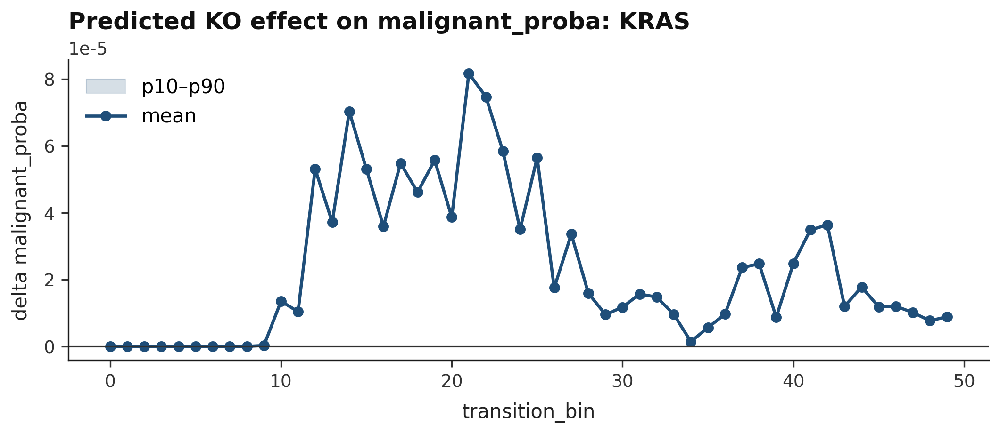

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>以 KRAS 为例的 KO 效应曲线，展示恶性概率沿迁移轴的变化趋势。

读图要点：优先看 delta_logit（避免 proba 饱和）；结合 baseline_* 判断不同状态/阶段的敏感性差异。</div>

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>基因 KO 在不同 pseudo-state 中的影响摘要，delta_logit 表示方向与强度。

读表要点：优先关注排序列（如 score/composite_score/p_adj）与稳健性指标（support/topk_freq/置信区间等）；如需全量字段与进一步筛选请使用 results/ 目录中的 TSV。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/mutation_effect_KO_by_state_head30.tsv</div>

  gene        group   n_cells delta_logit_mean delta_logit_p10 delta_logit_p90 baseline_logit_mean baseline_logit_p10 baseline_logit_p90 delta_proba_mean delta_proba_p10 delta_proba_p90
  KRAS Intermediate 7.804e+04          0.01042              -0         0.04967                13.8              2.195              22.55        2.184e-05               0       9.186e-11
  KRAS   NormalLike 3.029e+04         0.001526              -0               0              -1.275              -4.21          0.0009077        4.693e-05               0               0
  KRAS    TumorLike 2.708e+04          0.01957               0         0.06842               27.81              24.59              31.97        1.086e-13               0       2.855e-13
  TP53 Intermediate 7.804e+04       -0.0005697               0               0                13.8              2.195              22.55       -2.382e-06               0               0
  TP53   NormalLike 3.029e+04       -0.0001215               0        

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>按 transition bin 汇总 KO 效应，用于观察沿迁移轴的变化。

读表要点：优先关注排序列（如 score/composite_score/p_adj）与稳健性指标（support/topk_freq/置信区间等）；如需全量字段与进一步筛选请使用 results/ 目录中的 TSV。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/mutation_effect_KO_by_transition_bin_head30.tsv</div>

gene group n_cells delta_logit_mean delta_logit_p10 delta_logit_p90 baseline_logit_mean baseline_logit_p10 baseline_logit_p90 delta_proba_mean delta_proba_p10 delta_proba_p90
KRAS    22    2709          0.01105              -0         0.06072               14.81              4.483              24.79        7.477e-05               0       1.245e-11
KRAS    16    2709         0.003388              -0               0               7.335              1.872              13.11        3.593e-05               0               0
KRAS    27    2709          0.01558              -0         0.07098               19.12              8.819              27.81        3.361e-05               0       1.104e-10
KRAS    38    2709          0.01711              -0         0.06458                21.8              14.75              29.04        2.473e-05               0       3.675e-11
KRAS    44    2709          0.01958              -0         0.06193               21.36              13.32              29.54

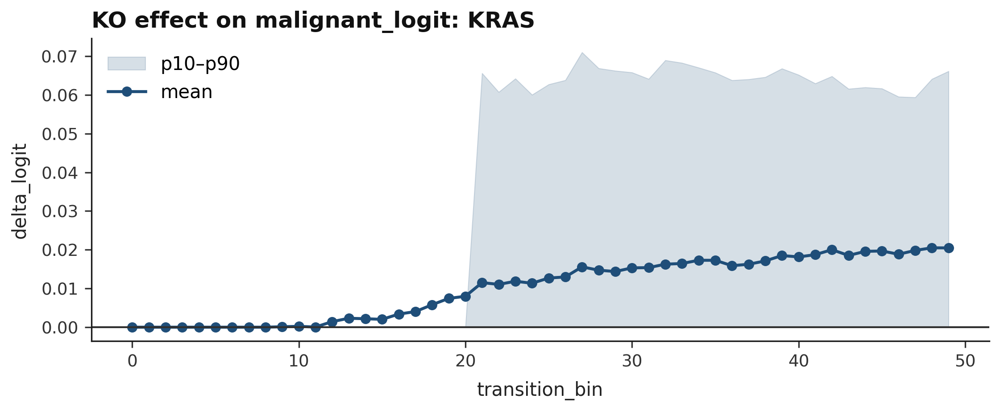

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>KRAS KO 对 malignant logit 的影响沿迁移轴变化，logit 更敏感于非饱和区间。

读图要点：优先看 delta_logit（避免 proba 饱和）；结合 baseline_* 判断不同状态/阶段的敏感性差异。</div>

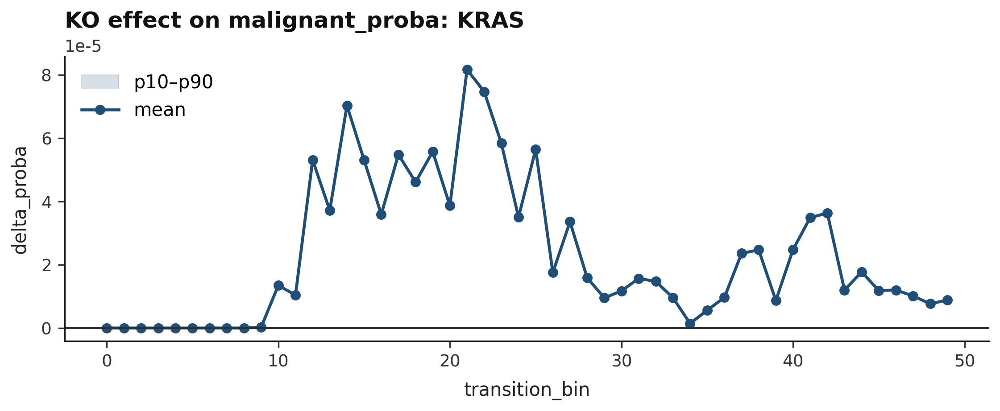

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>KRAS KO 对 malignant proba 的影响沿迁移轴变化，在极端区间可能出现饱和。

读图要点：优先看 delta_logit（避免 proba 饱和）；结合 baseline_* 判断不同状态/阶段的敏感性差异。</div>

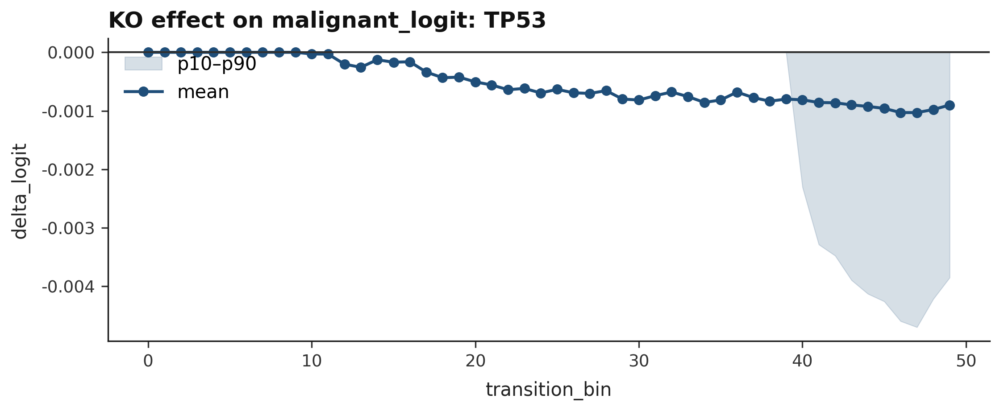

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>TP53 KO 对 malignant logit 的影响沿迁移轴变化，logit 更敏感于非饱和区间。

读图要点：优先看 delta_logit（避免 proba 饱和）；结合 baseline_* 判断不同状态/阶段的敏感性差异。</div>

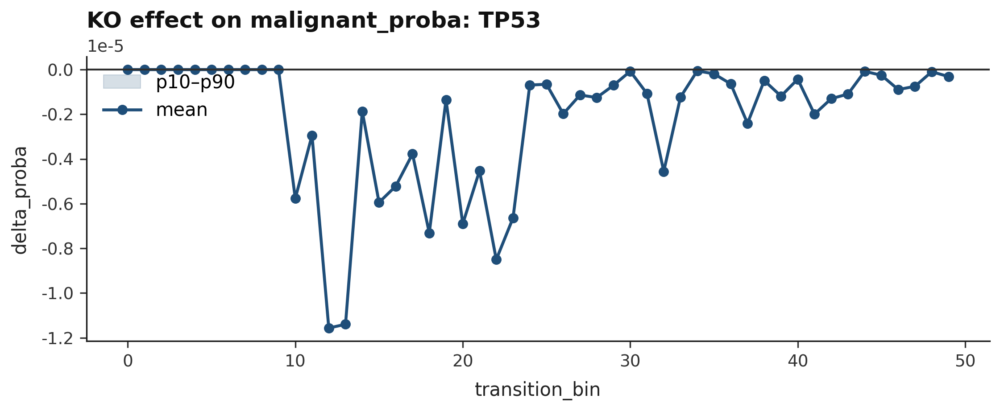

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>TP53 KO 对 malignant proba 的影响沿迁移轴变化，在极端区间可能出现饱和。

读图要点：优先看 delta_logit（避免 proba 饱和）；结合 baseline_* 判断不同状态/阶段的敏感性差异。</div>

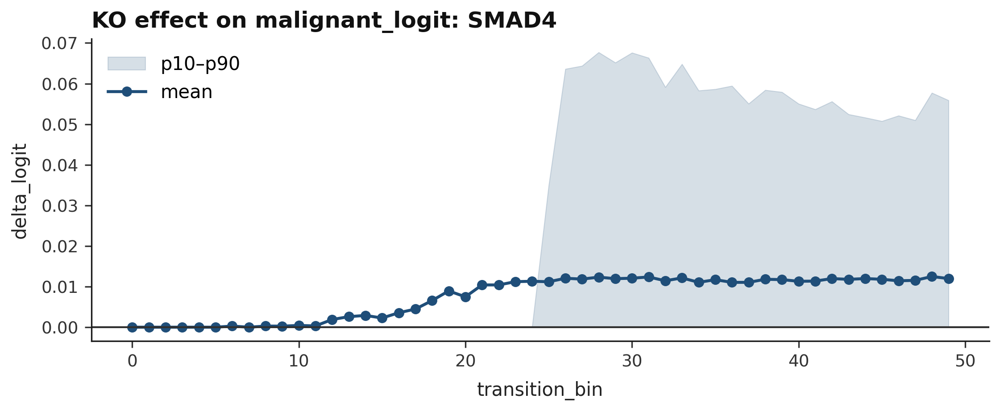

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>SMAD4 KO 对 malignant logit 的影响沿迁移轴变化，logit 更敏感于非饱和区间。

读图要点：优先看 delta_logit（避免 proba 饱和）；结合 baseline_* 判断不同状态/阶段的敏感性差异。</div>

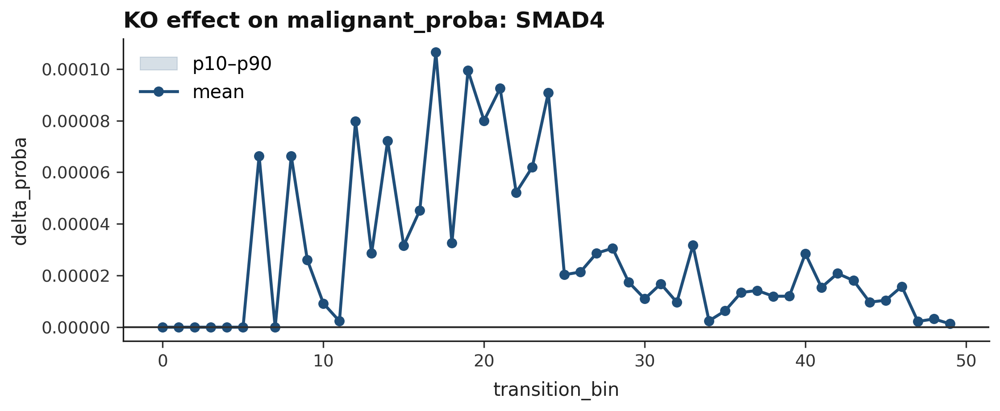

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>SMAD4 KO 对 malignant proba 的影响沿迁移轴变化，在极端区间可能出现饱和。

读图要点：优先看 delta_logit（避免 proba 饱和）；结合 baseline_* 判断不同状态/阶段的敏感性差异。</div>

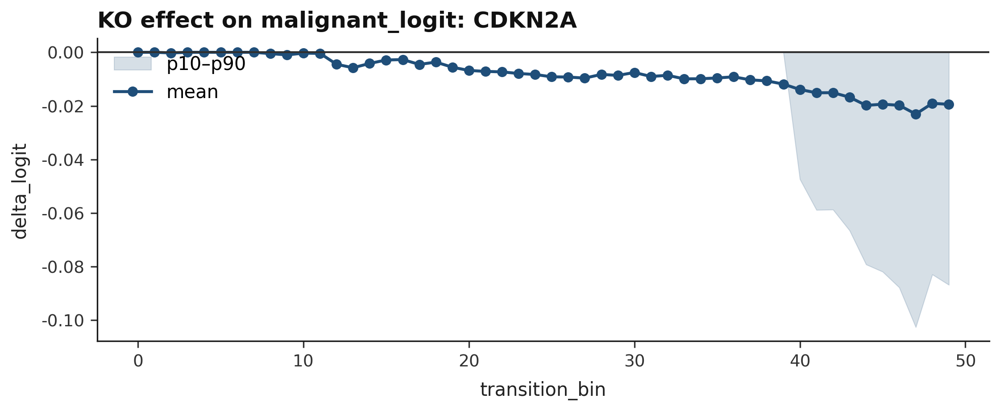

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>CDKN2A KO 对 malignant logit 的影响沿迁移轴变化，logit 更敏感于非饱和区间。

读图要点：优先看 delta_logit（避免 proba 饱和）；结合 baseline_* 判断不同状态/阶段的敏感性差异。</div>

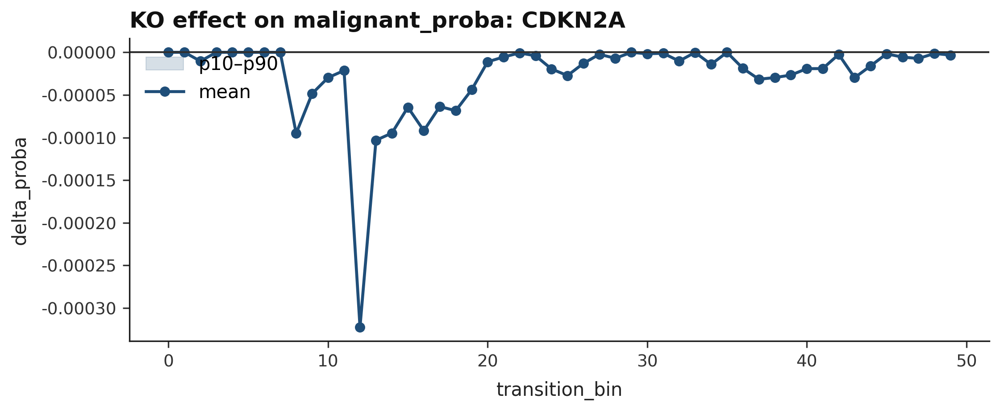

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>CDKN2A KO 对 malignant proba 的影响沿迁移轴变化，在极端区间可能出现饱和。

读图要点：优先看 delta_logit（避免 proba 饱和）；结合 baseline_* 判断不同状态/阶段的敏感性差异。</div>

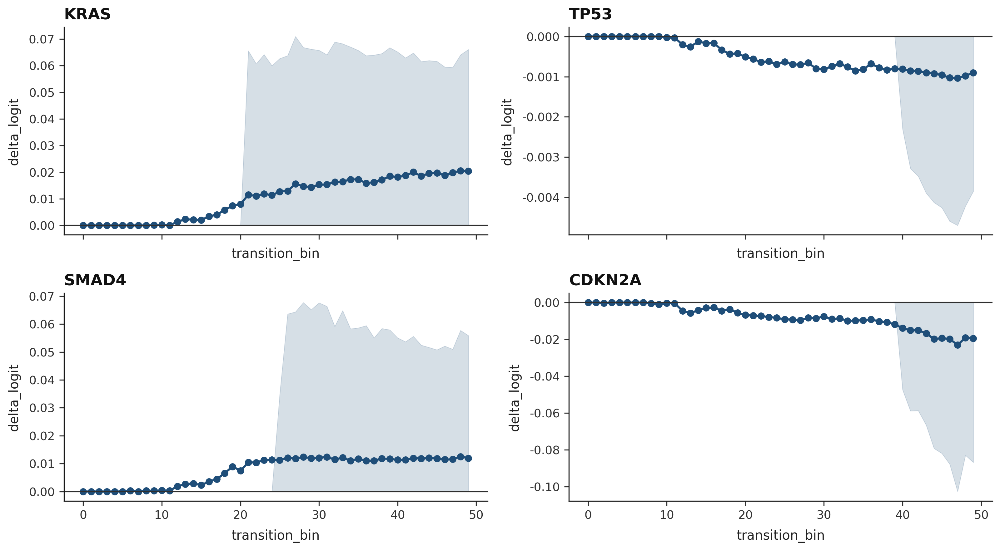

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>多个基因的 KO 对 malignant logit 的影响（均值±区间）在迁移轴上的对比。

读图要点：优先看 delta_logit（避免 proba 饱和）；结合 baseline_* 判断不同状态/阶段的敏感性差异。</div>

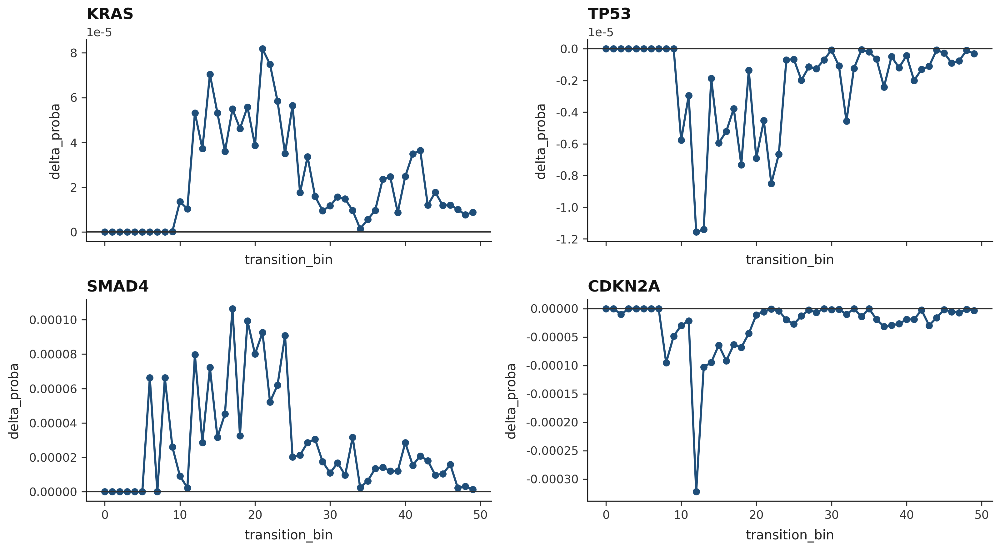

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>多个基因的 KO 对 malignant proba 的影响（均值±区间）在迁移轴上的对比。

读图要点：优先看 delta_logit（避免 proba 饱和）；结合 baseline_* 判断不同状态/阶段的敏感性差异。</div>

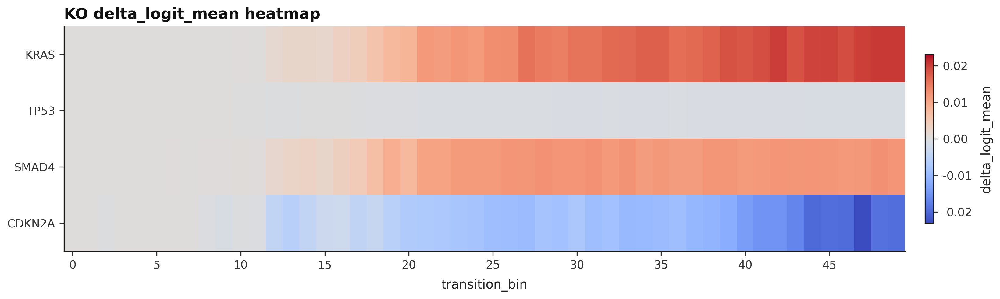

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>基因×迁移分箱的 KO delta_logit 热图：红色更促恶性，蓝色更抑恶性。

读图要点：优先看 delta_logit（避免 proba 饱和）；结合 baseline_* 判断不同状态/阶段的敏感性差异。</div>

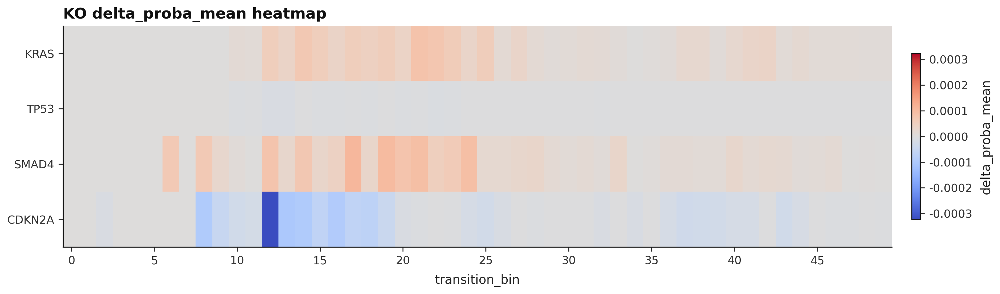

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>基因×迁移分箱的 KO delta_proba 热图：用于直观比较不同迁移阶段的效应差异。

读图要点：优先看 delta_logit（避免 proba 饱和）；结合 baseline_* 判断不同状态/阶段的敏感性差异。</div>

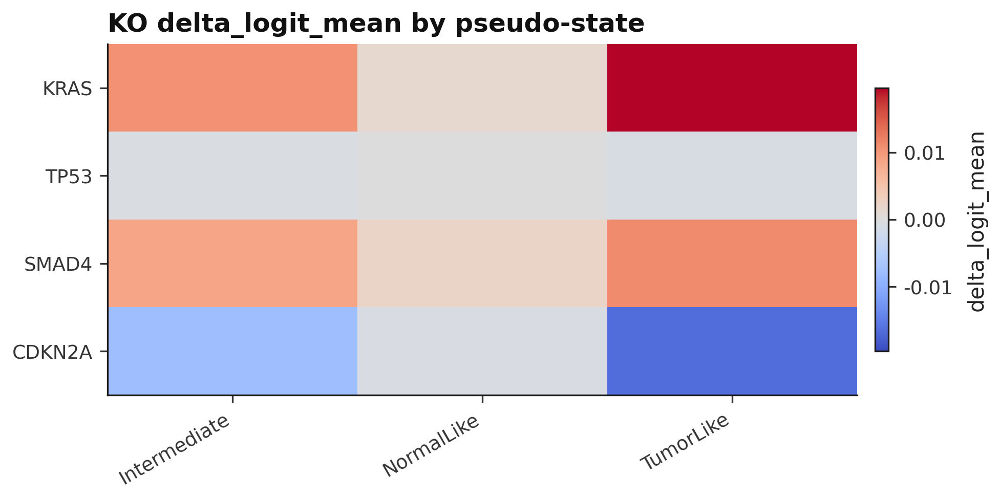

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>基因×pseudo-state 的 KO delta_logit 热图，用于比较不同状态下的敏感性差异。

读图要点：优先看 delta_logit（避免 proba 饱和）；结合 baseline_* 判断不同状态/阶段的敏感性差异。</div>

In [14]:
from driverlens.perturb import PerturbationSpec, summarize_binary_perturbation

atlas_model = MODELS_DIR / "atlas_nmf.joblib"
if not atlas_model.exists():
    raise FileNotFoundError("Missing models/atlas_nmf.joblib. Run section 6 first.")

atlas = ad.read_h5ad(ATLAS_SCORED_PATH)

# Recompute atlas transition bins (stable grouping for reports)
atlas_score = transition_projection_score(
    input_h5ad=ATLAS_SCORED_PATH,
    model_path=atlas_model,
    group_col="dl_state_global",
    source="NormalLike",
    target="TumorLike",
)
atlas.obs["transition_bin"] = quantile_bins(atlas_score, n_bins=TRANSITION_N_BINS)

ko = PerturbationSpec(mode="knockout", factor=0.0)
gof2x = PerturbationSpec(mode="scale", factor=2.0)

# 8a) Mutation impact on malignant probability (all atlas cells), grouped by global state
eff_state_ko = summarize_binary_perturbation(
    adata=atlas,
    model=clf_model,
    feature_names=clf_features,
    genes=MUTATION_GENES,
    group_col="dl_state_global",
    perturb=ko,
    allow_missing_features=True,
    include_zero_coefs=True,
)
eff_state_ko_path = RESULTS_DIR / "mutation_effect_malignant_KO_by_state.tsv"
eff_state_ko.to_csv(eff_state_ko_path, sep="\t", index=False)

save_table(eff_state_ko, "mutation_effect_malignant_KO_by_state", max_rows=30, max_cols=12, max_str_len=60)

# Optional: gain-of-function proxy (2x expression)
eff_state_2x = summarize_binary_perturbation(
    adata=atlas,
    model=clf_model,
    feature_names=clf_features,
    genes=MUTATION_GENES,
    group_col="dl_state_global",
    perturb=gof2x,
    allow_missing_features=True,
    include_zero_coefs=True,
)
eff_state_2x_path = RESULTS_DIR / "mutation_effect_malignant_2x_by_state.tsv"
eff_state_2x.to_csv(eff_state_2x_path, sep="\t", index=False)

# 8b) Mutation impact along the transition bins (many slices)
eff_bin_ko = summarize_binary_perturbation(
    adata=atlas,
    model=clf_model,
    feature_names=clf_features,
    genes=MUTATION_GENES,
    group_col="transition_bin",
    perturb=ko,
    allow_missing_features=True,
    include_zero_coefs=True,
)
eff_bin_ko_path = RESULTS_DIR / "mutation_effect_malignant_KO_by_transition_bin.tsv"
eff_bin_ko.to_csv(eff_bin_ko_path, sep="\t", index=False)

# 8c) Optional: impact grouped by annotated broad cell types (when available)
if "cell_type" in atlas.obs.columns:
    eff_celltype_ko = summarize_binary_perturbation(
        adata=atlas,
        model=clf_model,
        feature_names=clf_features,
        genes=MUTATION_GENES,
        group_col="cell_type",
        perturb=ko,
        allow_missing_features=True,
    )
    eff_celltype_ko_path = RESULTS_DIR / "mutation_effect_malignant_KO_by_cell_type.tsv"
    eff_celltype_ko.to_csv(eff_celltype_ko_path, sep="\t", index=False)

print("Wrote:", eff_state_ko_path)
print("Wrote:", eff_state_2x_path)
print("Wrote:", eff_bin_ko_path)
if "cell_type" in atlas.obs.columns:
    print("Wrote:", eff_celltype_ko_path)

# Quick plot: KO effect along bins for the first gene
if len(MUTATION_GENES) > 0:
    g0 = MUTATION_GENES[0]
    sub = eff_bin_ko.loc[eff_bin_ko["gene"] == g0].copy()
    sub["bin"] = sub["group"].astype(int)
    sub = sub.sort_values("bin")
    fig, ax = plt.subplots(figsize=(7.2, 3.2))
    ax.fill_between(
        sub["bin"].astype(float),
        sub["delta_proba_p10"].astype(float),
        sub["delta_proba_p90"].astype(float),
        color=PRIMARY_COLOR,
        alpha=0.18,
        label="p10–p90",
    )
    ax.plot(sub["bin"], sub["delta_proba_mean"], marker="o", color=PRIMARY_COLOR, label="mean")
    ax.axhline(0.0, color="#2F2F2F", linewidth=1.0)
    ax.set_xlabel("transition_bin")
    ax.set_ylabel("delta malignant_proba")
    ax.set_title(f"Predicted KO effect on malignant_proba: {g0}")
    ax.legend(loc="upper left")
    savefig(fig, f"mutation_KO_effect_{g0}_by_bin")

# Tables
save_table(eff_state_ko.head(30), "mutation_effect_KO_by_state_head30")
save_table(eff_bin_ko.head(30), "mutation_effect_KO_by_transition_bin_head30")

# Plots: KO effect along bins for each gene (logit + proba)
for g in MUTATION_GENES:
    sub = eff_bin_ko.loc[eff_bin_ko["gene"] == g].copy()
    if sub.empty:
        continue
    sub["bin"] = sub["group"].astype(int)
    sub = sub.sort_values("bin")

    fig, ax = plt.subplots(figsize=(7.6, 3.2))
    ax.fill_between(
        sub["bin"].astype(float),
        sub["delta_logit_p10"].astype(float),
        sub["delta_logit_p90"].astype(float),
        color=PRIMARY_COLOR,
        alpha=0.18,
        label="p10–p90",
    )
    ax.plot(sub["bin"], sub["delta_logit_mean"], marker="o", color=PRIMARY_COLOR, label="mean")
    ax.axhline(0.0, color="#2F2F2F", linewidth=1.0)
    ax.set_xlabel("transition_bin")
    ax.set_ylabel("delta_logit")
    ax.set_title(f"KO effect on malignant_logit: {g}")
    ax.legend(loc="upper left")
    savefig(fig, f"mutation_KO_delta_logit_{g}_by_bin")

    fig, ax = plt.subplots(figsize=(7.6, 3.2))
    ax.fill_between(
        sub["bin"].astype(float),
        sub["delta_proba_p10"].astype(float),
        sub["delta_proba_p90"].astype(float),
        color=PRIMARY_COLOR,
        alpha=0.18,
        label="p10–p90",
    )
    ax.plot(sub["bin"], sub["delta_proba_mean"], marker="o", color=PRIMARY_COLOR, label="mean")
    ax.axhline(0.0, color="#2F2F2F", linewidth=1.0)
    ax.set_xlabel("transition_bin")
    ax.set_ylabel("delta_proba")
    ax.set_title(f"KO effect on malignant_proba: {g}")
    ax.legend(loc="upper left")
    savefig(fig, f"mutation_KO_delta_proba_{g}_by_bin")

# Extra: grid summary (all genes) + heatmaps
if (not eff_bin_ko.empty) and (len(MUTATION_GENES) > 0):
    df_plot = eff_bin_ko.copy()
    df_plot["bin"] = df_plot["group"].astype(int)
    df_plot = df_plot.sort_values("bin")

    n = int(len(MUTATION_GENES))
    n_cols = 2
    n_rows = int(np.ceil(n / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(10.8, 3.0 * n_rows), sharex=True)
    axes = np.array(axes).reshape(-1)
    for ax, gene in zip(axes, MUTATION_GENES):
        sub = df_plot.loc[df_plot["gene"] == gene]
        if sub.empty:
            ax.axis("off")
            continue
        x = sub["bin"].to_numpy(dtype=float)
        ax.fill_between(
            x,
            sub["delta_logit_p10"].astype(float),
            sub["delta_logit_p90"].astype(float),
            color=PRIMARY_COLOR,
            alpha=0.18,
        )
        ax.plot(x, sub["delta_logit_mean"].astype(float), marker="o", color=PRIMARY_COLOR)
        ax.axhline(0.0, color="#2F2F2F", linewidth=1.0)
        ax.set_title(str(gene))
        ax.set_xlabel("transition_bin")
        ax.set_ylabel("delta_logit")

    for ax in axes[n:]:
        ax.axis("off")
    savefig(fig, "mutation_KO_delta_logit_grid")

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(10.8, 3.0 * n_rows), sharex=True)
    axes = np.array(axes).reshape(-1)
    for ax, gene in zip(axes, MUTATION_GENES):
        sub = df_plot.loc[df_plot["gene"] == gene]
        if sub.empty:
            ax.axis("off")
            continue
        x = sub["bin"].to_numpy(dtype=float)
        ax.fill_between(
            x,
            sub["delta_proba_p10"].astype(float),
            sub["delta_proba_p90"].astype(float),
            color=PRIMARY_COLOR,
            alpha=0.18,
        )
        ax.plot(x, sub["delta_proba_mean"].astype(float), marker="o", color=PRIMARY_COLOR)
        ax.axhline(0.0, color="#2F2F2F", linewidth=1.0)
        ax.set_title(str(gene))
        ax.set_xlabel("transition_bin")
        ax.set_ylabel("delta_proba")

    for ax in axes[n:]:
        ax.axis("off")
    savefig(fig, "mutation_KO_delta_proba_grid")

    # Heatmap by bin
    piv_logit = df_plot.pivot(index="gene", columns="bin", values="delta_logit_mean").reindex(index=MUTATION_GENES)
    data = piv_logit.to_numpy(dtype=float)
    vmax = float(np.nanmax(np.abs(data))) if np.isfinite(np.nanmax(np.abs(data))) else 1.0
    fig, ax = plt.subplots(figsize=(12.0, 1.2 + 0.55 * len(MUTATION_GENES)))
    im = ax.imshow(data, aspect="auto", cmap="coolwarm", vmin=-vmax, vmax=vmax)
    ax.set_yticks(np.arange(piv_logit.shape[0]))
    ax.set_yticklabels(piv_logit.index.astype(str))
    xt = np.arange(piv_logit.shape[1])
    step = 5 if piv_logit.shape[1] >= 20 else 1
    ax.set_xticks(xt[::step])
    ax.set_xticklabels(piv_logit.columns.astype(int).to_numpy()[::step])
    ax.set_xlabel("transition_bin")
    ax.set_title("KO delta_logit_mean heatmap")
    cbar = fig.colorbar(im, ax=ax, shrink=0.75, pad=0.02)
    cbar.set_label("delta_logit_mean")
    savefig(fig, "mutation_KO_delta_logit_heatmap_by_bin")

    piv_proba = df_plot.pivot(index="gene", columns="bin", values="delta_proba_mean").reindex(index=MUTATION_GENES)
    data = piv_proba.to_numpy(dtype=float)
    vmax = float(np.nanmax(np.abs(data))) if np.isfinite(np.nanmax(np.abs(data))) else 1.0
    fig, ax = plt.subplots(figsize=(12.0, 1.2 + 0.55 * len(MUTATION_GENES)))
    im = ax.imshow(data, aspect="auto", cmap="coolwarm", vmin=-vmax, vmax=vmax)
    ax.set_yticks(np.arange(piv_proba.shape[0]))
    ax.set_yticklabels(piv_proba.index.astype(str))
    xt = np.arange(piv_proba.shape[1])
    step = 5 if piv_proba.shape[1] >= 20 else 1
    ax.set_xticks(xt[::step])
    ax.set_xticklabels(piv_proba.columns.astype(int).to_numpy()[::step])
    ax.set_xlabel("transition_bin")
    ax.set_title("KO delta_proba_mean heatmap")
    cbar = fig.colorbar(im, ax=ax, shrink=0.75, pad=0.02)
    cbar.set_label("delta_proba_mean")
    savefig(fig, "mutation_KO_delta_proba_heatmap_by_bin")

# Heatmap by pseudo-state
if (not eff_state_ko.empty) and (len(MUTATION_GENES) > 0):
    piv_state = eff_state_ko.pivot(index="gene", columns="group", values="delta_logit_mean").reindex(index=MUTATION_GENES)
    data = piv_state.to_numpy(dtype=float)
    vmax = float(np.nanmax(np.abs(data))) if np.isfinite(np.nanmax(np.abs(data))) else 1.0
    fig, ax = plt.subplots(figsize=(6.8, 1.2 + 0.55 * len(MUTATION_GENES)))
    im = ax.imshow(data, aspect="auto", cmap="coolwarm", vmin=-vmax, vmax=vmax)
    ax.set_yticks(np.arange(piv_state.shape[0]))
    ax.set_yticklabels(piv_state.index.astype(str))
    ax.set_xticks(np.arange(piv_state.shape[1]))
    ax.set_xticklabels(piv_state.columns.astype(str), rotation=30, ha="right")
    ax.set_title("KO delta_logit_mean by pseudo-state")
    cbar = fig.colorbar(im, ax=ax, shrink=0.75, pad=0.02)
    cbar.set_label("delta_logit_mean")
    savefig(fig, "mutation_KO_delta_logit_heatmap_by_state")


## 9) Beyond tumor cells: microenvironment state models (GSE242230)

To cover non-tumor processes, train a small panel of interpretable state classifiers using GSE242230 labels (e.g., TAM and CAF transitions), then run the same perturbation analysis.


TAM_FCN1_to_SPP1 AUC_CV_mean= 0.9996536955106106 C= 5.0
iCAF_to_myCAF AUC_CV_mean= 0.9844358948678759 C= 5.0
Skip CD8_to_Exhausted (need both negative and positive cells)
Wrote: /media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/mutation_effect_TAM_FCN1_to_SPP1_KO_by_cell_type_specific.tsv


<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>TAM FCN1 to SPP1 KO by cell type specific 的扰动效应表（前 30 行），用于快速查看主效应基因。

读表要点：优先关注排序列（如 score/composite_score/p_adj）与稳健性指标（support/topk_freq/置信区间等）；如需全量字段与进一步筛选请使用 results/ 目录中的 TSV。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/mutation_effect_TAM_FCN1_to_SPP1_KO_by_cell_type_specific_head30.tsv</div>

  gene      group n_cells delta_logit_mean delta_logit_p10 delta_logit_p90 baseline_logit_mean baseline_logit_p10 baseline_logit_p90 delta_proba_mean delta_proba_p10 delta_proba_p90
  KRAS TAM - FCN1    1961           0.0101               0         0.04203               -13.2             -16.97             -9.476        1.071e-06               0       1.121e-07
  KRAS TAM - SPP1     737          0.00688              -0         0.02709               16.09              8.651              21.92        8.183e-07               0       3.934e-09
  TP53 TAM - FCN1    1961        0.0005454               0               0               -13.2             -16.97             -9.476         5.45e-08               0               0
  TP53 TAM - SPP1     737        0.0003971              -0               0               16.09              8.651              21.92        4.315e-08               0               0
 SMAD4 TAM - FCN1    1961        0.0005458               0               0               -

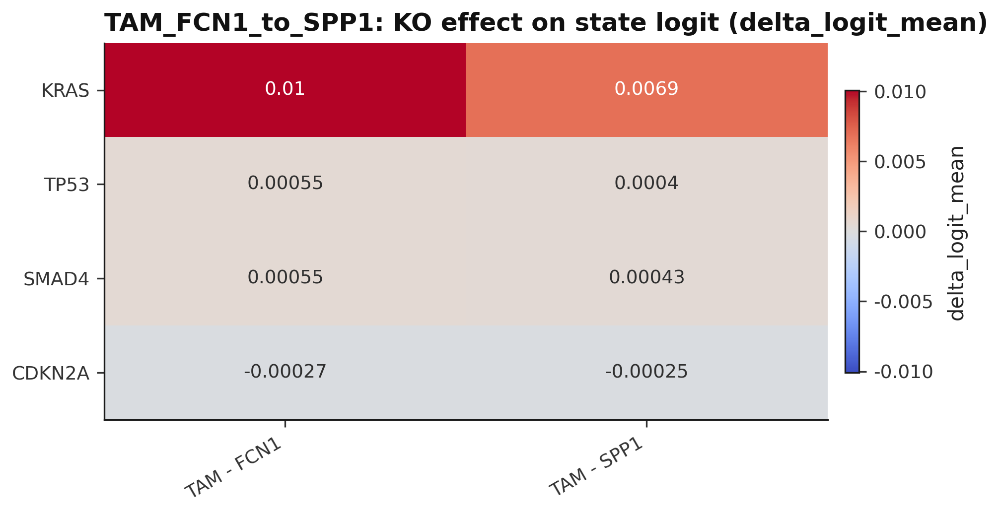

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>TAM FCN1 to SPP1 状态模型下的 KO 效应汇总（delta_logit），可筛选影响最大的候选基因并比较不同群体差异。

读图要点：优先看 delta_logit（避免 proba 饱和）；结合 baseline_* 判断不同状态/阶段的敏感性差异。</div>

Wrote: /media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/mutation_effect_iCAF_to_myCAF_KO_by_cell_type_specific.tsv


<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>iCAF to myCAF KO by cell type specific 的扰动效应表（前 30 行），用于快速查看主效应基因。

读表要点：优先关注排序列（如 score/composite_score/p_adj）与稳健性指标（support/topk_freq/置信区间等）；如需全量字段与进一步筛选请使用 results/ 目录中的 TSV。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/mutation_effect_iCAF_to_myCAF_KO_by_cell_type_specific_head30.tsv</div>

  gene group n_cells delta_logit_mean delta_logit_p10 delta_logit_p90 baseline_logit_mean baseline_logit_p10 baseline_logit_p90 delta_proba_mean delta_proba_p10 delta_proba_p90
  KRAS  iCAF     211        -0.002584       -0.008016               0               -9.63             -12.73              -6.31       -1.332e-06      -5.308e-07               0
  KRAS myCAF     209        -0.003158         -0.0095               0               10.12              5.875               15.5       -2.361e-06      -4.745e-06               0
  TP53  iCAF     211         0.002729               0        0.008754               -9.63             -12.73              -6.31        2.547e-06               0       2.543e-07
  TP53 myCAF     209         0.003097              -0         0.01334               10.12              5.875               15.5        2.066e-06               0       4.551e-07
 SMAD4  iCAF     211        -0.004841        -0.01625               0               -9.63             -12.73       

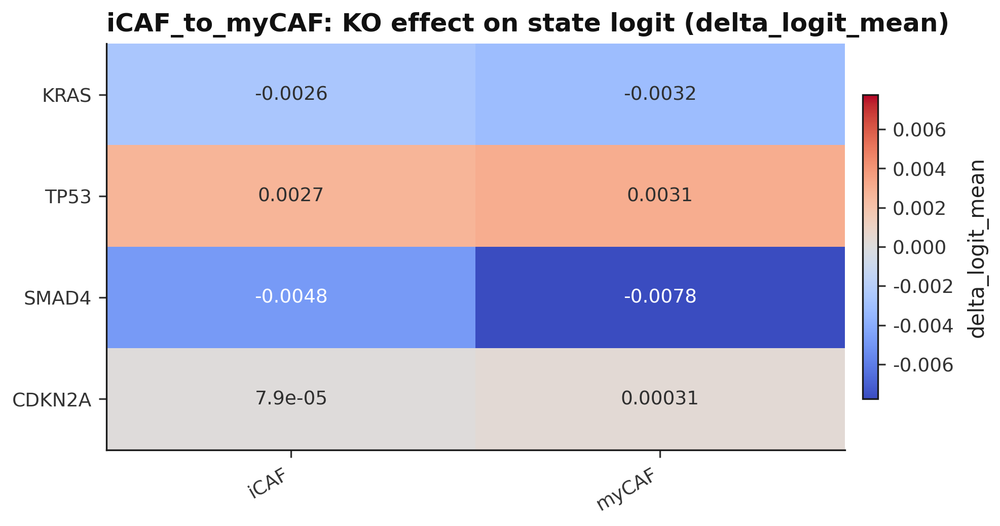

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>iCAF to myCAF 状态模型下的 KO 效应汇总（delta_logit），可筛选影响最大的候选基因并比较不同群体差异。

读图要点：优先看 delta_logit（避免 proba 饱和）；结合 baseline_* 判断不同状态/阶段的敏感性差异。</div>

In [15]:
from driverlens.classifier import train_binary_state_classifier
from driverlens.perturb import PerturbationSpec, summarize_binary_perturbation

atlas = ad.read_h5ad(ATLAS_SCORED_PATH)
ko = PerturbationSpec(mode="knockout", factor=0.0)

state_defs = [
    ("TAM_FCN1_to_SPP1", ["TAM - FCN1"], ["TAM - SPP1"]),
    ("iCAF_to_myCAF", ["iCAF"], ["myCAF"]),
    ("CD8_to_Exhausted", ["CD8 T cell"], ["CD8 T cell - Exhausted"]),
]

state_models = []
for name, neg, pos in state_defs:
    model_path = MODELS_DIR / f"stateclf_{name}.joblib"
    pack = None
    need_train = not model_path.exists()
    if not need_train:
        pack = joblib.load(model_path)
        if pack.get("c") != STATE_CLASSIFIER_C or pack.get("n_hvg") != N_HVG:
            need_train = True

    if need_train:
        if "cell_type_specific" not in adata_ref.obs.columns:
            print("Skip", name, "(missing cell_type_specific in reference)")
            continue
        groups = adata_ref.obs["cell_type_specific"].astype(str)
        n_neg = int(groups.isin(neg).sum())
        n_pos = int(groups.isin(pos).sum())
        if n_neg == 0 or n_pos == 0:
            print("Skip", name, "(need both negative and positive cells)")
            continue
        try:
            res = train_binary_state_classifier(
                adata=adata_ref,
                group_col="cell_type_specific",
                negative_values=neg,
                positive_values=pos,
                n_hvg=N_HVG,
                seed=SEED,
                c=STATE_CLASSIFIER_C,
                n_splits=5,
                class_weight="balanced",
                force_include_genes=MUTATION_GENES,
            )
        except ValueError as exc:
            print("Skip", name, f"({exc})")
            continue
        pack = {
            "model": res.model,
            "feature_names": res.feature_names,
            "auc_cv_mean": res.auc_cv_mean,
            "group_col": "cell_type_specific",
            "negative_values": neg,
            "positive_values": pos,
            "seed": SEED,
            "c": STATE_CLASSIFIER_C,
            "n_hvg": N_HVG,
        }
        joblib.dump(pack, model_path)

    state_models.append((name, neg, pos, pack["model"], pack["feature_names"], pack.get("auc_cv_mean")))
    print(name, "AUC_CV_mean=", pack.get("auc_cv_mean"), "C=", pack.get("c"))

if "cell_type_specific" in atlas.obs.columns:
    for name, neg, pos, model, features, auc in state_models:
        mask = atlas.obs["cell_type_specific"].astype(str).isin(neg + pos)
        if int(mask.sum()) == 0:
            continue
        sub = atlas[mask.to_numpy()].copy()
        eff = summarize_binary_perturbation(
            adata=sub,
            model=model,
            feature_names=features,
            genes=MUTATION_GENES,
            group_col="cell_type_specific",
            perturb=ko,
            allow_missing_features=True,
            include_zero_coefs=True,
        )
        out = RESULTS_DIR / f"mutation_effect_{name}_KO_by_cell_type_specific.tsv"
        eff.to_csv(out, sep="\t", index=False)
        print("Wrote:", out)
        save_table(eff.head(30), out.stem + "_head30")

        plot_df = eff.loc[eff["gene"].isin(MUTATION_GENES)].copy()
        if not plot_df.empty:
            pivot = (
                plot_df.pivot(index="gene", columns="group", values="delta_logit_mean")
                .reindex(index=MUTATION_GENES)
                .astype(float)
            )
            data = pivot.to_numpy(dtype=float)
            vmax = float(np.nanmax(np.abs(data))) if np.isfinite(np.nanmax(np.abs(data))) else 1.0
            fig, ax = plt.subplots(figsize=(6.8, 1.4 + 0.55 * len(MUTATION_GENES)))
            im = ax.imshow(data, aspect="auto", cmap="coolwarm", vmin=-vmax, vmax=vmax)
            ax.set_yticks(np.arange(pivot.shape[0]))
            ax.set_yticklabels(pivot.index.astype(str))
            ax.set_xticks(np.arange(pivot.shape[1]))
            ax.set_xticklabels(pivot.columns.astype(str), rotation=30, ha="right")
            ax.set_title(f"{name}: KO effect on state logit (delta_logit_mean)")
            for i in range(pivot.shape[0]):
                for j in range(pivot.shape[1]):
                    v = float(data[i, j]) if np.isfinite(data[i, j]) else 0.0
                    txt_color = "#FFFFFF" if abs(v) >= 0.55 * vmax else "#2F2F2F"
                    ax.text(j, i, f"{v:.2g}", ha="center", va="center", color=txt_color, fontsize=9)
            cbar = fig.colorbar(im, ax=ax, shrink=0.75, pad=0.02)
            cbar.set_label("delta_logit_mean")
            savefig(fig, f"mutation_effect_{name}_KO_delta_logit_heatmap")
else:
    print("atlas.obs has no cell_type_specific; skip microenvironment state panel.")


## 10) Enrichment + network analysis（全队列）

对本 notebook 产生的候选基因（各 GSE driver、meta driver、atlas 迁移方向 driver）做：

1) **富集分析（尽可能全面）**：g:Profiler（GO:BP/MF/CC + KEGG/Reactome/WikiPathways + CORUM/HPO 等），并统计“跨基因集合重复出现的功能主题（term support）”。
2) **网络分析（多证据链）**：
   - STRING PPI（知识网络）：hub genes、社区模块、模块富集
   - Atlas 共表达（数据网络）：相关性网络 + 模块富集 + 与 STRING hub 重叠互证
   - Graphical Lasso 部分相关（高级网络）：pseudobulk 级别的条件依赖网络 + 稳定性选择（bootstrap edge frequency）
   - 模块-表型关联：模块 PC1 vs malignant_mean / TumorLike_frac
   - 差异网络（NormalLike vs TumorLike rewiring）：Δpartial_corr 边 + rewiring gene ranking + 差异模块富集
   - 多层共识整合：STRING/共表达/部分相关 的边支持度与共识网络 hub（更稳健）

输出：
- 表格：`results/enrichment/`、`results/network/`
- 图片：`results/figures/`


<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>本节将对不同来源（各GSE driver、meta driver、atlas 迁移方向）得到的候选基因集合分别做富集分析，并用于后续一致性与网络推理。

表格预览：仅展示 前 30 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/enrichment_gene_sets_summary.tsv</div>

            gene_set n_genes                  example
atlas_transition_hvg     200 MALAT1, B2M, EEF1A1, ...
        meta_drivers      15 MALAT1, B2M, EEF1A1, ...


<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>GO:BP 富集在不同 gene set 之间的复现性统计（support=出现的集合数量）。support 越高，越支持“跨队列一致”的生物学主题。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/enrichment_GO_BP_term_support_head30.tsv</div>

source    term_id                term_name support min_p_adj mean_neglog10 term_size mean_intersection_size
 GO:BP GO:0044419 biological process in...       2 3.894e-09         5.213      1759                     26
 GO:BP GO:0048522 positive regulation o...       2 1.287e-09         5.131      5920                   53.5
 GO:BP GO:0001914 regulation of T cell ...       2 6.866e-07         4.741        48                    5.5
 GO:BP GO:0009891 positive regulation o...       2 1.099e-08         4.694      2696                     32
 GO:BP GO:0001916 positive regulation o...       2 2.607e-06          4.56        39                      5
 GO:BP GO:0001913 T cell mediated cytot...       2 1.945e-06         4.507        56                    5.5
 GO:BP GO:0002428 antigen processing an...       2 9.613e-06         4.481        16                      4
 GO:BP GO:0009607 response to biotic st...       2 4.517e-08         4.464      1634                   23.5
 GO:BP GO:0019883 antigen pr

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>KEGG 富集在不同 gene set 之间的复现性统计（support=出现的集合数量）。support 越高，越支持“跨队列一致”的生物学主题。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/enrichment_KEGG_term_support_head30.tsv</div>

source    term_id                term_name support min_p_adj mean_neglog10 term_size mean_intersection_size
  KEGG KEGG:04612 Antigen processing an...       2 1.759e-06         4.336        69                    6.5
  KEGG KEGG:05416        Viral myocarditis       2 7.531e-05          3.52        63                    5.5
  KEGG KEGG:05170 Human immunodeficienc...       2 7.287e-05         3.163       210                    8.5
  KEGG KEGG:05166 Human T-cell leukemia...       2 0.0003671         2.812       218                      8
  KEGG KEGG:04216              Ferroptosis       2 0.0003815         2.804        41                      4
  KEGG KEGG:04145                Phagosome       2 0.0008405         2.632       147                    6.5
  KEGG KEGG:05163 Human cytomegalovirus...       2   0.00464         2.261       223                      7
  KEGG KEGG:05330      Allograft rejection       2   0.00647         2.084        34                      3
  KEGG KEGG:05332 Graft-vers

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>REAC 富集在不同 gene set 之间的复现性统计（support=出现的集合数量）。support 越高，越支持“跨队列一致”的生物学主题。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/enrichment_REAC_term_support_head30.tsv</div>

source            term_id                term_name support min_p_adj mean_neglog10 term_size mean_intersection_size
  REAC  REAC:R-HSA-168249     Innate Immune System       2 1.165e-13         7.975      1100                   29.5
  REAC  REAC:R-HSA-168256            Immune System       2 1.165e-13         7.797      2085                   40.5
  REAC REAC:R-HSA-5663205       Infectious disease       2 7.884e-11         6.566      1062                   26.5
  REAC REAC:R-HSA-6798695 Neutrophil degranulation       2 1.192e-08         5.592       476                   16.5
  REAC REAC:R-HSA-1236977 Endosomal/Vacuolar pa...       2 7.203e-06         5.059        11                      4
  REAC REAC:R-HSA-9692914 SARS-CoV-1-host inter...       2 6.679e-08         4.508        95                    7.5
  REAC REAC:R-HSA-1236975 Antigen processing-Cr...       2 1.507e-06         4.419       105                    7.5
  REAC REAC:R-HSA-1236974     ER-Phagosome pathway       2 2.423e-06    

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>WP 富集在不同 gene set 之间的复现性统计（support=出现的集合数量）。support 越高，越支持“跨队列一致”的生物学主题。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/enrichment_WP_term_support_head30.tsv</div>

source   term_id                term_name support min_p_adj mean_neglog10 term_size mean_intersection_size
    WP  WP:WP107      Translation factors       2 8.257e-06          3.32        50                    5.5
    WP  WP:WP183   Proteasome degradation       2 3.746e-05         2.991        62                    5.5
    WP WP:WP5362             TAR syndrome       2  0.002793         2.055        62                    4.5
    WP WP:WP5055       Burn wound healing       2  0.006446         1.835        75                    4.5
    WP WP:WP4313              Ferroptosis       2   0.01159         1.746        64                      4
    WP WP:WP4217 Ebola virus infection...       2   0.02103         1.675       128                    5.5
    WP  WP:WP111 Electron transport ch...       1 4.969e-10         9.304       104                     17
    WP WP:WP3888   VEGFA VEGFR2 signaling       1 4.359e-07         6.361       430                     27
    WP WP:WP4922 Mitochondrial comple

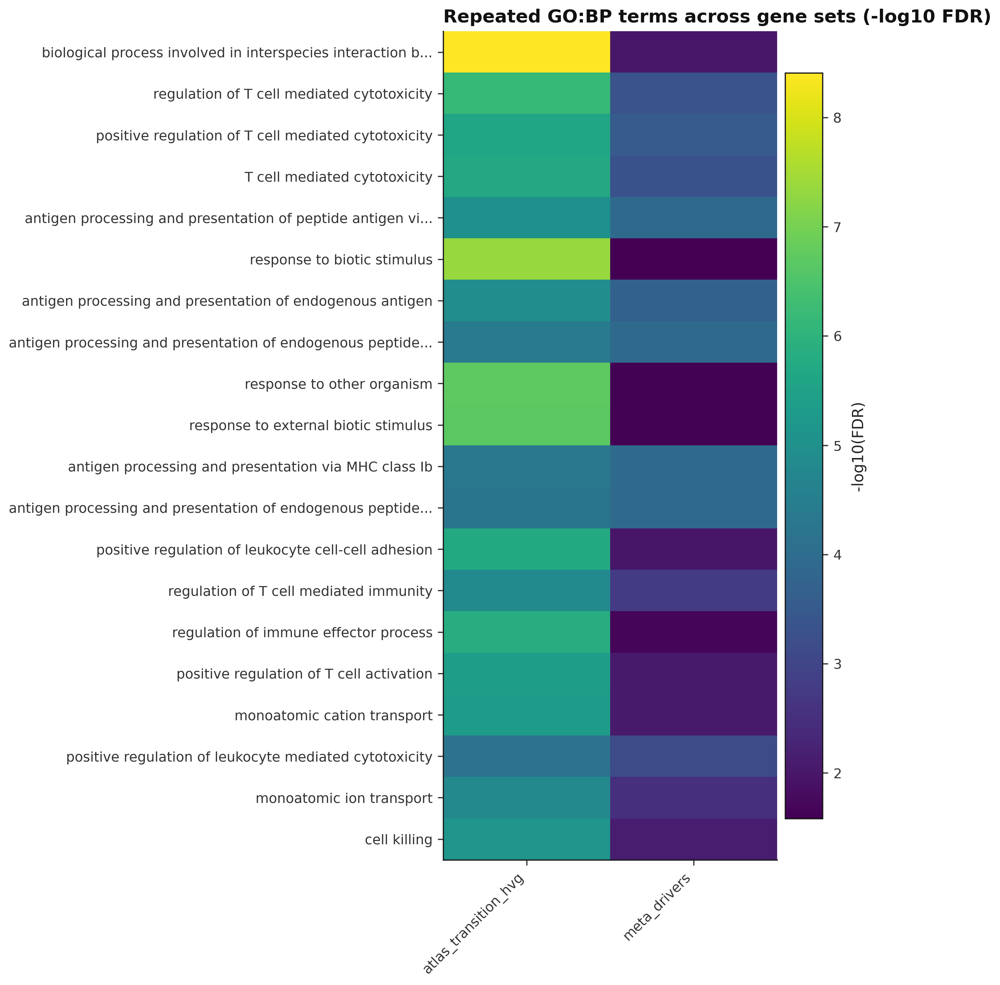

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>GO:BP 富集在不同 gene set 之间的复现热图（值为 -log10 FDR）。用于观察跨队列/多基因集合反复出现的功能主题。</div>

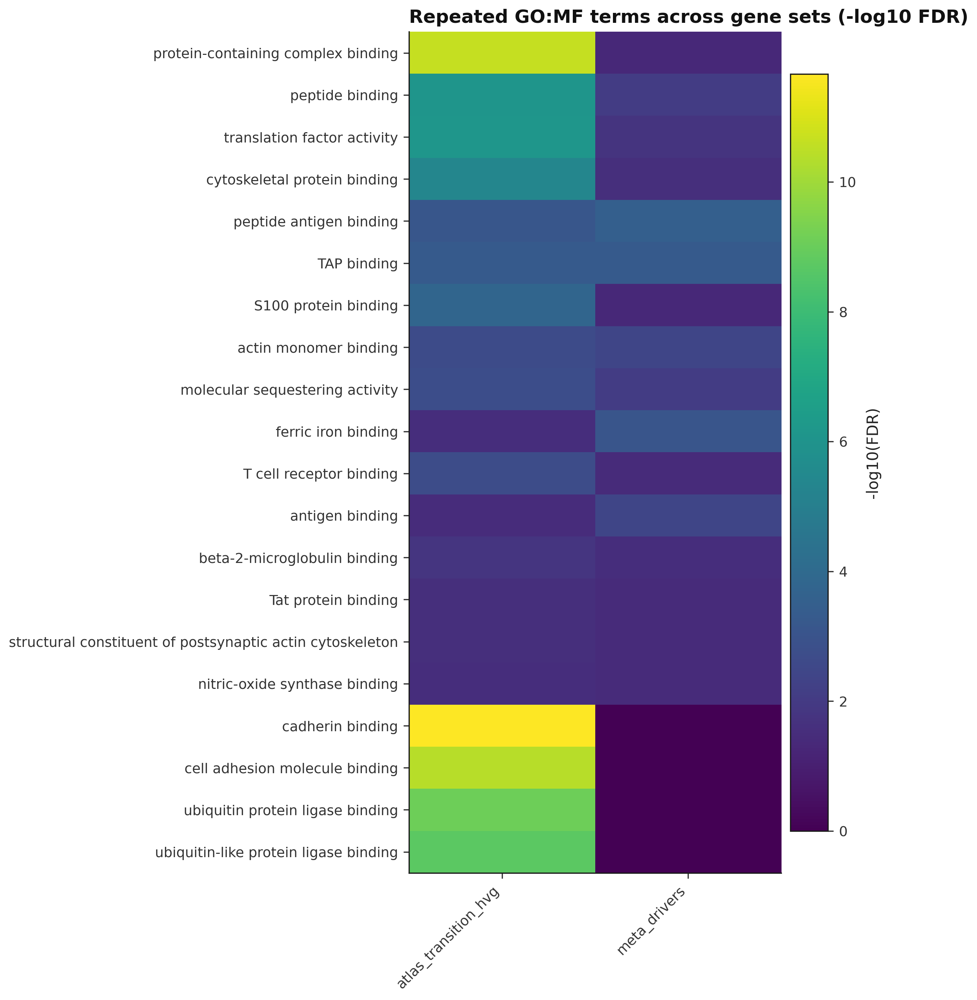

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>GO:MF 富集在不同 gene set 之间的复现热图（值为 -log10 FDR）。用于观察跨队列/多基因集合反复出现的功能主题。</div>

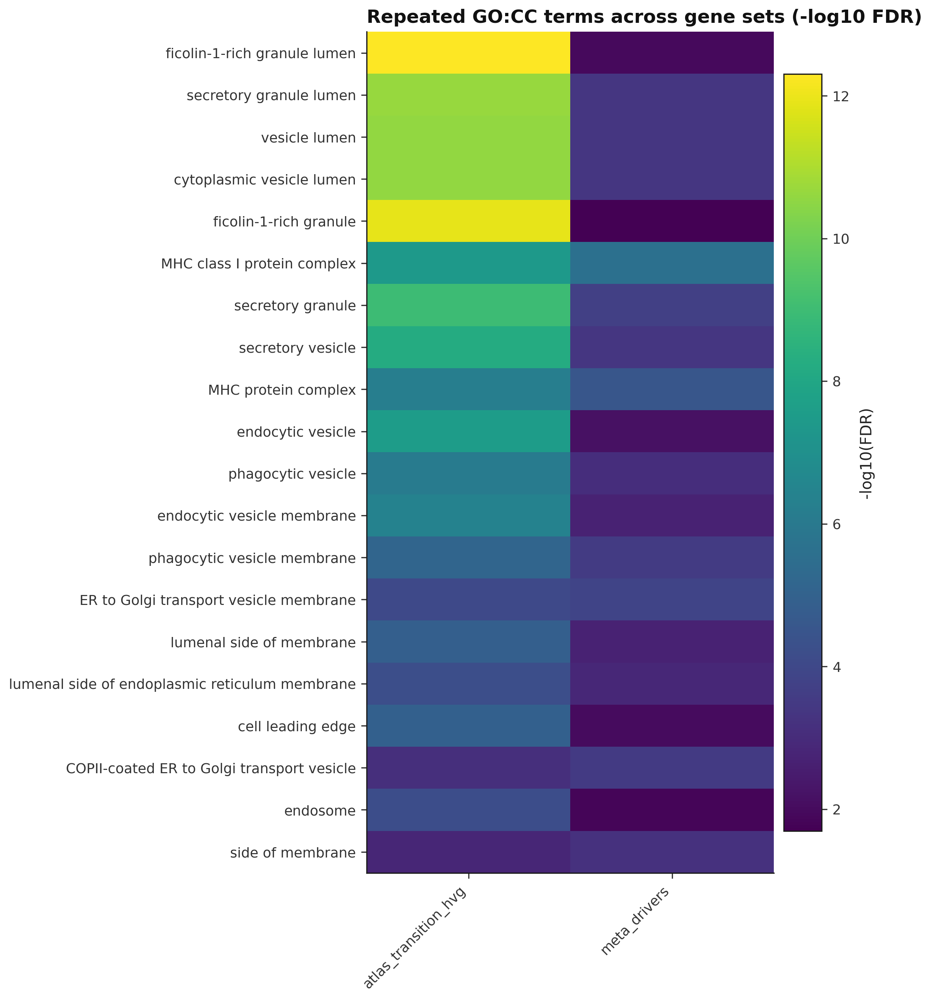

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>GO:CC 富集在不同 gene set 之间的复现热图（值为 -log10 FDR）。用于观察跨队列/多基因集合反复出现的功能主题。</div>

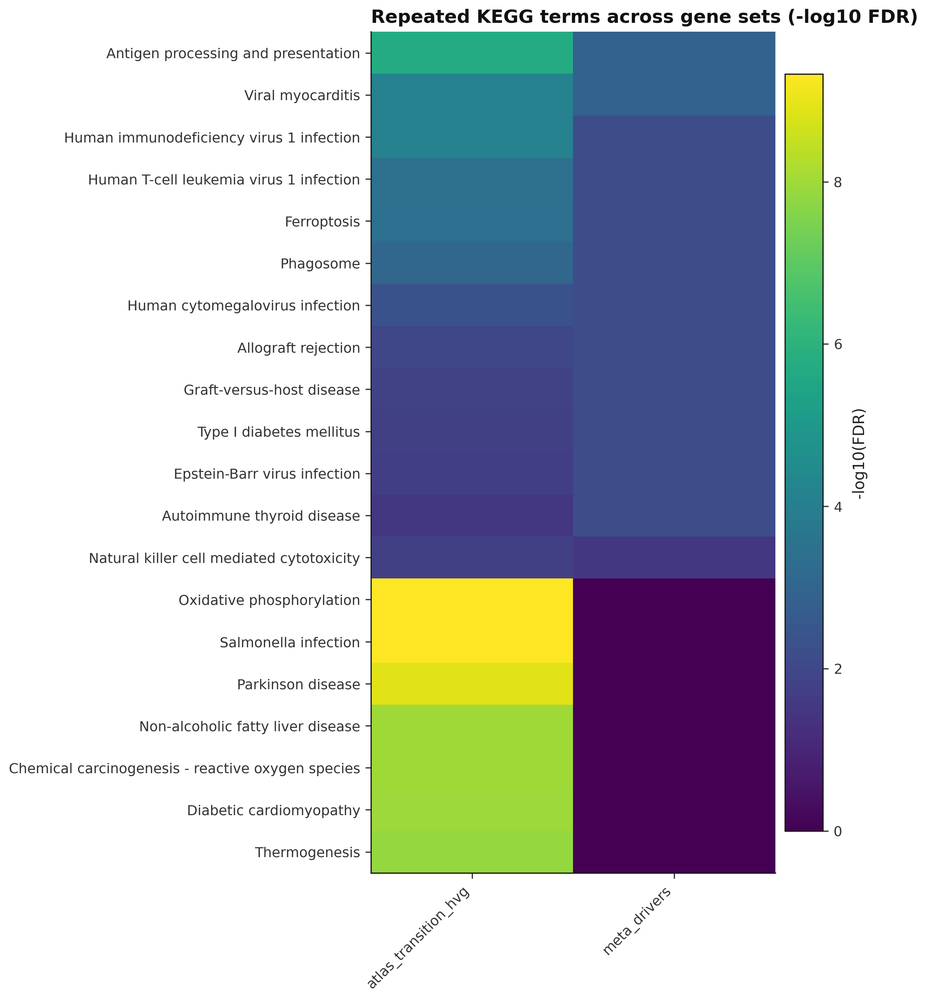

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>KEGG 富集在不同 gene set 之间的复现热图（值为 -log10 FDR）。用于观察跨队列/多基因集合反复出现的功能主题。</div>

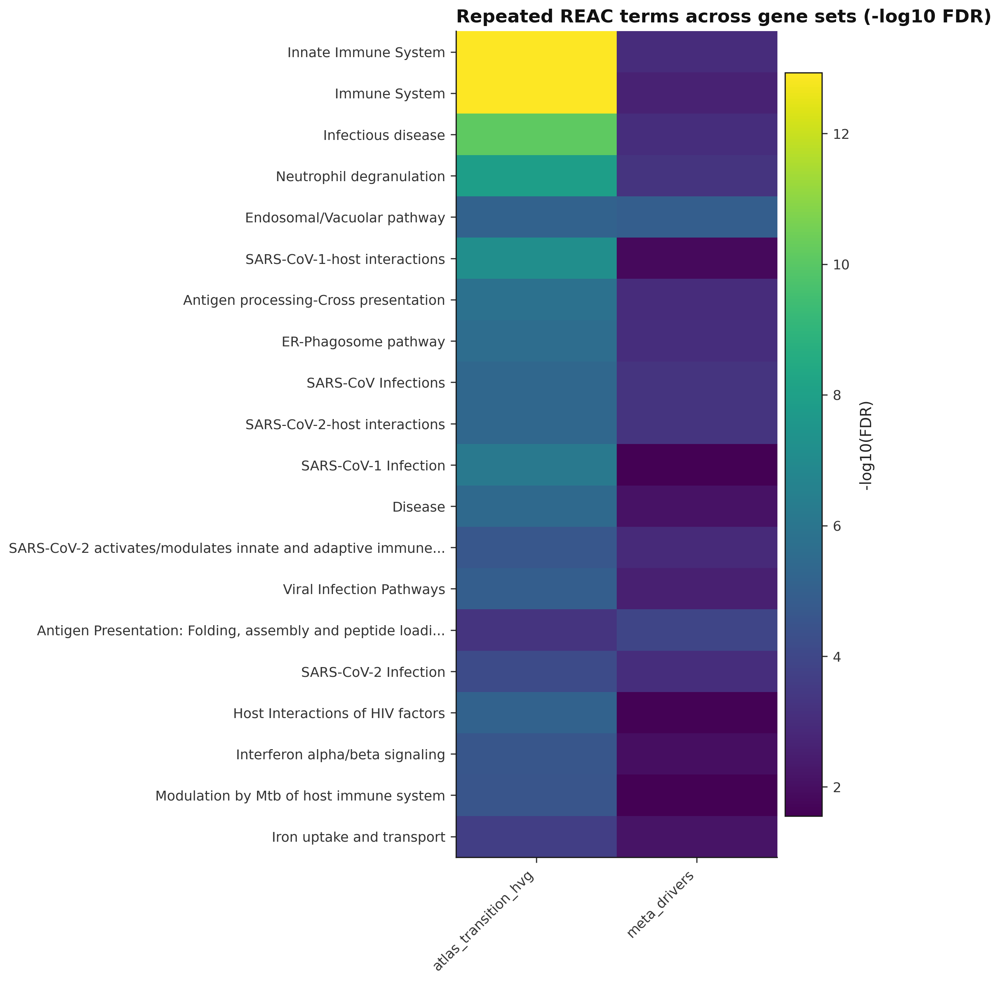

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>REAC 富集在不同 gene set 之间的复现热图（值为 -log10 FDR）。用于观察跨队列/多基因集合反复出现的功能主题。</div>

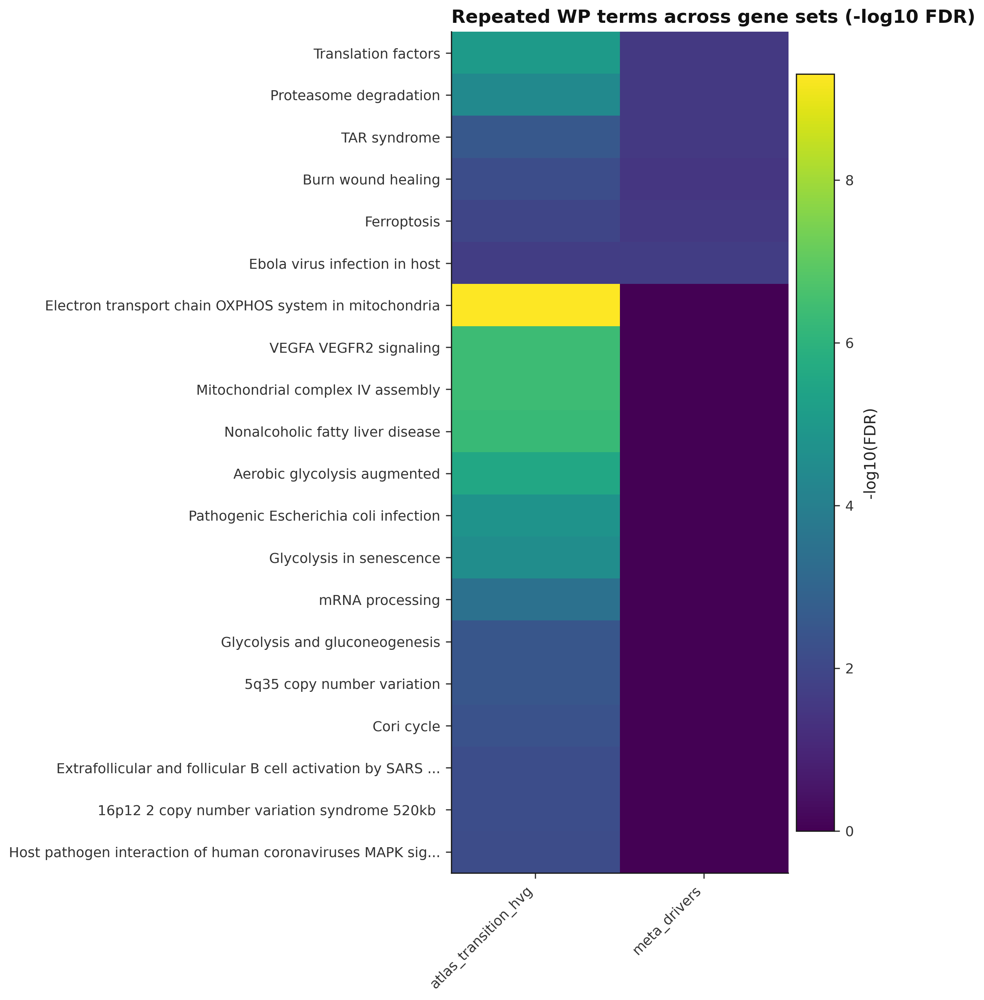

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>WP 富集在不同 gene set 之间的复现热图（值为 -log10 FDR）。用于观察跨队列/多基因集合反复出现的功能主题。</div>

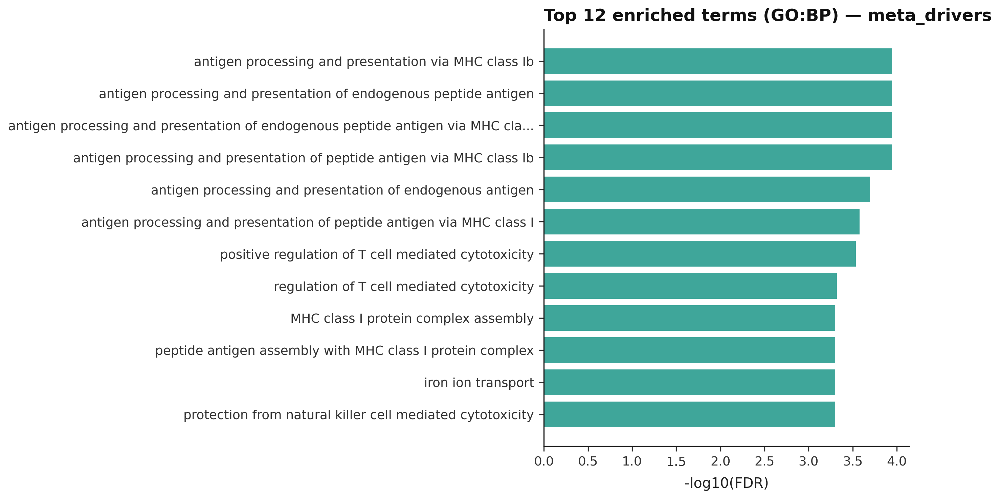

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>meta_drivers 在 GO:BP 的 top 富集条目（按 FDR 排序）。</div>

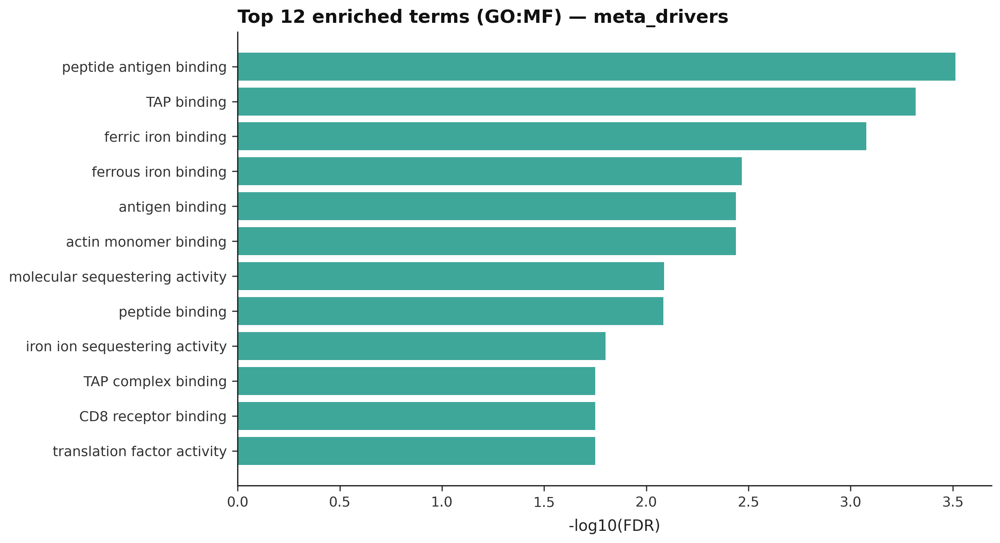

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>meta_drivers 在 GO:MF 的 top 富集条目（按 FDR 排序）。</div>

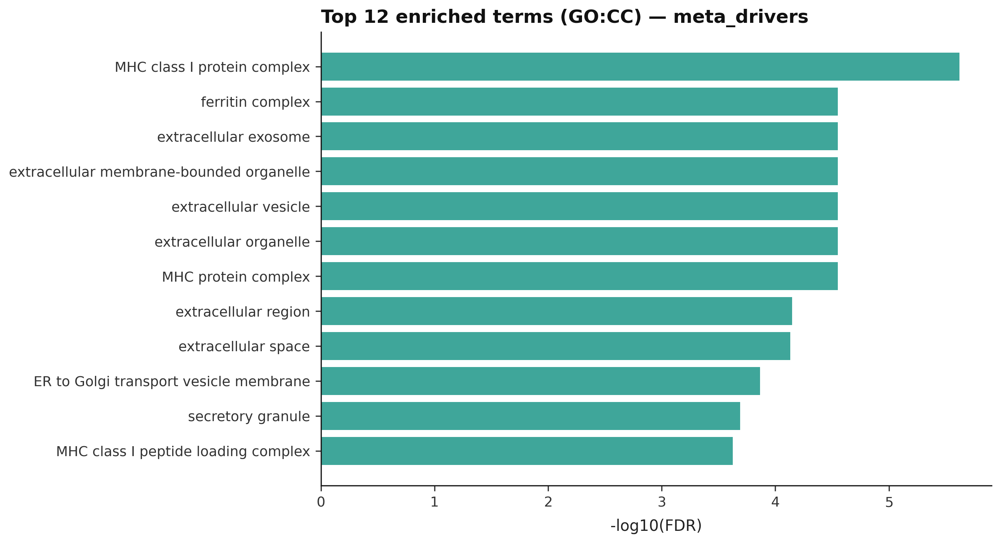

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>meta_drivers 在 GO:CC 的 top 富集条目（按 FDR 排序）。</div>

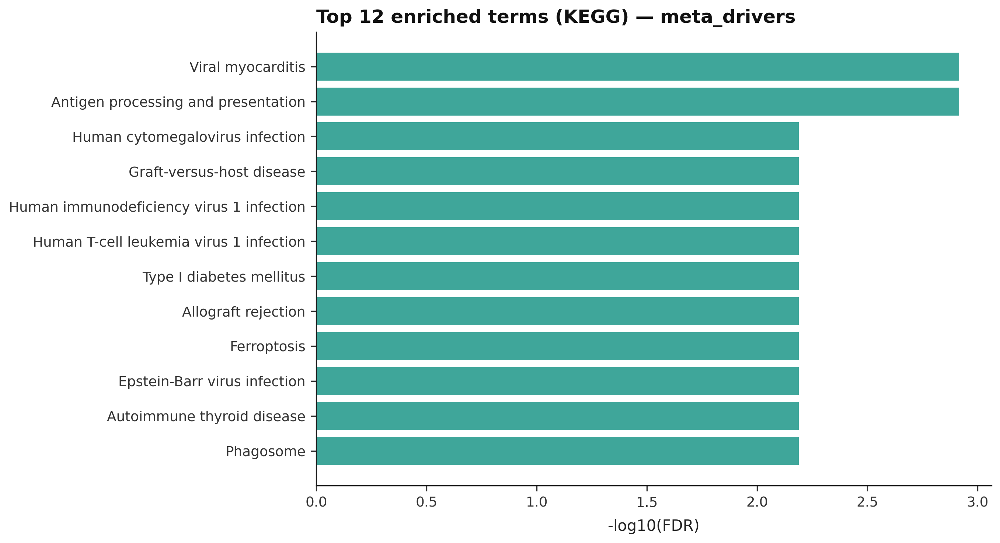

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>meta_drivers 在 KEGG 的 top 富集条目（按 FDR 排序）。</div>

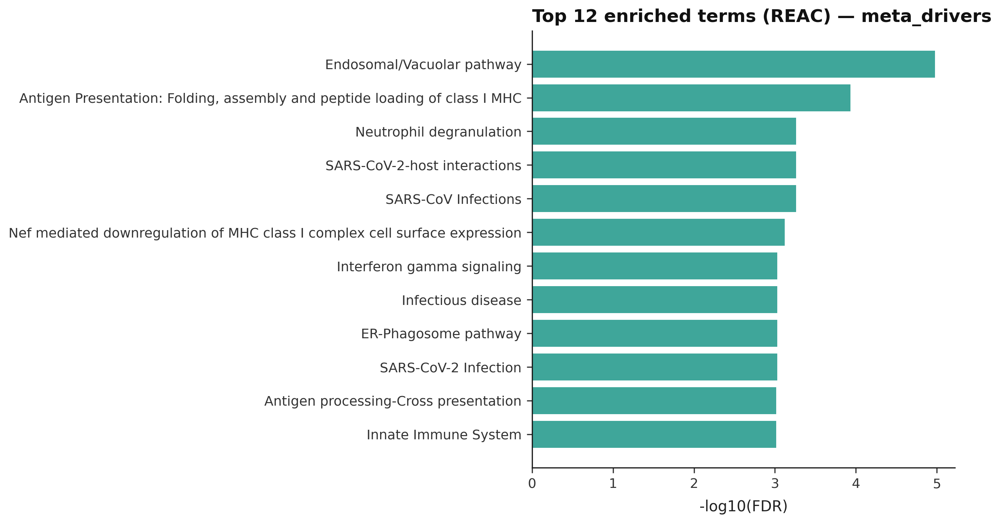

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>meta_drivers 在 REAC 的 top 富集条目（按 FDR 排序）。</div>

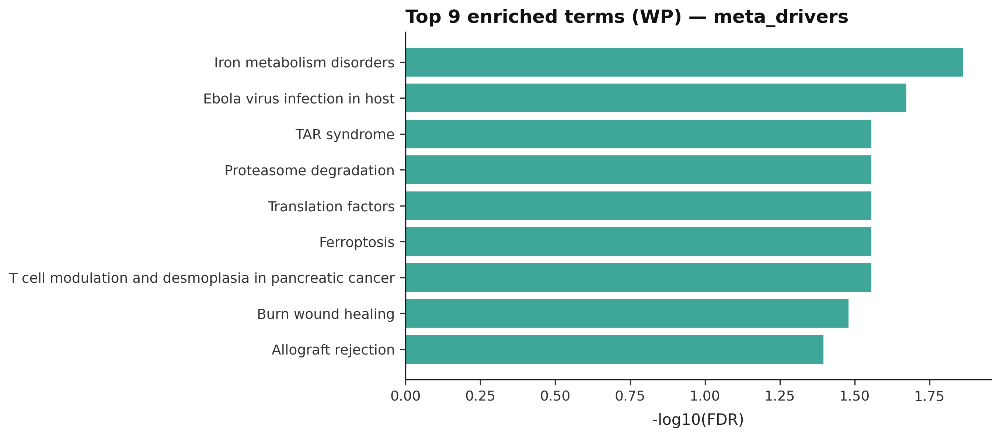

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>meta_drivers 在 WP 的 top 富集条目（按 FDR 排序）。</div>

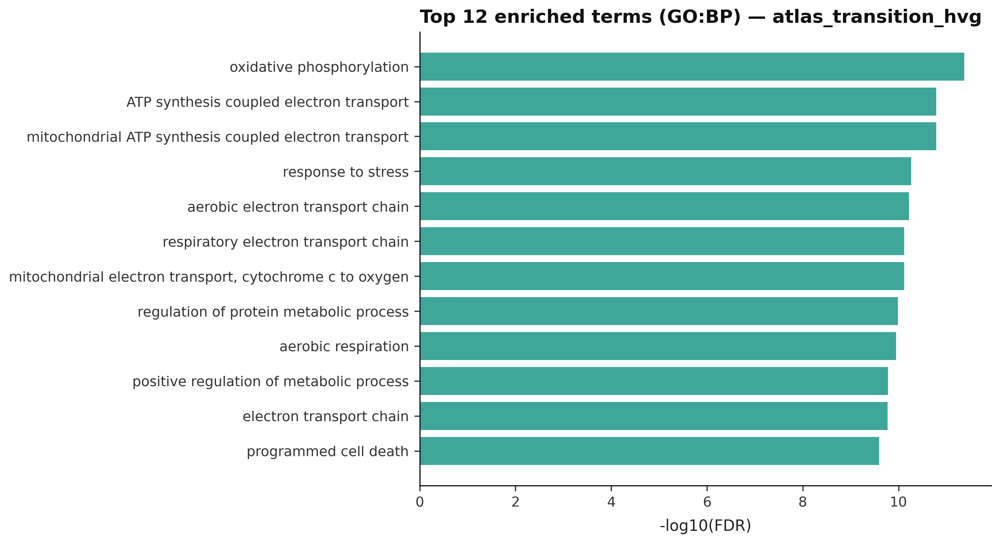

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>atlas_transition_hvg 在 GO:BP 的 top 富集条目（按 FDR 排序）。</div>

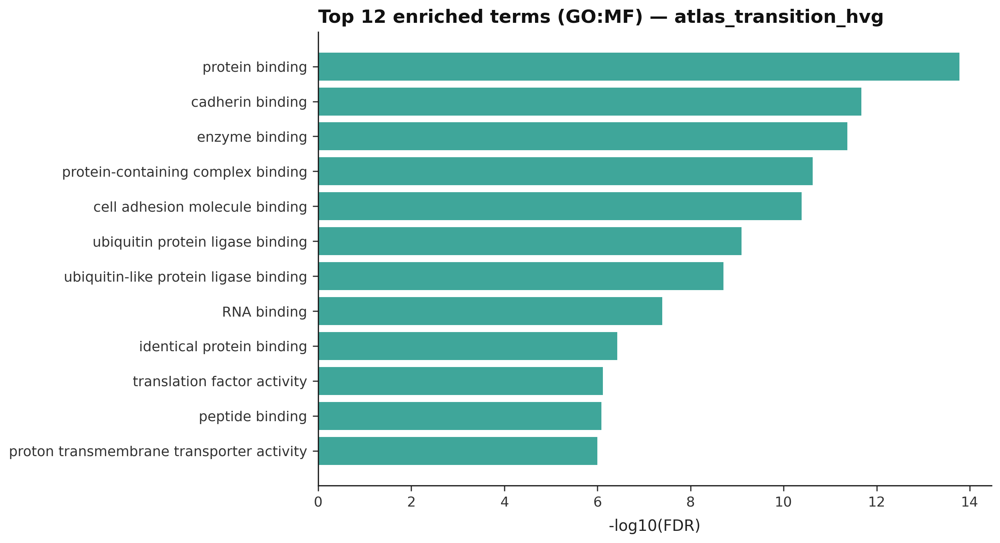

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>atlas_transition_hvg 在 GO:MF 的 top 富集条目（按 FDR 排序）。</div>

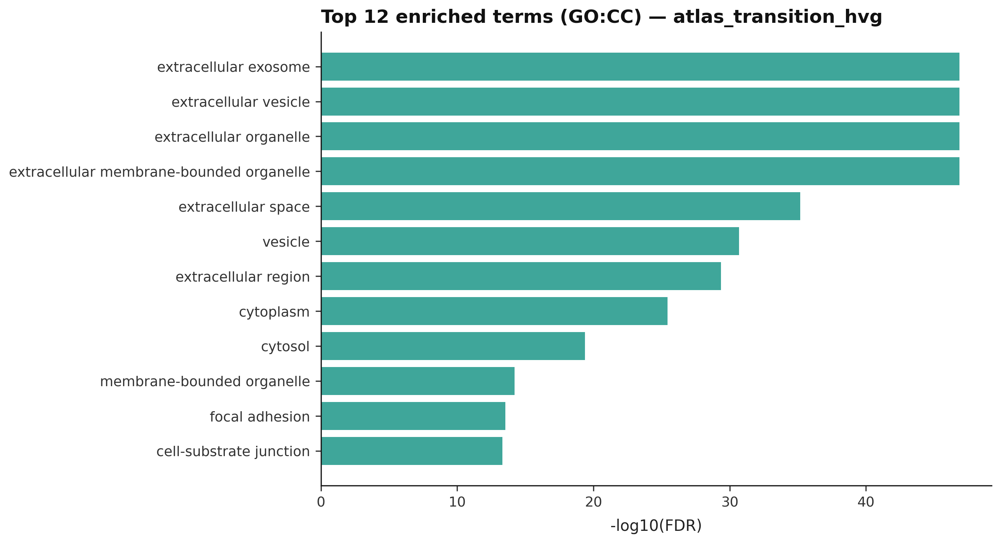

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>atlas_transition_hvg 在 GO:CC 的 top 富集条目（按 FDR 排序）。</div>

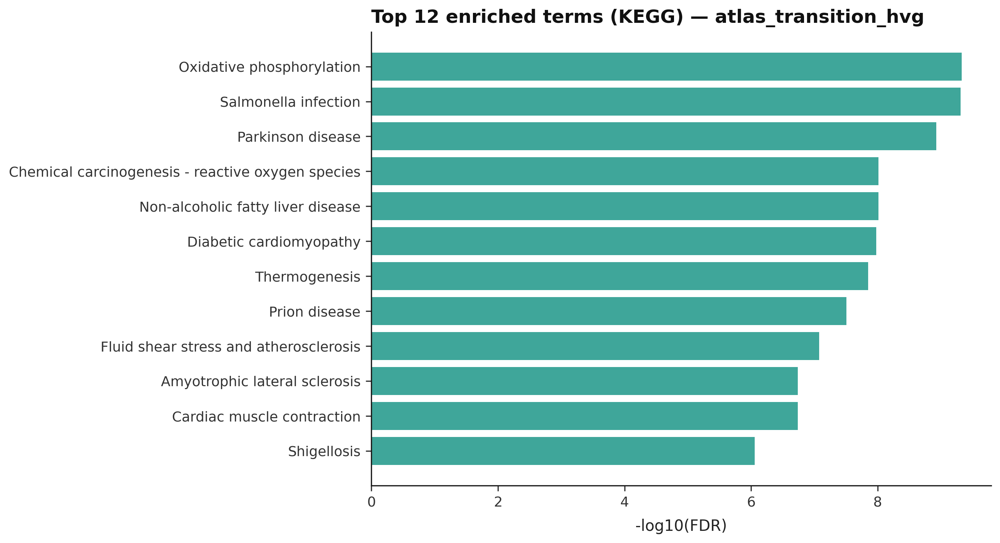

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>atlas_transition_hvg 在 KEGG 的 top 富集条目（按 FDR 排序）。</div>

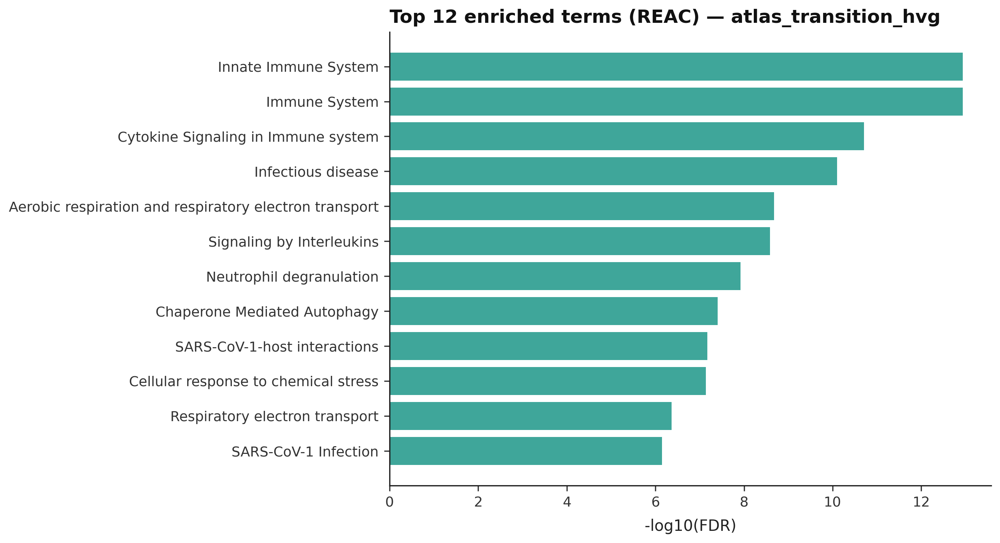

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>atlas_transition_hvg 在 REAC 的 top 富集条目（按 FDR 排序）。</div>

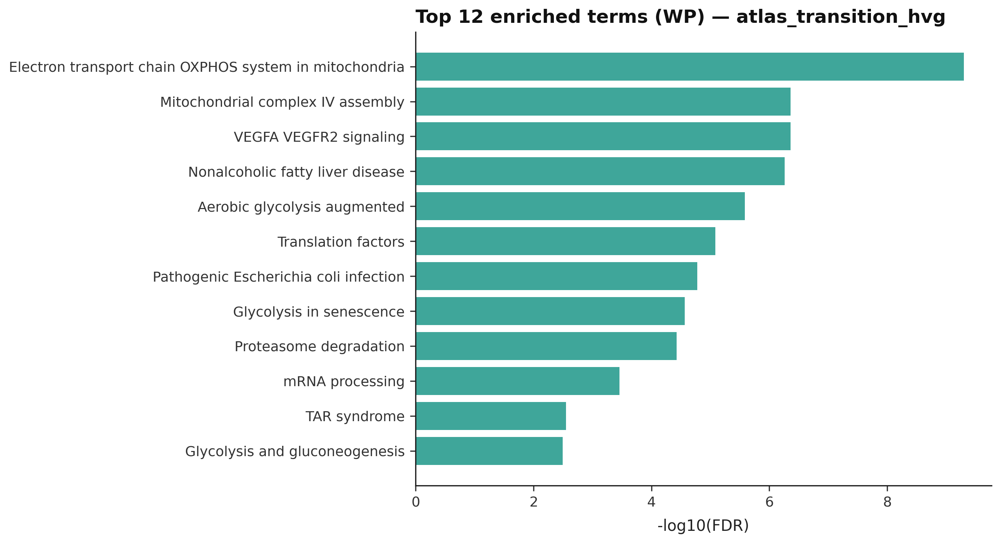

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>atlas_transition_hvg 在 WP 的 top 富集条目（按 FDR 排序）。</div>

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>综合证据优先级：将跨队列一致性（support/mean_rank）与 STRING 网络中心性（weighted_degree 等）整合，得到更适合后续验证的候选基因排序。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/integrated_prioritization_meta_network_head30.tsv</div>

  gene degree weighted_degree betweenness closeness pagerank clustering eigenvector community composite_score
EEF1A1      4           3.567      0.2308    0.3466   0.1066     0.3056      0.5383         0           1.794
  ACTB      4           3.429      0.3462    0.3925   0.1159          0      0.3458         2           1.651
   FAU      3            2.91     0.01282    0.2619  0.08717     0.6113      0.4726         0           1.112
   B2M      3           2.811      0.1795    0.2997  0.09019     0.3333      0.2211         1            1.01
 HLA-A      2           1.998           0    0.2241  0.06602          1       0.142         1          0.1667
 HLA-B      2           1.998           0    0.2241  0.06602          1       0.142         1          0.1667
  TPT1      2           1.903           0    0.2498  0.05912     0.9563      0.3765         0         0.06815
  EIF1      2           1.698           0    0.2268  0.05391     0.8776      0.3322         0         -0.1444
  FTH1    

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>数据驱动的共表达网络（atlas 子集，log1p(CPM) 相关）：按连接强度/中心性排序的 hub genes，可作为“协同变化模块”的证据补充。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/network_COEXPR_hubs_head25.tsv</div>

  gene degree weighted_degree betweenness closeness pagerank clustering eigenvector community
   B2M      5           2.479      0.3333    0.2342   0.1528     0.3413      0.5396         0
 HLA-B      5           2.417           0    0.2205   0.1486     0.3405      0.5383         0
 HLA-A      3           1.599           0    0.1815  0.09982     0.6974      0.4449         0
   FAU      4             1.5      0.2667    0.1871   0.1053     0.1967      0.2504         1
TMSB4X      4           1.348      0.1556    0.1681  0.09568        0.3      0.3094         0
EEF1A1      2          0.8789           0    0.1375  0.07064     0.5514     0.08016         1
  TPT1      2          0.7411           0    0.1207  0.06149     0.5514     0.06442         1
MALAT1      2          0.7308           0    0.1447  0.05187     0.6362       0.222         0
  FTH1      1          0.5774           0   0.05774  0.09091          0   2.967e-07         2
   FTL      1          0.5774           0   0.05774  0.09091

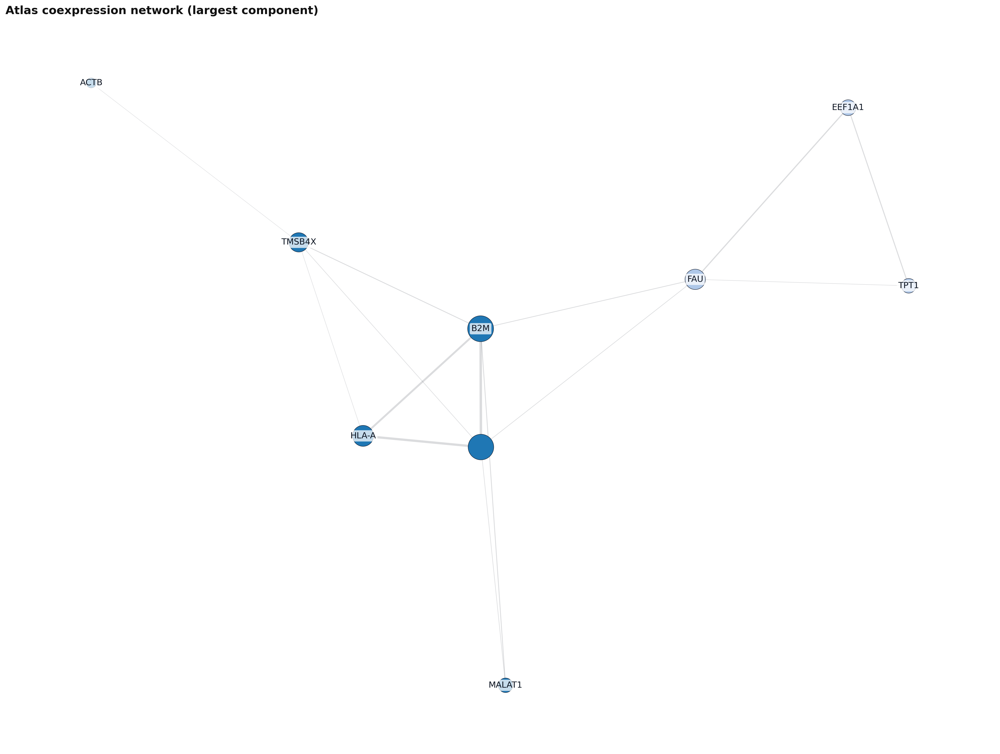

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>在 atlas（按状态筛选 + 下采样细胞）上构建的共表达网络，反映候选基因在数据中的协同变化关系。为避免标签拥挤，静态图仅标注少量高中心性 hub 基因（按 weighted_degree/pagerank 选择；其余节点可在交互图悬停查看名称/指标）。交互版：`results/figures/network_COEXPR_graph_interactive.html`（支持滚轮缩放/拖拽平移）。</div>

[打开交互网络图](/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/figures/network_COEXPR_graph_interactive.html)（支持滚轮缩放/拖拽平移；悬停可查看任意节点名称与指标）

说明：静态图只标注少量 hub，交互图支持缩放后查看密集区域；任意节点可悬停显示基因名与中心性指标。

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>综合优先级（共表达网络版）：跨队列一致性 + 共表达网络中心性，用于与 STRING 版优先级互补筛选候选基因。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/integrated_prioritization_meta_coexpression_head30.tsv</div>

  gene degree weighted_degree betweenness closeness pagerank clustering eigenvector community composite_score
   B2M      5           2.479      0.3333    0.2342   0.1528     0.3413      0.5396         0           1.815
 HLA-B      5           2.417           0    0.2205   0.1486     0.3405      0.5383         0           1.727
 HLA-A      3           1.599           0    0.1815  0.09982     0.6974      0.4449         0          0.5704
   FAU      4             1.5      0.2667    0.1871   0.1053     0.1967      0.2504         1          0.4301
TMSB4X      4           1.348      0.1556    0.1681  0.09568        0.3      0.3094         0          0.2155
EEF1A1      2          0.8789           0    0.1375  0.07064     0.5514     0.08016         1          -0.448
  TPT1      2          0.7411           0    0.1207  0.06149     0.5514     0.06442         1          -0.643
MALAT1      2          0.7308           0    0.1447  0.05187     0.6362       0.222         0         -0.6576
  FTH1    

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>STRING（知识网络）与共表达（数据网络）的 hub gene 重叠：重叠越多，越支持候选基因在“外部互作证据 + 数据协同变化”两方面一致。

表格预览：仅展示 前 30 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/network_hub_overlap_STRING_vs_COEXPR.tsv</div>

  gene weighted_degree_string pagerank_string weighted_degree_coexpr pagerank_coexpr
  ACTB                  3.429          0.1159                 0.3045         0.03201
   B2M                  2.811         0.09019                  2.479          0.1528
EEF1A1                  3.567          0.1066                 0.8789         0.07064
   FAU                   2.91         0.08717                    1.5          0.1053
  FTH1                  0.999         0.07143                 0.5774         0.09091
   FTL                  0.999         0.07143                 0.5774         0.09091
 HLA-A                  1.998         0.06602                  1.599         0.09982
 HLA-B                  1.998         0.06602                  2.417          0.1486
TMSB4X                  0.961         0.03833                  1.348         0.09568
  TPT1                  1.903         0.05912                 0.7411         0.06149


<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>Graphical Lasso 推断的部分相关网络（pseudobulk 级别，条件依赖更严格）：按中心性排序的 hub genes，更适合定义“直接耦合/调控模块”。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/network_PARTIALCORR_hubs_head25.tsv</div>

  gene degree weighted_degree betweenness closeness pagerank clustering eigenvector community
   FAU      8           1.208      0.1538   0.09631   0.1011    0.07779      0.3361         1
   B2M      6           1.148      0.1319   0.09561  0.09112     0.1474      0.4408         2
 HLA-B      3          0.9506      0.0989   0.09055  0.07527     0.3043      0.4263         2
 HLA-A      5          0.8705     0.05495   0.08637  0.07094     0.1191      0.3467         2
S100A6      5          0.8581      0.1868    0.1033  0.07318     0.1111      0.2665         2
  FTH1      4          0.8459      0.1429    0.0875  0.07236    0.08925      0.2022         0
  EIF1      6          0.8268     0.08791   0.09276  0.07152    0.09432      0.2536         1
MALAT1      4          0.7894     0.08791   0.09774  0.06786     0.1455      0.2167         1
   FTL      3          0.7757     0.05495   0.07956  0.06817     0.1157      0.1713         0
EEF1A1      4          0.7581      0.1429   0.09459  0.06761

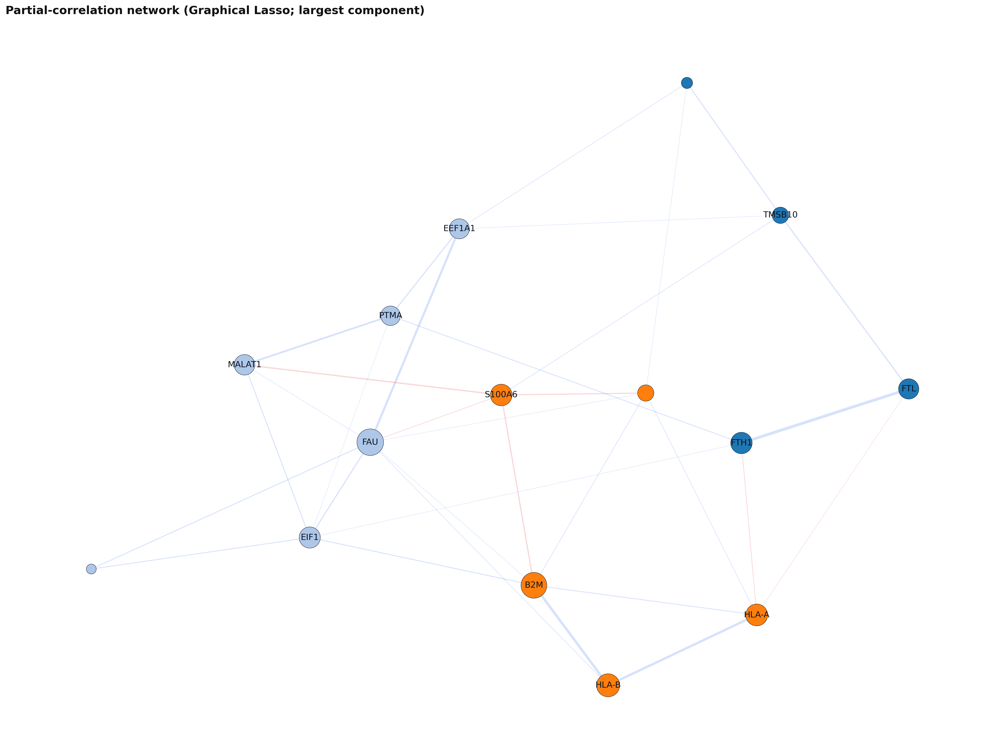

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>更高级的网络：Graphical Lasso 的部分相关（条件依赖）能抑制“间接相关”，得到更稀疏、更可解释的模块；边颜色表示正/负耦合。为避免标签拥挤，静态图仅标注少量高中心性 hub 基因（按 weighted_degree/pagerank 选择；其余节点可在交互图悬停查看名称/指标）。交互版：`results/figures/network_PARTIALCORR_graph_interactive.html`（支持滚轮缩放/拖拽平移）。</div>

[打开交互网络图](/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/figures/network_PARTIALCORR_graph_interactive.html)（支持滚轮缩放/拖拽平移；悬停可查看任意节点名称与指标）

说明：静态图只标注少量 hub，交互图支持缩放后查看密集区域；任意节点可悬停显示基因名与中心性指标。

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>综合优先级（Graphical Lasso 部分相关版）：跨队列一致性 + 条件依赖网络中心性，用于筛选更“直接耦合”的候选基因。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/integrated_prioritization_meta_partialcorr_head30.tsv</div>

  gene degree weighted_degree betweenness closeness pagerank clustering eigenvector community composite_score
   FAU      8           1.208      0.1538   0.09631   0.1011    0.07779      0.3361         1           1.826
   B2M      6           1.148      0.1319   0.09561  0.09112     0.1474      0.4408         2           1.576
 HLA-B      3          0.9506      0.0989   0.09055  0.07527     0.3043      0.4263         2          0.7525
 HLA-A      5          0.8705     0.05495   0.08637  0.07094     0.1191      0.3467         2          0.4184
S100A6      5          0.8581      0.1868    0.1033  0.07318     0.1111      0.2665         2          0.3663
  FTH1      4          0.8459      0.1429    0.0875  0.07236    0.08925      0.2022         0          0.3156
  EIF1      6          0.8268     0.08791   0.09276  0.07152    0.09432      0.2536         1          0.2358
MALAT1      4          0.7894     0.08791   0.09774  0.06786     0.1455      0.2167         1         0.07955
   FTL    

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>差异网络（NormalLike vs TumorLike）：按 |Δ partial_corr| 排序的 top edges，并附带两种状态下的部分相关值，便于解释“哪些互作被增强/削弱”。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/network_PARTIALCORR_differential_edges_head30.tsv</div>

gene_a gene_b delta_partial_corr abs_delta_partial_corr partial_corr_a partial_corr_b abs_partial_corr_a abs_partial_corr_b stronger_in
EEF1A1    FAU             0.3673                 0.3673       0.009757         0.3771           0.009757             0.3771   TumorLike
EEF1A1   EIF1            -0.2642                 0.2642         0.2642              0             0.2642                  0  NormalLike
S100A6  HLA-A            -0.2463                 0.2463         0.2463             -0             0.2463                  0  NormalLike
  FTH1    FTL              0.246                  0.246         0.2472         0.4933             0.2472             0.4933   TumorLike
  PTMA    FAU            -0.2319                 0.2319         0.2319              0             0.2319                  0  NormalLike
MALAT1 S100A6            -0.2275                 0.2275             -0        -0.2275                  0             0.2275  NormalLike
EEF1A1   ACTB            -0.2256                

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>rewiring gene ranking：每个基因对网络重构的贡献（sum |Δ partial_corr|）；可作为“肿瘤化网络重构中心”的候选基因列表。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/network_PARTIALCORR_rewiring_head30.tsv</div>

  gene rewiring_score rewiring_gain rewiring_loss delta_sum n_edges_abs_delta_ge_thr
S100A6          1.611             0         1.611    -1.611                        8
   FAU          1.337        0.6916        0.6453   0.04634                        4
EEF1A1          1.188        0.4993        0.6885   -0.1892                        3
  FTH1          1.134        0.3599        0.7739    -0.414                        5
TMSB4X          1.088        0.1234        0.9646   -0.8411                        4
  ACTB          1.074        0.2831        0.7912   -0.5081                        3
  PTMA          1.025        0.3015        0.7231   -0.4215                        3
   FTL          1.014        0.3332        0.6811   -0.3479                        2
   B2M         0.9912        0.4102         0.581   -0.1707                        4
 HLA-B          0.914        0.4663        0.4478    0.0185                        2
  TPT1         0.8772        0.1046        0.7726   -0.6681      

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>差异网络节点指标：rewiring 高且在差异网络中中心性高的基因，更可能处于 NormalLike→TumorLike 的网络重构关键位置。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/network_PARTIALCORR_differential_hubs_head25.tsv</div>

  gene degree weighted_degree betweenness closeness pagerank clustering eigenvector community rewiring_score
S100A6      8           1.471      0.4725    0.1187   0.1448    0.05283      0.4914         2          1.611
   FAU      4          0.9396     0.08791   0.08896  0.09306     0.1661      0.3814         0          1.337
EEF1A1      3          0.8571      0.1868   0.08283  0.08942          0      0.3065         0          1.188
  FTH1      5          0.8871      0.1648    0.0782   0.1002     0.0436      0.1929         1          1.134
TMSB4X      4          0.6788      0.1099   0.09596  0.07185    0.07266      0.2488         1          1.088
  ACTB      3          0.5824      0.1978   0.09531  0.06101       0.17      0.2696         2          1.074
  PTMA      3          0.4846     0.04396   0.07673  0.05197     0.1668      0.2097         0          1.025
   FTL      2          0.4286      0.1758   0.08586  0.04889          0      0.1832         1          1.014
   B2M      4      

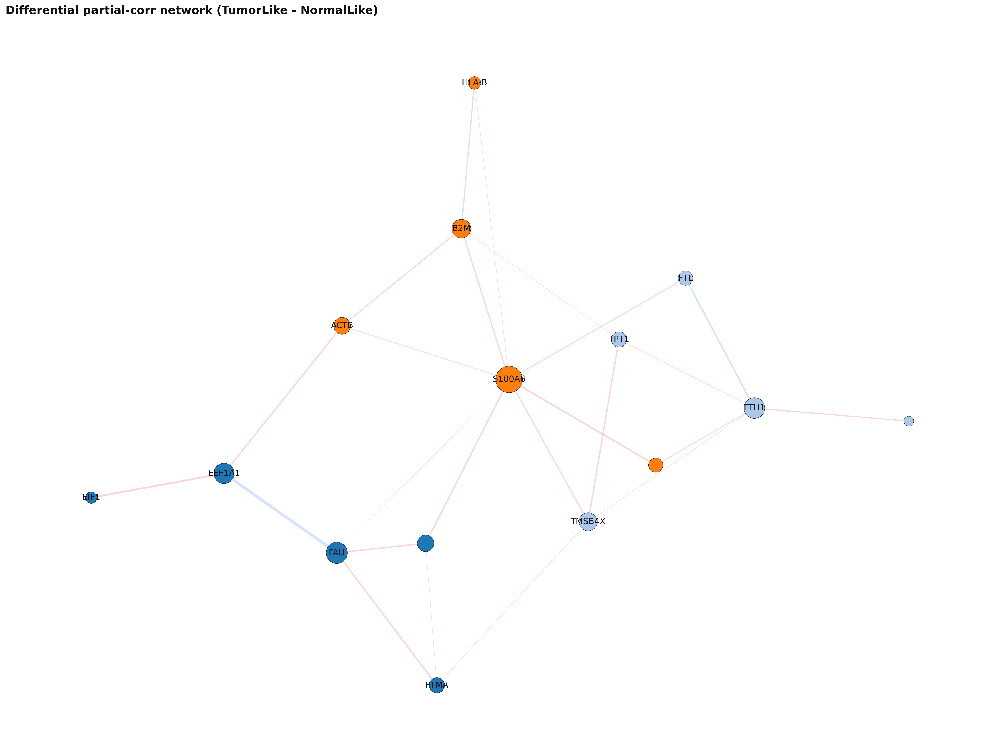

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>差异网络（TumorLike - NormalLike）：边颜色表示 Δpartial_corr 的正/负，节点大小为差异网络中心性，模块颜色为社区，用于展示“网络结构如何被重构”。为避免标签拥挤，静态图仅标注少量“重构中心”基因（优先按 rewiring_score，其次 weighted_degree/pagerank）。交互版：`results/figures/network_PARTIALCORR_differential_graph_interactive.html`（支持滚轮缩放/拖拽平移）。</div>

[打开交互网络图](/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/figures/network_PARTIALCORR_differential_graph_interactive.html)（支持滚轮缩放/拖拽平移；悬停可查看任意节点名称与指标）

交互图支持缩放查看密集区域；任意节点可悬停显示基因名与中心性/rewiring 指标。

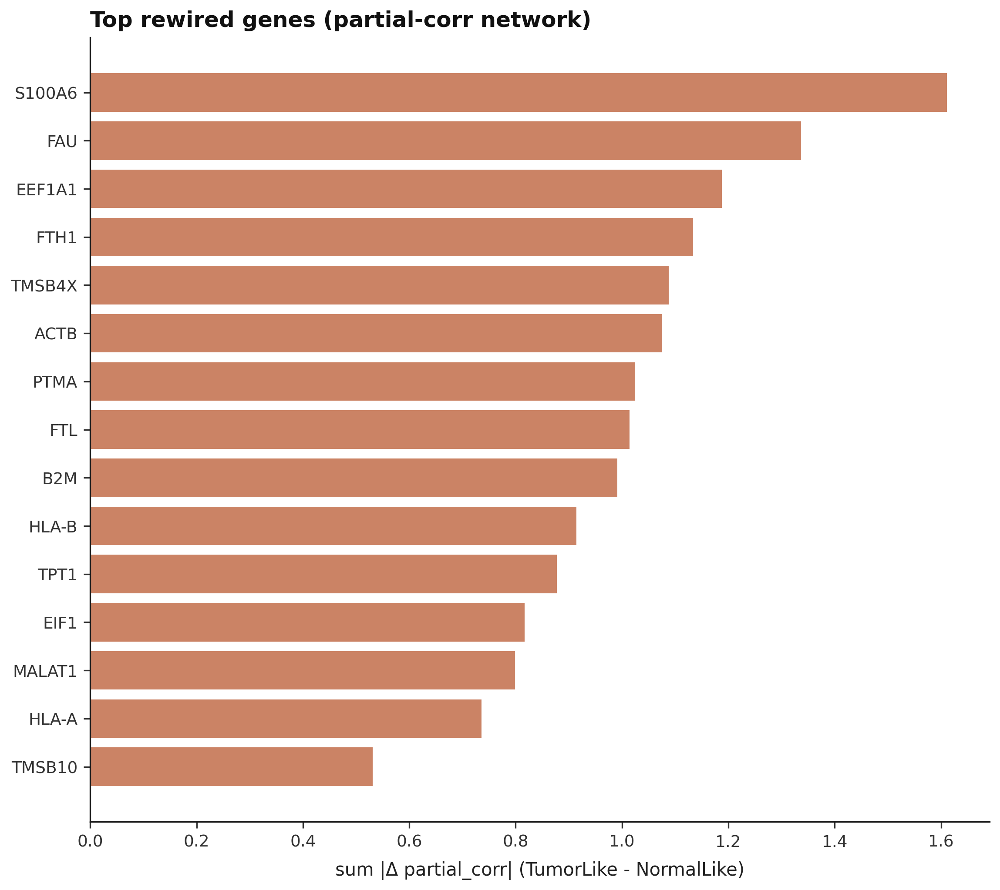

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>差异网络：同一正则化强度（或 shrinkage 方案）下比较 NormalLike vs TumorLike 的部分相关结构；rewiring 高的基因更可能处于肿瘤化过程的网络重构中心。</div>

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>多层网络综合优先级：将跨队列一致性（support/mean_rank）、三类网络中心性（STRING/共表达/部分相关）以及差异网络 rewiring 证据合并，形成更“论文级”的候选基因排序。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/integrated_prioritization_meta_multilayer_head30.tsv</div>

   gene STRING_weighted_degree STRING_pagerank STRING_betweenness COEXPR_weighted_degree COEXPR_pagerank COEXPR_betweenness PCORR_weighted_degree PCORR_pagerank PCORR_betweenness rewiring_score is_hub_STRING
    FAU                   2.91         0.08717            0.01282                    1.5          0.1053             0.2667                 1.208         0.1011            0.1538          1.337             1
    B2M                  2.811         0.09019             0.1795                  2.479          0.1528             0.3333                 1.148        0.09112            0.1319         0.9912             1
  HLA-B                  1.998         0.06602                  0                  2.417          0.1486                  0                0.9506        0.07527            0.0989          0.914             1
 EEF1A1                  3.567          0.1066             0.2308                 0.8789         0.07064                  0                0.7581        0.06761        

<div style='font-size:13px; color:#FFFFFF; background:#2F2F2F; padding:6px 10px; margin:6px 0 10px; border-radius:6px;'>多层共识网络 hub：同一互作边被 ≥2 类网络支持（STRING/共表达/部分相关），可作为更稳健的“核心互作模块”候选。

表格预览：仅展示 前 25 行 × 前 12 列（为便于展示，数值已格式化、长文本已截断）。
完整表格已保存：/media/xuchengjie/756e81e2-04b1-4f94-af30-d5215187f4b6/SRRSH/PDAC_scRNA/results/tables/network_multilayer_consensus_hubs_head25.tsv</div>

  gene degree weighted_degree betweenness closeness pagerank clustering eigenvector
   FAU      5           5.366       0.197    0.4232   0.1175      0.108      0.2738
   B2M      4           4.903      0.0303    0.3359  0.09576     0.2743      0.5312
 HLA-B      3           4.692     0.06061    0.3134  0.09053     0.4328      0.5447
 HLA-A      3           4.276           0     0.283  0.08388     0.4252       0.502
EEF1A1      3            4.22     0.09091     0.387  0.09382     0.2366      0.1867
  TPT1      2           2.818           0    0.3365  0.06438     0.7099      0.1538
  ACTB      2            2.36     0.06061    0.3325  0.05833          0     0.09169
TMSB4X      3           2.235     0.04545    0.3169  0.05426     0.1158      0.1458
  FTH1      1           2.032           0    0.1694  0.07692          0   2.709e-12
   FTL      1           2.032           0    0.1694  0.07692          0   2.709e-12
  EIF1      1           1.198           0    0.2891  0.03384          0     

['gene_set_summary',
 'enrichment_all',
 'term_support',
 'term_support_by_source',
 'string_edges',
 'string_nodes',
 'integrated_prioritization',
 'coexpr_edges',
 'coexpr_nodes',
 'coexpr_integrated',
 'coexpr_overlap',
 'coexpr_communities',
 'pcorr_edges',
 'pcorr_nodes',
 'pcorr_integrated',
 'pcorr_stability',
 'pcorr_communities',
 'pcorr_module_trait',
 'diff_edges',
 'diff_nodes',
 'diff_rewiring',
 'diff_communities',
 'multilayer_prioritization',
 'multilayer_edge_support',
 'multilayer_consensus_edges',
 'multilayer_consensus_nodes']

In [16]:
# Functional enrichment + STRING network analysis (paper-ready tables & figures)
analysis_path = ROOT / "notebooks" / "analysis_enrichment_network.py"
spec = importlib.util.spec_from_file_location("analysis_enrichment_network", analysis_path)
if spec is None or spec.loader is None:
    raise ImportError(f"Cannot import: {analysis_path}")
analysis_mod = importlib.util.module_from_spec(spec)
sys.modules[spec.name] = analysis_mod
spec.loader.exec_module(analysis_mod)

cfg = analysis_mod.EnrichmentNetworkConfig(
    include_per_gse_drivers=False,
    top_n_drivers_per_gse=200,
    min_topk_freq=0.8,
    top_n_meta=200,
    top_n_atlas_transition=200,
    # Enrichment sources (comprehensive): GO:BP/MF/CC + KEGG/Reactome/WikiPathways + CORUM/HP
    gprofiler_sources=("GO:BP", "GO:MF", "GO:CC", "KEGG", "REAC", "WP", "CORUM", "HP"),
    plot_term_support_sources=("GO:BP", "GO:MF", "GO:CC", "KEGG", "REAC", "WP"),
    term_support_top_n=20,
    string_required_score=700,
    network_max_genes=120,
    # Data-driven coexpression network on atlas (tumor-like cells by default)
    run_coexpression_network=True,
    coexpr_use_gene_set="meta_drivers",
    coexpr_state_values=("TumorLike",),
    coexpr_n_cells=20000,
    coexpr_min_abs_corr=0.3,
    coexpr_only_positive=True,
    coexpr_max_edges=4000,
    # Advanced network: Graphical Lasso partial-correlation (pseudobulk by sample_id)
    run_partial_corr_network=True,
    pcorr_use_gene_set="meta_drivers",
    pcorr_state_value="TumorLike",
    pcorr_tol=1e-3,
    pcorr_max_iter=1200,
    pcorr_alpha_max=3.0,
    pcorr_alpha_min=0.2,
    pcorr_alpha=0.2,
    pcorr_min_abs_partial_corr=0.06,
    pcorr_bootstrap_n=30,
    # Differential network (NormalLike vs TumorLike rewiring)
    run_differential_network=True,
    diff_min_abs_delta_partial_corr=0.12,
    force_requery=False,
    run_community_enrichment=True,
)

analysis_outputs = analysis_mod.run_enrichment_and_network_analysis(
    results_dir=RESULTS_DIR,
    processed_dir=PROCESSED_DIR,
    models_dir=MODELS_DIR,
    figures_dir=FIG_DIR,
    savefig=savefig,
    save_table=save_table,
    config=cfg,
    seed=SEED,
)
print("Enrichment dir:", RESULTS_DIR / "enrichment")
print("Network dir:", RESULTS_DIR / "network")
list(analysis_outputs)
